In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Packages

In [ ]:
#!pip install tensorflow==1.15.0

In [ ]:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 14823287939099981639
 xla_global_id: -1, name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 15349841920
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 18222416964383619688
 physical_device_desc: "device: 0, name: Tesla V100-SXM2-16GB, pci bus id: 0000:00:04.0, compute capability: 7.0"
 xla_global_id: 416903419]

In [ ]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0


In [ ]:
!python3 --version  #Python 3.7.12

Python 3.7.12


In [ ]:
#!pip install tensorflow==2.6.0

In [ ]:
#pip install keras==2.6

In [ ]:
import cProfile

In [ ]:
# click restart runtime to take effect
#!pip install h5py==2.10.0
!pip install h5py==3.1.0

In [ ]:
# import the necessary packages

from tensorflow.keras.datasets import mnist
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate, multiply
from tensorflow.keras.layers import BatchNormalization, Activation, ZeroPadding2D, Add
from tensorflow.keras.layers import PReLU, LeakyReLU
from tensorflow.keras.layers import UpSampling2D, Conv2D, Embedding
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
import datetime
import matplotlib.pyplot as plt
import sys
import numpy as np
import os
from tensorflow.keras.models import model_from_json
from tensorflow import keras

import tensorflow.keras.backend as K

In [ ]:
import datetime
import matplotlib.pyplot as plt
import sys
import numpy as np
import os

from unittest import mock
from contextlib import contextmanager

In [ ]:
import tensorflow as tf
import tensorflow.compat.v1 as v1     #https://www.tensorflow.org/guide/migrate/model_mapping
from tensorflow.compat.v1.keras.applications import VGG19


from unittest import mock
from contextlib import contextmanager

In [ ]:

from glob import glob
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
!pip install scipy==1.1.0
import scipy

In [ ]:
def load_weights_from_hdf5_group(f, layers):
  """Implements topological (order-based) weight loading.

  Arguments:
      f: A pointer to a HDF5 group.
      layers: a list of target layers.

  Raises:
      ValueError: in case of mismatch between provided layers
          and weights file.
  """
  if 'keras_version' in f.attrs:
    original_keras_version = f.attrs['keras_version']
  else:
    original_keras_version = '1'
  if 'backend' in f.attrs:
    original_backend = f.attrs['backend']
  else:
    original_backend = None

  filtered_layers = []
  for layer in layers:
    weights = _legacy_weights(layer)
    if weights:
      filtered_layers.append(layer)

  layer_names = load_attributes_from_hdf5_group(f, 'layer_names')
  filtered_layer_names = []
  for name in layer_names:
    g = f[name]
    weight_names = load_attributes_from_hdf5_group(g, 'weight_names')
    if weight_names:
      filtered_layer_names.append(name)
  layer_names = filtered_layer_names
  if len(layer_names) != len(filtered_layers):
    raise ValueError('You are trying to load a weight file '
                     'containing ' + str(len(layer_names)) +
                     ' layers into a model with ' + str(len(filtered_layers)) +
                     ' layers.')

  # We batch weight value assignments in a single backend call
  # which provides a speedup in TensorFlow.
  weight_value_tuples = []
  for k, name in enumerate(layer_names):
    g = f[name]
    weight_names = load_attributes_from_hdf5_group(g, 'weight_names')
    weight_values = [np.asarray(g[weight_name]) for weight_name in weight_names]
    layer = filtered_layers[k]
    symbolic_weights = _legacy_weights(layer)
    weight_values = preprocess_weights_for_loading(
        layer, weight_values, original_keras_version, original_backend)
    if len(weight_values) != len(symbolic_weights):
      raise ValueError('Layer #' + str(k) + ' (named "' + layer.name +
                       '" in the current model) was found to '
                       'correspond to layer ' + name + ' in the save file. '
                       'However the new layer ' + layer.name + ' expects ' +
                       str(len(symbolic_weights)) +
                       ' weights, but the saved weights have ' +
                       str(len(weight_values)) + ' elements.')
    weight_value_tuples += zip(symbolic_weights, weight_values)
  K.batch_set_value(weight_value_tuples)

# SRGAN

## dataloader

In [ ]:
# this data loader load file from 2 paths --> both 256x256     ## use this one for CS236 project/ Random select
import cv2
import scipy.misc

class DataLoader():
    def __init__(self, dataset_name, img_res=(256, 256)):
      self.dataset_name = dataset_name
      self.img_res = img_res

    def load_data(self, batch_size=1, is_testing=True):
      data_type = "train" if not is_testing else "test"
        
      #path = glob('/content/drive/My Drive/%s/*' % (self.dataset_name))
      path = glob('/content/drive/My Drive/CS236_train/*')

      batch_images = np.random.choice(path, size=batch_size)

      imgs_1 = []
      imgs_2 = []
      for img_path in batch_images:
        print('Degraded HR path: '+img_path)
        
        img_path2 = os.path.join('/content/drive/My Drive/original good images',img_path.split('/')[-2],img_path.split('/')[-1].split('.')[-2]+'_halftoned.'+img_path.split('/')[-1].split('.')[-1])
        print('Original HR path: '+ img_path2)

        img_1 = self.imread(img_path)
        img_1 = scipy.misc.imresize(img_1, self.img_res)
        
        #print(img.shape)
        img_2 = self.imread(img_path2)
        img_2 = scipy.misc.imresize(img_2, self.img_res)
             
        imgs_1.append(img_1)
        imgs_2.append(img_2)

      imgs_1 = np.array(imgs_1)/ 127.5 - 1. 
      imgs_2 = np.array(imgs_2)/ 127.5 - 1.

      return imgs_1, imgs_2

    def imread(self, path):
      return scipy.misc.imread(path, mode='RGB').astype(np.float)


In [ ]:
# this data loader load file from 2 paths --> both 256x256     ## use this one for CS236 project. Iterate over all sample/ use for testing 
import cv2
import scipy.misc

class DataLoader():
    def __init__(self, dataset_name, img_res=(256, 256)):
      self.dataset_name = dataset_name
      self.img_res = img_res

    def load_data(self, batch_size=1, is_testing=True):
      data_type = "train" if not is_testing else "test"
        
      #path = glob('/content/drive/My Drive/%s/*' % (self.dataset_name))
      path = glob('/content/drive/My Drive/CS236_test_sample/*')
      #path = glob('/content/drive/My Drive/CS236_test/*')
      #path = glob('/content/drive/My Drive/img_align_celeba/*')

      
      imgs_1 = []
      imgs_2 = []
      for img_path in path:
        print('Degraded HR path: '+img_path)
        
        img_path2 = os.path.join('/content/drive/My Drive/original good images',img_path.split('/')[-2],img_path.split('/')[-1].split('.')[-2]+'_halftoned.'+img_path.split('/')[-1].split('.')[-1])
        print('Original HR path: '+ img_path2)

        img_1 = self.imread(img_path)
        img_1 = scipy.misc.imresize(img_1, self.img_res)
        
        #print(img.shape)
        img_2 = self.imread(img_path2)
        img_2 = scipy.misc.imresize(img_2, self.img_res)
             
        imgs_1.append(img_1)
        imgs_2.append(img_2)

      imgs_1 = np.array(imgs_1)/ 127.5 - 1. 
      imgs_2 = np.array(imgs_2)/ 127.5 - 1.

      return imgs_1, imgs_2

    def imread(self, path):
      return scipy.misc.imread(path, mode='RGB').astype(np.float)


In [ ]:
# this DataLoader loads HR　data and turn it into LR: return HR/LR pair 
class DataLoader():
    def __init__(self, dataset_name, img_res=(128, 128)):
        self.dataset_name = dataset_name
        self.img_res = img_res

    def load_data(self, batch_size=1, is_testing=False):
        data_type = "train" if not is_testing else "test"
        
        path = glob('/content/drive/My Drive/%s/*' % (self.dataset_name))

        batch_images = np.random.choice(path, size=batch_size)

        imgs_hr = []
        imgs_lr = []
        for img_path in batch_images:
            img = self.imread(img_path)

            h, w = self.img_res
            low_h, low_w = int(h / 4), int(w / 4)

            img_hr = scipy.misc.imresize(img, self.img_res)
            img_lr = scipy.misc.imresize(img, (low_h, low_w))

            # If training => do random flip
            if not is_testing and np.random.random() < 0.5:
                img_hr = np.fliplr(img_hr)
                img_lr = np.fliplr(img_lr)

            imgs_hr.append(img_hr)
            imgs_lr.append(img_lr)

        imgs_hr = np.array(imgs_hr) / 127.5 - 1.
        imgs_lr = np.array(imgs_lr) / 127.5 - 1.

        return imgs_hr, imgs_lr


    def imread(self, path):
        return scipy.misc.imread(path, mode='RGB').astype(np.float)


In [ ]:
# this data loader load file from path --> make a LR version; also looks up a original HR image from path2
class DataLoader():
    def __init__(self, dataset_name, img_res=(128, 128)):
      self.dataset_name = dataset_name
      self.img_res = img_res

    def load_data(self, batch_size=1, is_testing=False):
      data_type = "train" if not is_testing else "test"
        
      path = glob('/content/drive/My Drive/%s/*' % (self.dataset_name))

      batch_images = np.random.choice(path, size=batch_size)

      imgs_hr = []
      imgs_lr = []
      for img_path in batch_images:
        print('Degraded HR path: '+img_path)
        
        img_path2 = os.path.join('/content/drive/My Drive/original good images',img_path.split('/')[-2],img_path.split('/')[-1])
        print('Original HR path: '+ img_path2)

        img = self.imread(img_path)
        #print(img.shape)
        img_good = self.imread(img_path2)

        h, w = self.img_res
        low_h, low_w = int(h / 4), int(w / 4)

        #img_hr = scipy.misc.imresize(img, self.img_res)
        img_hr = scipy.misc.imresize(img_good, self.img_res)
        img_lr = scipy.misc.imresize(img, (low_h, low_w))

        # If training => do random flip
        if not is_testing and np.random.random() < 0.5:
          img_hr = np.fliplr(img_hr)
          img_lr = np.fliplr(img_lr)

        imgs_hr.append(img_hr)
        imgs_lr.append(img_lr)

      imgs_hr = np.array(imgs_hr) / 127.5 - 1.
      imgs_lr = np.array(imgs_lr) / 127.5 - 1.

      return imgs_hr, imgs_lr

    def imread(self, path):
      return scipy.misc.imread(path, mode='RGB').astype(np.float)

In [ ]:
# this data loader load file from path --> make a LR version; also looks up a original HR image from path2   (32x32) to (288x288)
class DataLoader():
    def __init__(self, dataset_name, img_res=(288, 288)):
      self.dataset_name = dataset_name
      self.img_res = img_res

    def load_data(self, batch_size=1, is_testing=False):
      data_type = "train" if not is_testing else "test"
        
      path = glob('/content/drive/My Drive/%s/*' % (self.dataset_name))

      batch_images = np.random.choice(path, size=batch_size)

      imgs_hr = []
      imgs_lr = []
      for img_path in batch_images:
        print('Degraded HR path: '+img_path)
        
        img_path2 = os.path.join('/content/drive/My Drive/original good images',img_path.split('/')[-2],img_path.split('/')[-1].split('.')[-2]+'_halftoned.'+img_path.split('/')[-1].split('.')[-1])
        print('Original HR path: '+ img_path2)

        img = self.imread(img_path)
        #print(img.shape)
        img_good = self.imread(img_path2)

        h, w = self.img_res
        low_h, low_w = int(h / 3), int(w / 3)

        #img_hr = scipy.misc.imresize(img, self.img_res)
        img_hr = scipy.misc.imresize(img_good, self.img_res)
        img_lr = scipy.misc.imresize(img, (low_h, low_w))

        # If training => do random flip
        if not is_testing and np.random.random() < 0.5:
          img_hr = np.fliplr(img_hr)
          img_lr = np.fliplr(img_lr)

        imgs_hr.append(img_hr)
        imgs_lr.append(img_lr)

      
      imgs_hr = np.array(imgs_hr) / 127.5 - 1.
      imgs_lr = np.array(imgs_lr) / 127.5 - 1.

      return imgs_hr, imgs_lr

    def imread(self, path):
      return scipy.misc.imread(path, mode='RGB').astype(np.float)

In [ ]:
# this data loader load file from path --> make a LR version; (72x72) to (288x288)origin
class DataLoader():
    def __init__(self, dataset_name, img_res=(288, 288)):
      self.dataset_name = dataset_name
      self.img_res = img_res

    def load_data(self, batch_size=1, is_testing=False):
      data_type = "train" if not is_testing else "test"
        
      path = glob('/content/drive/My Drive/%s/*' % (self.dataset_name))

      batch_images = np.random.choice(path, size=batch_size)

      imgs_hr = []
      imgs_lr = []
      for img_path in batch_images:
        print('original HR path: '+img_path)
        
        #img_path2 = os.path.join('/content/drive/My Drive/original good images',img_path.split('/')[-2],img_path.split('/')[-1].split('.')[-2]+'_halftoned.'+img_path.split('/')[-1].split('.')[-1])
        #print('Original HR path: '+ img_path2)

        img = self.imread(img_path)
        #print(img.shape)
        

        h, w = self.img_res
        low_h, low_w = int(h / 4), int(w / 4)

        #img_hr = scipy.misc.imresize(img, self.img_res)
        img_hr = scipy.misc.imresize(img, self.img_res)
        img_lr = scipy.misc.imresize(img, (low_h, low_w))

        # If training => do random flip
        #if not is_testing and np.random.random() < 0.5:
        #  img_hr = np.fliplr(img_hr)
        #  img_lr = np.fliplr(img_lr)

        imgs_hr.append(img_hr)
        imgs_lr.append(img_lr)

      
      imgs_hr = np.array(imgs_hr) / 127.5 - 1.
      imgs_lr = np.array(imgs_lr) / 127.5 - 1.

      return imgs_hr, imgs_lr

    def imread(self, path):
      return scipy.misc.imread(path, mode='RGB').astype(np.float)

In [ ]:
# this data loader load file from path --> make a LR version --> mkae halftoned; also looks up a original HR image from path2   (72x72)halftoned to (288x288)origin
class DataLoader():
    def __init__(self, dataset_name, img_res=(288, 288)):
      self.dataset_name = dataset_name
      self.img_res = img_res

    def load_data(self, batch_size=1, is_testing=False):
      data_type = "train" if not is_testing else "test"
        
      path = glob('/content/drive/My Drive/%s/*' % (self.dataset_name))

      batch_images = np.random.choice(path, size=batch_size)

      imgs_hr = []
      imgs_lr = []
      for img_path in batch_images:
        print('original HR path: '+img_path)
        
        #img_path2 = os.path.join('/content/drive/My Drive/original good images',img_path.split('/')[-2],img_path.split('/')[-1].split('.')[-2]+'_halftoned.'+img_path.split('/')[-1].split('.')[-1])
        #print('Original HR path: '+ img_path2)

        img = self.imread(img_path)
        #print(img.shape)
        
        

        h, w = self.img_res
        low_h, low_w = int(h / 4), int(w / 4)

        #img_hr = scipy.misc.imresize(img, self.img_res)
        img_hr = scipy.misc.imresize(img, self.img_res)
        img_lr = scipy.misc.imresize(img, (low_h, low_w))

        
        plt.imshow(img_lr)
        plt.axis('off')
        halftoned_path = os.path.join('/content/drive/My Drive/original good images',img_path.split('/')[-2],img_path.split('/')[-1].split('.')[-2]+'_lr.'+img_path.split('/')[-1].split('.')[-1])
        #print(img_lr.shape)   72,72,3
        print(halftoned_path)

        plt.savefig(halftoned_path)
        #fig.savefig(halftoned_path)
       
        h = Halftone(halftoned_path)
        h.make(sample=4,percentage=0,antialias=True)

        img_path2 = os.path.join('/content/drive/My Drive/original good images',img_path.split('/')[-2],img_path.split('/')[-1].split('.')[-2]+'_lr_halftoned.'+img_path.split('/')[-1].split('.')[-1])
        img_lr = self.imread(img_path2)
        img_lr = scipy.misc.imresize(img_lr, (low_h, low_w))
        print(img_lr.shape)
        

        # If training => do random flip
        #if not is_testing and np.random.random() < 0.5:
        #  img_hr = np.fliplr(img_hr)
        #  img_lr = np.fliplr(img_lr)

        imgs_hr.append(img_hr)
        imgs_lr.append(img_lr)

      
      imgs_hr = np.array(imgs_hr) / 127.5 - 1.
      imgs_lr = np.array(imgs_lr) / 127.5 - 1.

      return imgs_hr, imgs_lr

    def imread(self, path):
      return scipy.misc.imread(path, mode='RGB').astype(np.float)

In [ ]:
from PIL import Image
image = Image.open('/content/drive/My Drive/original good images/img_align_celeba/3961095_halftoned.jpg')

if image.mode == 'CMYK':
    rgb_image = image.convert('RGB')

#img2 = plt.imread('/content/drive/My Drive/original good images/img_align_celeba/3961095_halftoned.jpg')
#plt.imshow(img2)
img2 = scipy.misc.imresize(rgb_image, (128,128))
img2 = np.array(img2) / 127.5 - 1
print(np.max(img2))   #normalize to 1 
print(img2.shape)

#plt.imshow(img2)
img2 = (img2,img2)
plt.imshow(img2[0])


FileNotFoundError: ignored

## Halftone

### code

In [ ]:
import os
import sys

from PIL import Image, ImageDraw, ImageOps, ImageStat

"""
Class: Halftone( path )
Usage:
    import halftone
    h = halftone.Halftone('/path/to/image.jpg')
    h.make()

The bulk of this is taken from this Stack Overflow answer by fraxel:
http://stackoverflow.com/a/10575940/250962
"""


class Halftone(object):
    def __init__(self, path):
        """
        path is the path to the image we want to halftone.
        """
        self.path = path

    def make(
        self,
        sample=10,
        scale=1,
        percentage=0,
        filename_addition="_halftoned",
        angles=[0, 15, 30, 45],
        style="color",
        antialias=False,
        output_format="default",
        output_quality=75,
        save_channels=False,
        save_channels_format="default",
        save_channels_style="color",
    ):
        """
        Leave filename_addition empty to save the image in place.
        Arguments:
            sample: Sample box size from original image, in pixels.
            scale: Max output dot diameter is sample * scale (which is also the
                number of possible dot sizes)
            percentage: How much of the gray component to remove from the CMY
                channels and put in the K channel.
            filename_addition: What to add to the filename (before the extension).
            angles: A list of 4 angles that each screen channel should be rotated by.
            style: 'color' or 'grayscale'.
            antialias: boolean.
            output_format: "default", "jpeg", "png".
            output_quality: Integer, default 75. Only used when saving jpeg images.
            save_channels: Boolean, whether to save the four separate channel images in
                addition to the main image.
            save_channels_format: "default", "jpeg", "png".
            save_channels_style: "color" or "grayscale".
        """

        self.check_arguments(
            angles=angles,
            antialias=antialias,
            output_format=output_format,
            output_quality=output_quality,
            percentage=percentage,
            sample=sample,
            save_channels=save_channels,
            save_channels_format=save_channels_format,
            save_channels_style=save_channels_style,
            scale=scale,
            style=style,
        )

        f, extension = os.path.splitext(self.path)

        if output_format == "jpeg":
            extension = ".jpg"
        elif output_format.startswith("png"):
            extension = ".png"
        # Else, keep the same as the input file.

        output_filename = "%s%s%s" % (f, str(filename_addition), extension)

        try:
            im = Image.open(self.path)
        except IOError as e:
            raise Exception("Couldn't open source file '%s'" % (self.path)) from e

        if style == "grayscale":
            angles = angles[:1]
            gray_im = im.convert("L")
            channel_images = self.halftone(
                im, gray_im, sample, scale, angles, antialias
            )
            new = channel_images[0]

        else:
            cmyk = self.gcr(im, percentage)
            channel_images = self.halftone(im, cmyk, sample, scale, angles, antialias)

            if save_channels:

                self.save_channel_images(
                    channel_images,
                    channels_style=save_channels_style,
                    channels_format=save_channels_format,
                    output_filename=output_filename,
                    output_quality=output_quality,
                )

            new = Image.merge("CMYK", channel_images)

        if extension == ".jpg":
            new.save(output_filename, "JPEG", subsampling=0, quality=output_quality)
        elif extension == ".png":
            new.convert("RGB").save(output_filename, "PNG")

    def check_arguments(
        self,
        angles,
        antialias,
        output_format,
        output_quality,
        percentage,
        sample,
        save_channels,
        save_channels_format,
        save_channels_style,
        scale,
        style,
    ):
        "Checks all the arguments are valid. Raises TypeError or ValueError if not."

        if not isinstance(angles, list):
            raise TypeError(
                "The angles argument must be a list of 4 integers, not '%s'." % angles
            )
        if len(angles) != 4:
            raise ValueError(
                "The angles argument must be a list of 4 integers, but it has %s."
                % len(angles)
            )
        for a in angles:
            if not isinstance(a, int):
                raise ValueError(
                    "All four elements of the angles list must be integers, "
                    "but it is %s." % angles
                )

        if not isinstance(antialias, bool):
            raise TypeError(
                "The antialias argument must be a boolean, not '%s'." % antialias
            )

        if output_format not in ["default", "jpeg", "png"]:
            raise ValueError(
                "The output_format argument must be one of 'default', "
                "'jpeg' or 'png', not '%s'." % save_channels_format
            )

        if not isinstance(output_quality, int):
            raise TypeError(
                "The output_quality argument must be an integer, not '%s'."
                % output_quality
            )
        if output_quality < 0 or output_quality > 100:
            raise ValueError(
                "The output_quality argument must be between 0 and 100, but it is %s."
                % output_quality
            )

        if not isinstance(percentage, (float, int)):
            raise TypeError(
                "The percentage argument must be an integer or float, not '%s'."
                % percentage
            )

        if not isinstance(sample, int):
            raise TypeError(
                "The sample argument must be an integer, not '%s'." % sample
            )

        if not isinstance(save_channels, bool):
            raise TypeError(
                "The save_channels argument must be a boolean, not '%s'."
                % save_channels
            )

        if save_channels_format not in ["default", "jpeg", "png"]:
            raise ValueError(
                "The save_channels_format argument must be one of 'default', "
                "'jpeg' or 'png', not '%s'." % save_channels_format
            )
        if save_channels_style not in ["color", "grayscale"]:
            raise ValueError(
                "The save_channels_style argument must be one of "
                "'color' or 'grayscale', not '%s'." % save_channels_style
            )

        if not isinstance(scale, int):
            raise TypeError("The scale argument must be an integer, not '%s'." % scale)

        if style not in ["color", "grayscale"]:
            raise ValueError(
                "The style argument must be either 'color' or 'grayscale'."
            )

        return True

    def gcr(self, im, percentage):
        """
        Basic "Gray Component Replacement" function. Returns a CMYK image with
        percentage gray component removed from the CMY channels and put in the
        K channel, ie. for percentage=100, (41, 100, 255, 0) >> (0, 59, 214, 41)
        """
        cmyk_im = im.convert("CMYK")
        if not percentage:
            return cmyk_im
        cmyk_im = cmyk_im.split()
        cmyk = []
        for i in range(4):
            cmyk.append(cmyk_im[i].load())
        for x in range(im.size[0]):
            for y in range(im.size[1]):
                gray = int(
                    min(cmyk[0][x, y], cmyk[1][x, y], cmyk[2][x, y]) * percentage / 100
                )
                for i in range(3):
                    cmyk[i][x, y] = cmyk[i][x, y] - gray
                cmyk[3][x, y] = gray
        return Image.merge("CMYK", cmyk_im)

    def halftone(self, im, cmyk, sample, scale, angles, antialias):
        """
        Returns list of half-tone images for cmyk image. sample (pixels),
        determines the sample box size from the original image. The maximum
        output dot diameter is given by sample * scale (which is also the number
        of possible dot sizes). So sample=1 will presevere the original image
        resolution, but scale must be >1 to allow variation in dot size.
        """

        # If we're antialiasing, we'll multiply the size of the image by this
        # scale while drawing, and then scale it back down again afterwards.
        # Because drawing isn't aliased, so drawing big and scaling back down
        # is the only way to get antialiasing from PIL/Pillow.
        antialias_scale = 4

        if antialias is True:
            scale = scale * antialias_scale

        cmyk = cmyk.split()
        dots = []

        for channel, angle in zip(cmyk, angles):
            channel = channel.rotate(angle, expand=1)
            size = channel.size[0] * scale, channel.size[1] * scale
            half_tone = Image.new("L", size)
            draw = ImageDraw.Draw(half_tone)

            # Cycle through one sample point at a time, drawing a circle for
            # each one:
            for x in range(0, channel.size[0], sample):
                for y in range(0, channel.size[1], sample):

                    # Area we sample to get the level:
                    box = channel.crop((x, y, x + sample, y + sample))

                    # The average level for that box (0-255):
                    mean = ImageStat.Stat(box).mean[0]

                    # The diameter of the circle to draw based on the mean (0-1):
                    diameter = (mean / 255) ** 0.5

                    # Size of the box we'll draw the circle in:
                    box_size = sample * scale

                    # Diameter of circle we'll draw:
                    # If sample=10 and scale=1 then this is (0-10)
                    draw_diameter = diameter * box_size

                    # Position of top-left of box we'll draw the circle in:
                    # x_pos, y_pos = (x * scale), (y * scale)
                    box_x, box_y = (x * scale), (y * scale)

                    # Positioned of top-left and bottom-right of circle:
                    # A maximum-sized circle will have its edges at the edges
                    # of the draw box.
                    x1 = box_x + ((box_size - draw_diameter) / 2)
                    y1 = box_y + ((box_size - draw_diameter) / 2)
                    x2 = x1 + draw_diameter
                    y2 = y1 + draw_diameter

                    draw.ellipse([(x1, y1), (x2, y2)], fill=255)

            half_tone = half_tone.rotate(-angle, expand=1)
            width_half, height_half = half_tone.size

            # Top-left and bottom-right of the image to crop to:
            xx1 = (width_half - im.size[0] * scale) / 2
            yy1 = (height_half - im.size[1] * scale) / 2
            xx2 = xx1 + im.size[0] * scale
            yy2 = yy1 + im.size[1] * scale

            half_tone = half_tone.crop((xx1, yy1, xx2, yy2))

            if antialias is True:
                # Scale it back down to antialias the image.
                w = int((xx2 - xx1) / antialias_scale)
                h = int((yy2 - yy1) / antialias_scale)
                half_tone = half_tone.resize((w, h), resample=Image.LANCZOS)

            dots.append(half_tone)
        return dots

    def save_channel_images(
        self,
        channel_images,
        channels_style,
        channels_format,
        output_filename,
        output_quality,
    ):
        """
        Save the individual CMYK channels as separate images.
        """

        channel_names = (
            ("c", "cyan"),
            ("m", "magenta"),
            ("y", "yellow"),
            ("k", "black"),
        )

        f, extension = os.path.splitext(output_filename)

        if channels_format == "jpeg":
            extension = ".jpg"
        elif channels_format.startswith("png"):
            extension = ".png"
        # Else, keep the same as the input file.

        for count, channel_img in enumerate(channel_images):
            channel_filename = "%s_%s%s" % (
                f,
                channel_names[count][0],
                extension,
            )

            i = ImageOps.invert(channel_img)

            if channels_style == "color" and count < 3:
                i = ImageOps.colorize(i, black=channel_names[count][1], white="white")

            if extension == ".jpg":
                # subsampling=0 seems to make them look crisper.
                i.convert("CMYK").save(
                    channel_filename, "JPEG", subsampling=0, quality=output_quality
                )
            elif extension == ".png":
                i.save(channel_filename, "PNG")


### implementation

In [ ]:
h = Halftone("/content/drive/My Drive/original good images/img_align_celeba_halftone/3961095.jpg")
h.make(sample=4,percentage=0,antialias=True)

In [ ]:
path = glob('/content/drive/My Drive/CS236_test_sample/*')

for img in path:
  h = Halftone(img)
  h.make(sample=5,percentage=0,antialias=True)


## S-CIELAB

### code

In [ ]:
dataloader = DataLoader(dataset_name='img_align_celeba', img_res=(256, 256))
img1, img2 = dataloader.load_data(5)
print(img1.shape)
img1 = 0.5 * img1 + 0.5
img2 = 0.5 * img2 + 0.5

Degraded HR path: /content/drive/My Drive/CS236_train/perforated_0034.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/perforated_0034_halftoned.jpg


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: DeprecationWarning:     `imread` is deprecated!
    `imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``imageio.imread`` instead.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``skimage.transform.resize`` instead.


Degraded HR path: /content/drive/My Drive/CS236_train/dotted_0197.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/dotted_0197_halftoned.jpg
Degraded HR path: /content/drive/My Drive/CS236_train/dotted_0107.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/dotted_0107_halftoned.jpg
Degraded HR path: /content/drive/My Drive/CS236_train/meshed_0042.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/meshed_0042_halftoned.jpg
Degraded HR path: /content/drive/My Drive/CS236_train/crystalline_0201.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/crystalline_0201_halftoned.jpg
(5, 256, 256, 3)


(256, 256, 3)
1.0
0.0


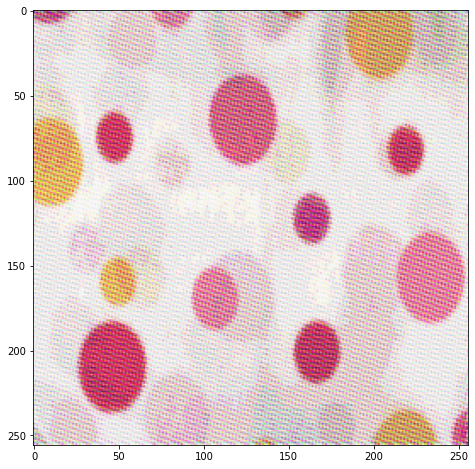

In [ ]:
i=4
plt.figure(figsize = (8,8))
plt.imshow(img2[1])

print(img2[0].shape)
print(np.max(img1[i]))
print(np.min(img1[i]))

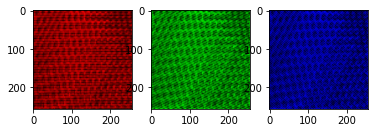

In [ ]:
h = img2[0].shape[0]
w = img2[0].shape[1]

dim = np.zeros((h,w))
a = img2[0][:,:,0]
b = img2[0][:,:,1]
c = img2[0][:,:,2]
R = np.stack((a,dim,dim), axis = 2)
G = np.stack((dim,b,dim), axis = 2)
B = np.stack((dim,dim,c), axis = 2)

plt.subplot(1,3,1)
plt.imshow(R)
plt.subplot(1,3,2)
plt.imshow(G)
plt.subplot(1,3,3)
plt.imshow(B)




In [ ]:
from skimage.color import rgb2xyz
def RGBtoXYZ(img):
  img_xyz = rgb2xyz(img)
  return img_xyz


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


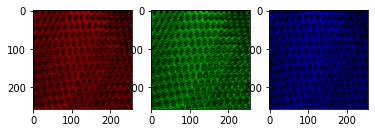

In [ ]:
img2_xyz = RGBtoXYZ(img2[0])
plt.imshow(img2_xyz)

a = img2_xyz[:,:,0]
b = img2_xyz[:,:,1]
c = img2_xyz[:,:,2]
X = np.stack((a,dim,dim), axis = 2)
Y = np.stack((dim,b,dim), axis = 2)
Z = np.stack((dim,dim,c), axis = 2)

plt.subplot(1,3,1)
plt.imshow(X)
plt.subplot(1,3,2)
plt.imshow(Y)
plt.subplot(1,3,3)
plt.imshow(Z)


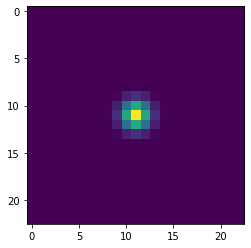

In [ ]:
from scipy import signal

def gkern(filtersize=64, std=3):
    """Returns a 2D Gaussian kernel array."""
    gkern1d = signal.gaussian(filtersize, std=std).reshape(filtersize, 1)
    gkern2d = np.outer(gkern1d, gkern1d)
    gkern2d = gkern2d/np.sum(gkern2d)
    #print(np.sum(gkern2d))
   
    return gkern2d

plt.imshow(gkern(23,1), interpolation='none')

In [ ]:
import math 
def prepareFilter(sampPerDeg,dimension=2):
  minSAMPPERDEG = 100
  #sampPerDeg = 23

  x1 = np.array([0.05,1.00327,0.225,0.114416,7.0,-0.117686])*sampPerDeg   # [halfwidth1, weight1, halfwidth2, weight2, halfwidth3, weight3]
  x2 = np.array([0.0685,0.616725,0.826,0.383275])*sampPerDeg        # [halfwidth1, weight1, halfwidth2, weight2]
  x3 = np.array([0.0920,0.567885,0.6451,0.432115])*sampPerDeg      # [halfwidth1, weight1, halfwidth2, weight2]
  g1 = 0
  g2 = 0
  g3 = 0

  for i in range(3):
    g0 = gkern(sampPerDeg,x1[i*2]/1.2)
    g1 += g0*x1[(i*2+1)]
    
    #print(np.max(g1))

  for j in range(2):
    g0 = gkern(sampPerDeg,x2[j*2]/1.2)
    g2 += g0*x2[(j*2+1)]
  
  for k in range(2):
    g0 = gkern(sampPerDeg,x3[k*2]/1.2)
    g3 += g0*x3[(k*2+1)]

  g1 = g1/np.sum(g1)  # normalized to sum = 1 
  g2 = g2/np.sum(g2)
  g3 = g3/np.sum(g3)

  uprate = math.ceil(minSAMPPERDEG/sampPerDeg)
  #print(str('uprate: ') + str(uprate))
  sampPerDeg = sampPerDeg*uprate 
  #print(str('sampPerDeg: ')+ str(sampPerDeg))

  s = sampPerDeg
  m = s/2

  support = np.array([(i-m)/sampPerDeg for i in range(s)])
  #print(str('support: ')+ str(support))

  return g1,g2,g3,support


0.17463307079647078


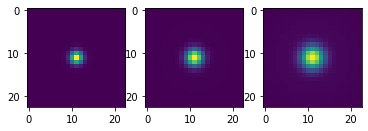

In [ ]:
g1,g2,g3,support = prepareFilter(23,2)
print(np.max(g1))

plt.subplot(1,3,1)
plt.imshow(g1, interpolation='none')
plt.subplot(1,3,2)
plt.imshow(g2, interpolation='none')
plt.subplot(1,3,3)
plt.imshow(g3, interpolation='none')


In [ ]:
import pandas as pd
df = pd.DataFrame (g3)
filepath = '/content/drive/My Drive/g3.xlsx'
df.to_excel(filepath, index=False)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.8580807239040144
[[0.70980392 0.4        0.7254902  ... 0.24313725 0.06666667 0.43529412]
 [0.32156863 0.01960784 0.36862745 ... 0.0745098  0.01176471 0.15686275]
 [0.31764706 0.03137255 0.38039216 ... 0.08235294 0.01568627 0.16078431]
 ...
 [0.71764706 0.43529412 0.73333333 ... 0.38039216 0.2        0.54901961]
 [0.44705882 0.04705882 0.45098039 ... 0.15686275 0.01960784 0.30980392]
 [0.57647059 0.09803922 0.58823529 ... 0.18431373 0.03529412 0.36078431]]
[[0.99607843 0.96862745 0.99215686 ... 0.06666667 0.73333333 0.6745098 ]
 [0.71764706 0.8745098  0.96862745 ... 0.2627451  0.75686275 0.27843137]
 [0.11372549 0.50588235 0.9372549  ... 0.74509804 0.89803922 0.51764706]
 ...
 [0.96862745 0.60784314 0.12941176 ... 0.16862745 0.02745098 0.30588235]
 [0.98823529 0.89803922 0.69803922 ... 0.16078431 0.03921569 0.35686275]
 [0.97254902 0.74901961 0.79607843 ... 0.54901961 0.2627451  0.69803922]]
[[0.72941176 0.94901961 0.97254902 ... 0.74901961 0.52156863 0.01960784]
 [0.11764706 0.73333

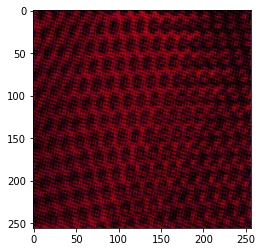

In [ ]:
def xyztopp(img):
  M = np.array([[0.2787,-0.4487,0.085951],[0.7218,0.289806,-0.58999],[-0.10655,0.077157,0.501109]])
  #print('xyz to opp matrix: ' + str(M))
  #print(img.shape)
  h = img.shape[0]
  w = img.shape[1]
  img = np.reshape(img,(h*w,3))
  #print(img.shape)
  #img = img.T
  #print(img.shape)
  img_trans = np.matmul(img, M)
  #print(img_trans.shape)
  #img_trans = img_trans.T
  #print(img_trans.shape)
  img_trans = np.reshape(img_trans,((h,w,3)))
  #print(img_trans.shape)
  #print(img_trans[:,:,0])
  #print(img_trans[:,:,1])
  #print(img_trans[:,:,2])

  return img_trans

img2_opp= xyztopp(img2_xyz)
plt.imshow(img2_opp)
print(np.max(img2_opp))
print(img2[0][:,:,0])
print(img2[0][:,:,1])
print(img2[0][:,:,2])




0.8580807239040144
0.0008603583938651626
0.0663985466808574
-0.11811254144619994
0.43476134108773357
-0.38810729993644194
(128, 128, 3)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``skimage.transform.resize`` instead.


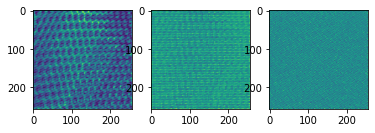

In [ ]:
a = img2_opp[:,:,0]
print(np.max(a))
print(np.min(a))
b = img2_opp[:,:,1]
print(np.max(b))
print(np.min(b))
c = img2_opp[:,:,2]
print(np.max(c))
print(np.min(c))
X = np.stack((a,dim,dim), axis = 2)
Y = np.stack((dim,b,dim), axis = 2)
Z = np.stack((dim,dim,c), axis = 2)

plt.subplot(1,3,1)
plt.imshow(a)

plt.subplot(1,3,2)
plt.imshow(b,)

plt.subplot(1,3,3)
plt.imshow(c)

testimg = scipy.misc.imresize(img2_opp, (128,128))
print(testimg.shape)



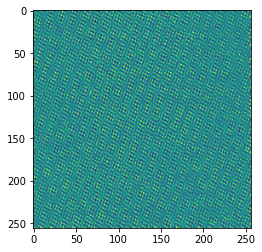

In [ ]:
plt.imshow(c)

In [ ]:
def pad_with(vector, pad_width, iaxis, kwargs):
  pad_value = kwargs.get('padder', 0)
  vector[:pad_width[0]] = pad_value
  vector[-pad_width[1]:] = pad_value

def padFilter(f,filtersize):
  p = (filtersize-len(f))//2
  fp = np.pad(f, p, pad_with)
 
  return fp


In [ ]:
G1 = padFilter(g1,511)
print(G1.shape)
import pandas as pd
df = pd.DataFrame (G1)
filepath = '/content/drive/My Drive/G1.xlsx'
df.to_excel(filepath, index=False)



(511, 511)


In [ ]:
def adjustImg(img):
  if len(img)%2 == 0:
    return img[:len(img)-1,:len(img)-1]

test = adjustImg(testimg[:,:,0])
print(test.shape)

(127, 127)


In [ ]:
def ApplyFilter(img,filter):   
  filteredimage= np.zeros((255,255,3))
  for i in range(3):
    image = img[:,:,i]
    image = adjustImg(image)   # 128,128 --> 127,127
    #print(image.shape)
    f = filter[i]
    f = padFilter(f,image.shape[0])
    #print(filter.shape)
    temp = np.fft.ifftshift(np.real(np.fft.ifft2(np.fft.fft2(np.fft.fftshift(image))*np.fft.fft2(np.fft.fftshift(f)))))
    
    #print(i)

    filteredimage[:,:,i] = temp

  return filteredimage






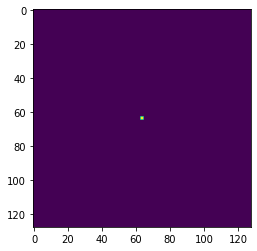

In [ ]:
f = gkern(128,0.06)
plt.imshow(f)


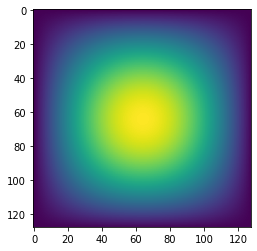

In [ ]:
plt.imshow(abs(np.fft.ifftshift(np.fft.fft2(np.fft.fftshift(f)))))


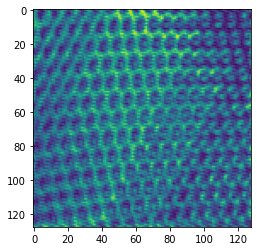

In [ ]:
plt.imshow(testimg[:,:,0])

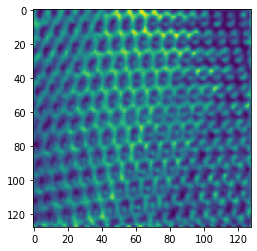

In [ ]:
plt.imshow(np.fft.ifftshift(np.real(np.fft.ifft2(np.fft.fft2(np.fft.fftshift(testimg[:,:,0]))*np.fft.fft2(np.fft.fftshift(f))))))

(23, 23)
(3, 23, 23)
(128, 128, 3)
(255, 255, 3)


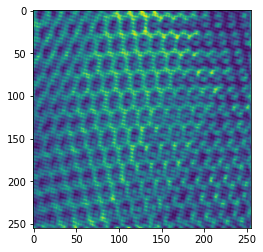

In [ ]:
F = np.array([g1,g2,g3])

print(g1.shape)
print(F.shape)

print(testimg.shape)
f = ApplyFilter(img2_opp,F)
print(f.shape)
plt.imshow(f[:,:,0])


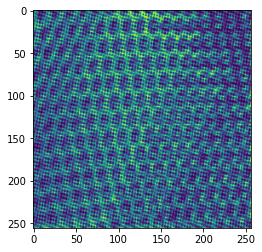

In [ ]:
plt.imshow(img2_opp[:,:,0])

In [ ]:
def opptoxyz(img):
  M = np.array([[0.9796,1.189,1.2318],[-1.5347,0.7644,1.1632],[0.4446,0.1351,2.0784]])
  #print('opp to xyz matrix: ' + str(M))
  #print(img.shape)
  h = img.shape[0]
  w = img.shape[1]
  img = np.reshape(img,(h*w,3))
  #print(img.shape)
  #img = img.T
  #print(img.shape)
  img_trans = np.matmul(img, M)
  #print(img_trans.shape)
  #img_trans = img_trans.T
  #print(img_trans.shape)
  img_trans = np.reshape(img_trans,((h,w,3)))
  #print(img_trans.shape)
  #print(img_trans[:,:,0])
  #print(img_trans[:,:,1])
  #print(img_trans[:,:,2])

  return img_trans



(255, 255, 3)


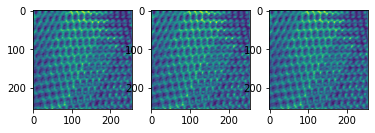

In [ ]:
f_xyz= opptoxyz(f)
print(f_xyz.shape)
plt.imshow(f_xyz[:,:,2])
h = f_xyz.shape[0]
w = f_xyz.shape[1]
dim = np.zeros((h,w))
a = f_xyz[:,:,0]/np.max(f_xyz[:,:,0])               # normalized to 1 
b = f_xyz[:,:,1]/np.max(f_xyz[:,:,1])
c = f_xyz[:,:,2]/np.max(f_xyz[:,:,2])

plt.subplot(1,3,1)
plt.imshow(a)
plt.subplot(1,3,2)
plt.imshow(b)
plt.subplot(1,3,3)
plt.imshow(c)

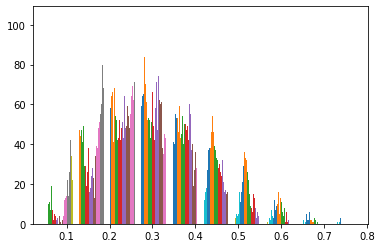

In [ ]:
#plt.imshow(f_xyz[:,:,0])
plt.hist(f_xyz[:,:,0])
plt.show()


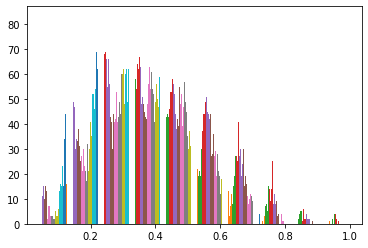

In [ ]:
plt.hist(b)
plt.show()


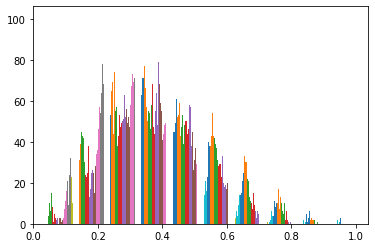

In [ ]:
plt.hist(c)
plt.show()


In [ ]:
f_xyz1 = f_xyz
f_xyz2 = np.add(f_xyz,25)    # add 25 to each pixel 

In [ ]:
c = {}
whitepoint = [95.0131,100.6252,136.0030]   #white point of display ?
c['wp'] = whitepoint
c['function'] = 'xyztolab'
c['colorSpaceIn'] = 'xyz'
c['colorSpaceOut'] = 'lab'
c['encoding'] = 'double'

print(c)
print(type(c))

{'wp': [95.0131, 100.6252, 136.003], 'function': 'xyztolab', 'colorSpaceIn': 'xyz', 'colorSpaceOut': 'lab', 'encoding': 'double'}
<class 'dict'>


In [ ]:
import skimage.color
def xyztoLAB(c,xyz):           #xyz (w,h,3) to lab
  #num_rows = xyz.shape[0]
  #input_color_dim = xyz.shape[2]
  #num_input_color_channels = xyz.shape[2]
  #print(num_rows,input_color_dim,num_input_color_channels)
  #columndata = np.reshape(xyz,(xyz.shape[0]*xyz.shape[1],xyz.shape[2]))   #columndata: (w*h,3)
  #print(columndata.shape)
  out = skimage.color.xyz2lab(xyz,illuminant='D65')
  #print(out)
  #out = np.reshape(out,(xyz.shape[0],xyz.shape[1],xyz.shape[2]))
  #print(out.shape)

  return out

lab = xyztoLAB(c,f_xyz1)
round = skimage.color.lab2xyz(lab)
  

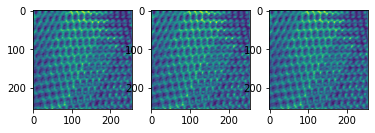

In [ ]:
plt.subplot(1,3,1)
plt.imshow(f_xyz1[:,:,0])

plt.subplot(1,3,2)
plt.imshow(f_xyz1[:,:,1])

plt.subplot(1,3,3)
plt.imshow(f_xyz1[:,:,2])


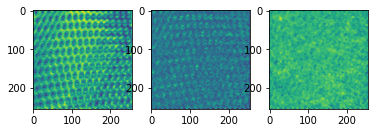

In [ ]:
plt.subplot(1,3,1)
plt.imshow(lab[:,:,0])

plt.subplot(1,3,2)
plt.imshow(lab[:,:,1])

plt.subplot(1,3,3)
plt.imshow(lab[:,:,2])

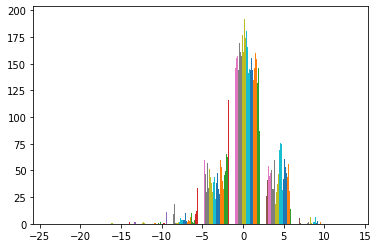

In [ ]:
plt.hist(lab[:,:,2])
plt.show()

In [ ]:
lab1 = xyztoLAB(c,f_xyz1)
lab2 = xyztoLAB(c,f_xyz2)
print(lab1.shape)

(255, 255, 3)


In [ ]:
def deltaE(lab1,lab2):
  a,ra,ca,wa = np.reshape(lab1,(lab1.shape[0]*lab1.shape[1],lab1.shape[2])),lab1.shape[0],lab1.shape[1],lab1.shape[2]
  b,rb,cb,wb = np.reshape(lab2,(lab2.shape[0]*lab2.shape[1],lab2.shape[2])),lab2.shape[0],lab2.shape[1],lab2.shape[2]
  #print(ra,ca,wa)
  #print(rb,cb,wb)

  Lstd = a[:,0]
  astd = a[:,1]
  bstd = a[:,2]
  Cabstd = np.sqrt(np.power(astd,2)+np.power(bstd,2))

  Lsample = b[:,0]
  asample = b[:,1]
  bsample = b[:,2]
  Cabsample = np.sqrt(np.power(asample,2)+np.power(bsample,2))

  Cabarithmean = (Cabstd+Cabsample)/2

  G = 0.5*(1-np.sqrt(np.power(Cabarithmean,7)/(np.add(np.power(Cabarithmean,7),25^7))))

  apstd = (1+G)*astd
  apsample = (1+G)*asample 
  Cpsample = np.sqrt(np.power(apsample,2)+np.power(bsample,2))
  Cpstd = np.sqrt(np.power(apstd,2)+np.power(bstd,2))

  Cpprod = Cpsample*Cpstd
  zcidx = np.where(Cpprod==0)

  #print(Cpprod.shape)
  #print(zcidx)
  

  hpstd = np.arctan2(bstd,apstd)
  hpstd = hpstd+2*np.pi*(hpstd<0)
  hpstd[np.where((abs(apstd)+abs(bstd))==0)] = 0
  hpsample = np.arctan2(bsample,apsample)
  hpsample = hpsample+2*np.pi*(hpsample<0)
  hpsample[np.where((abs(apsample)+abs(bsample))==0)] = 0

  dL = Lsample-Lstd
  dC = Cpsample-Cpstd

  dhp = (hpsample-hpstd)
  dhp = dhp-2*np.pi*(dhp>np.pi)
  dhp = dhp+2*np.pi*(dhp<(-np.pi))

  dhp[zcidx] = 0

  dH = 2*np.sqrt(Cpprod)*np.sin(dhp/2)

  Lp = (Lsample+Lstd)/2 
  Cp = (Cpstd+Cpsample)/2

  hp = (hpstd+hpsample)/2

  hp = hp-(abs(hpstd-hpsample)>np.pi)*np.pi

  hp = hp+(hp<0)*2*np.pi

  hp[zcidx] = hpsample[zcidx]+hpstd[zcidx]

  Lpm502 = np.power((Lp-50),2)
  Sl = 1+ 0.015*Lpm502/np.sqrt(np.add(20,Lpm502))
  Sc = 1+0.045*Cp
  T = 1-0.17*np.cos(hp-np.pi/6)+0.24*np.cos(2*hp)+0.32*np.cos(3*hp+np.pi/30)-0.2*np.cos(4*hp-63*np.pi/180)
  Sh = 1+0.015*Cp*T
  delthetarad = (30*np.pi/180)*np.exp(-(np.power((180/np.pi*hp-275)/25,2)))
  Rc = 2*np.sqrt(np.power(Cp,7))/(np.add(np.power(Cp,7),25**7))
  RT = -np.sin(2*delthetarad)*Rc

  kl,kc,kh=1,1,1

  klSl = kl*Sl
  kcSc = kc*Sc
  khSh = kh*Sh

  de00 = np.sqrt(np.power(dL/klSl,2)+np.power(dC/kcSc,2)+np.power(dH/khSh,2)+ RT*(dC/kcSc)*(dH/khSh))

  dEab = np.reshape(de00,(ra,ca))

  return dEab



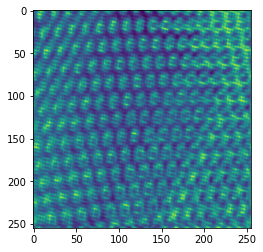

In [ ]:
deltaE_ = deltaE(lab1,lab2)
plt.imshow(deltaE_)

In [ ]:
img1, img2 = dataloader.load_data(10)     # (10, 128, 128, 3)
g1,g2,g3,support = prepareFilter(23,2)
F = np.array([g1,g2,g3])


Degraded HR path: /content/drive/My Drive/CS236_train/lacelike_0041.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/lacelike_0041_halftoned.jpg


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: DeprecationWarning:     `imread` is deprecated!
    `imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``imageio.imread`` instead.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``skimage.transform.resize`` instead.


Degraded HR path: /content/drive/My Drive/CS236_train/crosshatched_0044.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/crosshatched_0044_halftoned.jpg
Degraded HR path: /content/drive/My Drive/CS236_train/gauzy_0192.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/gauzy_0192_halftoned.jpg
Degraded HR path: /content/drive/My Drive/CS236_train/gauzy_0163.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/gauzy_0163_halftoned.jpg
Degraded HR path: /content/drive/My Drive/CS236_train/grooved_0058.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/grooved_0058_halftoned.jpg
Degraded HR path: /content/drive/My Drive/CS236_train/lacelike_0071.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/lacelike_0071_halftoned.jpg
Degraded HR path: /content/drive/My Drive/CS236_train/spiralled_0081.jpg
Original HR path: /content/drive/My Drive/original good im

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


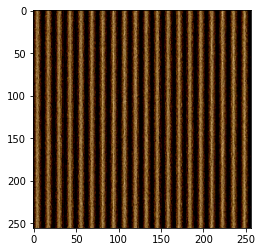

In [ ]:
plt.imshow(img1[4])

### implementation

In [ ]:
def cal_deltaE(feature1,feature2):
  delE_out = []
  for i in range(feature1.shape[0]):
    out = deltaE(feature1[i,:,:,:],feature2[i,:,:,:])
    #out = feature1[i,:,:,:]-feature2[i,:,:,:]
    delE_out.append(np.sum(out))

  delE_out = np.array(delE_out)

  return delE_out


In [ ]:
def S_CIELAB(imgs):
  img_out = []
  for i in range(imgs.shape[0]):
    img_xyz = RGBtoXYZ(imgs[i,:,:,:])
    img_opp= xyztopp(img_xyz)
    f = ApplyFilter(img_opp,F)
    f_xyz= opptoxyz(f)
    lab = xyztoLAB(c,f_xyz)
    img_out.append(lab)
  
  img_out = np.array(img_out) 
    
  return img_out

In [ ]:
def tf_S_CIELAB(input):
  #input = tf.placeholder(tf.float32)
  y = tf.numpy_function(S_CIELAB, [input], [tf.float64])
  #y2 = tf.reshape(tf.concat(1, y), [<>])
  
  return y

tf_S_CIELAB(tf.ones([10,256,256,3]))

<tf.Tensor: shape=(10, 255, 255, 3), dtype=float64, numpy=
array([[[[ 1.00001165e+02, -3.19552349e-02,  6.58656898e-03],
         [ 1.00001165e+02, -3.19552349e-02,  6.58656898e-03],
         [ 1.00001165e+02, -3.19552349e-02,  6.58656898e-03],
         ...,
         [ 1.00001165e+02, -3.19552349e-02,  6.58656898e-03],
         [ 1.00001165e+02, -3.19552349e-02,  6.58656898e-03],
         [ 1.00001165e+02, -3.19552349e-02,  6.58656898e-03]],

        [[ 1.00001165e+02, -3.19552349e-02,  6.58656898e-03],
         [ 1.00001165e+02, -3.19552349e-02,  6.58656898e-03],
         [ 1.00001165e+02, -3.19552349e-02,  6.58656898e-03],
         ...,
         [ 1.00001165e+02, -3.19552349e-02,  6.58656898e-03],
         [ 1.00001165e+02, -3.19552349e-02,  6.58656898e-03],
         [ 1.00001165e+02, -3.19552349e-02,  6.58656898e-03]],

        [[ 1.00001165e+02, -3.19552349e-02,  6.58656898e-03],
         [ 1.00001165e+02, -3.19552349e-02,  6.58656898e-03],
         [ 1.00001165e+02, -3.19552349e-0

In [ ]:
def build_SCIELAB():
  img_hr = Input(shape=(256,256,3))
  out = tf_S_CIELAB(img_hr)

  return Model(img_hr,out)

Degraded HR path: /content/drive/My Drive/CS236_train/lined_0024.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/lined_0024_halftoned.jpg


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: DeprecationWarning:     `imread` is deprecated!
    `imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``imageio.imread`` instead.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``skimage.transform.resize`` instead.


tf.Tensor([  1 255 255   3], shape=(4,), dtype=int32)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``skimage.transform.resize`` instead.


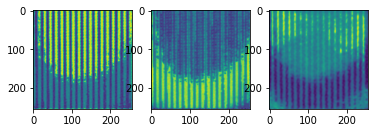

In [ ]:
sCIELAB = build_SCIELAB()
data_loader = DataLoader(dataset_name='img_align_celeba',img_res=(256,256))
imgs_hr, imgs_lr = data_loader.load_data(1)
#plt.imshow(imgs_hr[0,:,:,:])
#print(imgs_hr)
image_features = sCIELAB(imgs_lr)
print(tf.shape(image_features))

test = image_features[0,:,:,:]
plt.subplot(1,3,1)
plt.imshow(test[:,:,0])

plt.subplot(1,3,2)
plt.imshow(test[:,:,1])

plt.subplot(1,3,3)
plt.imshow(test[:,:,2])


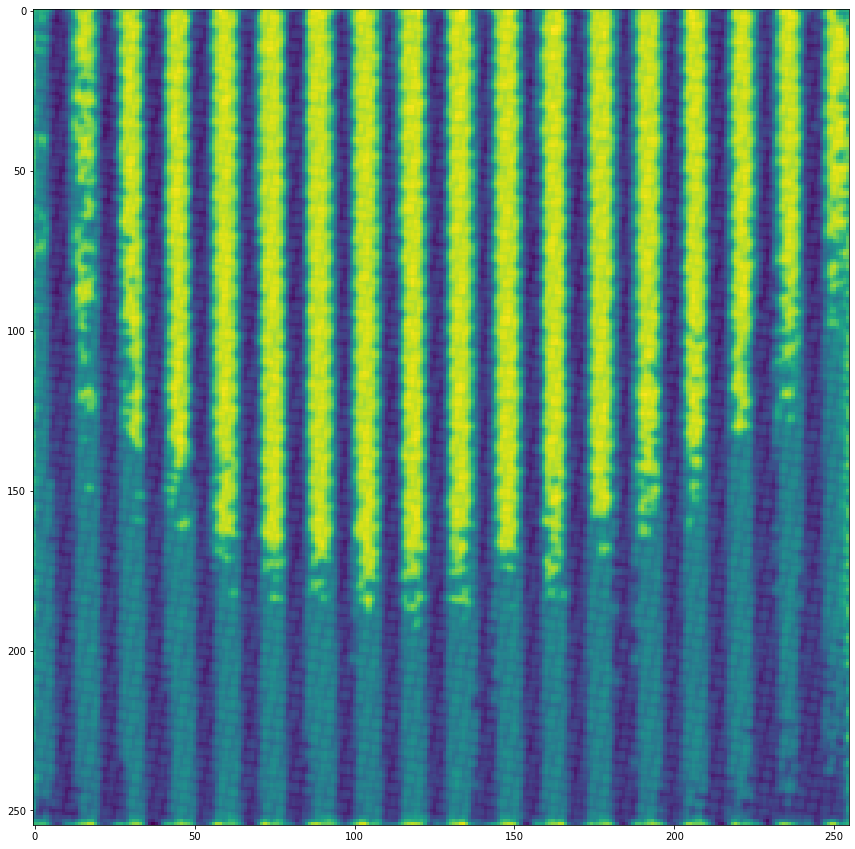

In [ ]:
test = image_features[0,:,:,:]
plt.figure(figsize = (15,15))
plt.imshow(test[:,:,0])

(255, 255, 3)
(3, 255, 255)


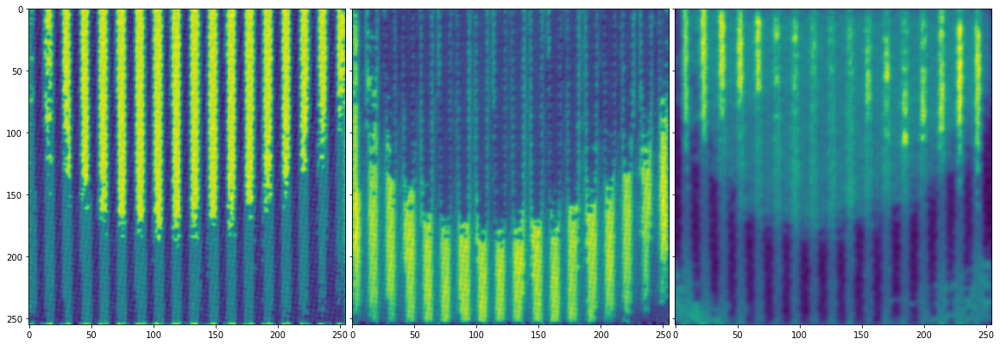

In [ ]:
print(test.shape)
samples = np.moveaxis(test, -1, 0)
print(samples.shape)
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np

fig = plt.figure(figsize=(20, 20))
grid = ImageGrid(fig, 111, 
                 nrows_ncols=(1, 3),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes
                 )

for ax, im in zip(grid, samples):
    ax.imshow(im)

plt.show()

In [ ]:
def tf_deltaE(input1,input2):
  y = tf.numpy_function(cal_deltaE, [input1,input2], [tf.float64])
  
  return y

tf_deltaE(tf.ones([10,127,127,3]),tf.zeros([10,127,127,3]))

<tf.Tensor: shape=(10,), dtype=float64, numpy=
array([29123.86020407, 29123.86020407, 29123.86020407, 29123.86020407,
       29123.86020407, 29123.86020407, 29123.86020407, 29123.86020407,
       29123.86020407, 29123.86020407])>

In [ ]:
imgs_hr, imgs_lr = data_loader.load_data(1)
print(imgs_hr.shape)
print(imgs_lr.shape)

Degraded HR path: /content/drive/My Drive/CS236_train/fibrous_0158.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/fibrous_0158_halftoned.jpg


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: DeprecationWarning:     `imread` is deprecated!
    `imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``imageio.imread`` instead.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``skimage.transform.resize`` instead.


(1, 256, 256, 3)
(1, 256, 256, 3)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``skimage.transform.resize`` instead.


In [ ]:
delta = tf_deltaE(imgs_hr,imgs_lr)
print(delta)

tf.Tensor([52828.80225741], shape=(1,), dtype=float64)


### vgg

In [ ]:
 def build_vgg():
        """
        Builds a pre-trained VGG19 model that outputs image features extracted at the
        third block of the model
        """
        vgg = VGG19(weights="imagenet",include_top=False,input_shape=(256,256,3))
        # Set outputs to outputs of last conv. layer in block 3
        # See architecture at: https://github.com/keras-team/keras/blob/master/keras/applications/vgg19.py
        #vgg.outputs = [vgg.layers[9].output]   #v1.15

        #img = Input(shape=self.hr_shape)     #v1.15
 
        # Extract image features         #v1.15
        #img_features = vgg(img)         # v1.15

        #https://codeleading.com/article/70796051059/   #TF v2.0 above

        print(vgg.layers[9].name)

        return Model(vgg.input, outputs=vgg.layers[9].output)

In [ ]:
vgg = build_vgg()
vgg.trainable = False
vgg.compile(loss='mse',optimizer=Adam(0.0002, 0.5),metrics=['accuracy'])

80150528/80134624 [==============================] - 1s 0us/step
block3_conv3


In [ ]:
dataloader = DataLoader(dataset_name='CS236_train', img_res=(256, 256))
img1, img2 = dataloader.load_data(5)     # (10, 128, 128, 3)
#vgg_ = vgg.predict(img1)
print(img1.shape)

Degraded HR path: /content/drive/My Drive/CS236_train/potholed_0130.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/potholed_0130_halftoned.jpg


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: DeprecationWarning:     `imread` is deprecated!
    `imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``imageio.imread`` instead.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``skimage.transform.resize`` instead.


Degraded HR path: /content/drive/My Drive/CS236_train/matted_0030.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/matted_0030_halftoned.jpg
Degraded HR path: /content/drive/My Drive/CS236_train/pitted_0026.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/pitted_0026_halftoned.jpg
Degraded HR path: /content/drive/My Drive/CS236_train/lacelike_0022.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/lacelike_0022_halftoned.jpg
Degraded HR path: /content/drive/My Drive/CS236_train/studded_0137.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/studded_0137_halftoned.jpg
(5, 256, 256, 3)


In [ ]:

vgg = VGG19(weights="imagenet",include_top=False,input_shape=(256,256,3))
vgg.summary()
feature_extractor = keras.Model(inputs=vgg.inputs,outputs=vgg.get_layer(name="block3_conv3").output)


Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


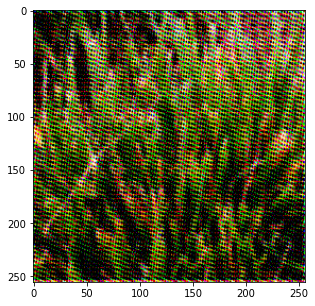

In [ ]:
test1 = img2[1,:,:,:]
fig = plt.figure(figsize=(5, 5))
plt.imshow(test1)

In [ ]:
features_1 = feature_extractor.predict(img1)
features_2 = feature_extractor.predict(img2)
print(features_1.shape)             #(1,64,64,256)
plt.figure(figsize = (15,15))
#plt.imshow(features_1[0,:,:,4])

(5, 64, 64, 256)


<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

In [ ]:
import torch
samples = features_1[1,:,:,:].reshape(64,64,256)
print(samples.shape)
samples = np.moveaxis(samples, -1, 0)
print(samples.shape)
samples = torch.tensor(samples)



(64, 64, 256)
(256, 64, 64)


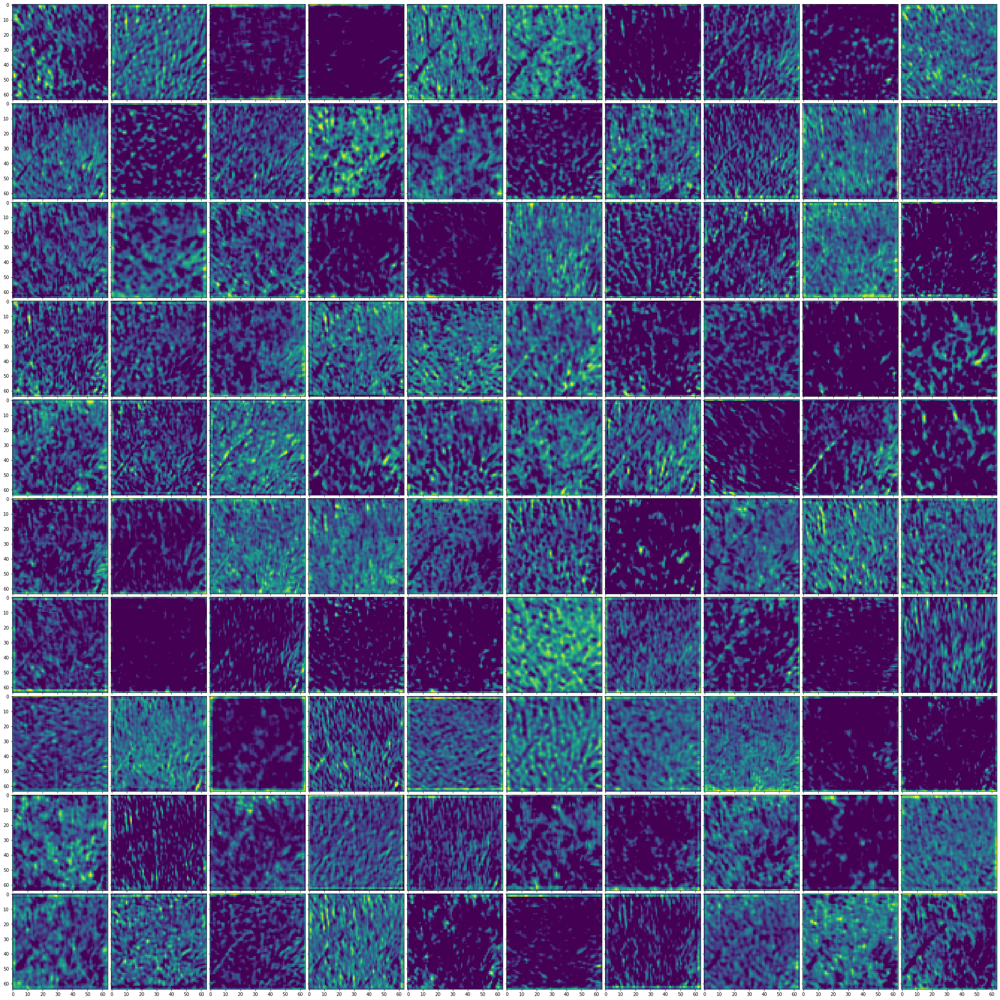

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np

fig = plt.figure(figsize=(40., 40.))
grid = ImageGrid(fig, 111, 
                 nrows_ncols=(10, 10),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes
                 )

for ax, im in zip(grid, samples):
    ax.imshow(im)

plt.show()


### MSE vs S-CIELAB delta E

In [ ]:
dataloader = DataLoader(dataset_name='CS236_train', img_res=(256, 256))
img1, img2 = dataloader.load_data(10)     # (10, 128, 128, 3)
img1_ = 0.5 * img1 + 0.5
img2_ = 0.5 * img2 + 0.5

Degraded HR path: /content/drive/My Drive/CS236_train/polka-dotted_0162.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/polka-dotted_0162_halftoned.jpg


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: DeprecationWarning:     `imread` is deprecated!
    `imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``imageio.imread`` instead.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``skimage.transform.resize`` instead.


Degraded HR path: /content/drive/My Drive/CS236_train/paisley_0074.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/paisley_0074_halftoned.jpg
Degraded HR path: /content/drive/My Drive/CS236_train/smeared_0043.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/smeared_0043_halftoned.jpg
Degraded HR path: /content/drive/My Drive/CS236_train/sprinkled_0113.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/sprinkled_0113_halftoned.jpg
Degraded HR path: /content/drive/My Drive/CS236_train/meshed_0071.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/meshed_0071_halftoned.jpg
Degraded HR path: /content/drive/My Drive/CS236_train/bubbly_0056.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/bubbly_0056_halftoned.jpg
Degraded HR path: /content/drive/My Drive/CS236_train/scaly_0136.jpg
Original HR path: /content/drive/My Drive/original good images/CS2

In [ ]:
print(img1.shape)

(10, 256, 256, 3)


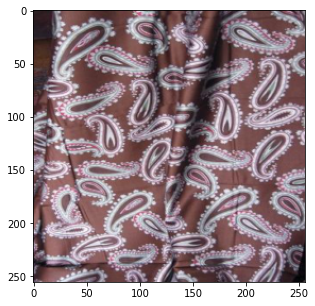

In [ ]:
test1 = img1_[1,:,:,:]
fig = plt.figure(figsize=(5, 5))
plt.imshow(test1)

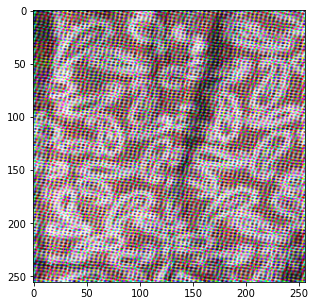

In [ ]:
test2 = img2_[1,:,:,:]
fig = plt.figure(figsize=(5, 5))
plt.imshow(test2)

Degraded HR path: /content/drive/My Drive/CS236_train/cobwebbed_0089.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/cobwebbed_0089_halftoned.jpg


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: DeprecationWarning:     `imread` is deprecated!
    `imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``imageio.imread`` instead.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``skimage.transform.resize`` instead.


Degraded HR path: /content/drive/My Drive/CS236_train/freckled_0089.jpg
Original HR path: /content/drive/My Drive/original good images/CS236_train/freckled_0089_halftoned.jpg
(2, 256, 256, 3)
(2, 256, 256, 3)
(255, 255)
1002568.5104507178
S-CIELAB deltaE mean: 52828.802257409276
S-CIELAB deltaE std:0.0


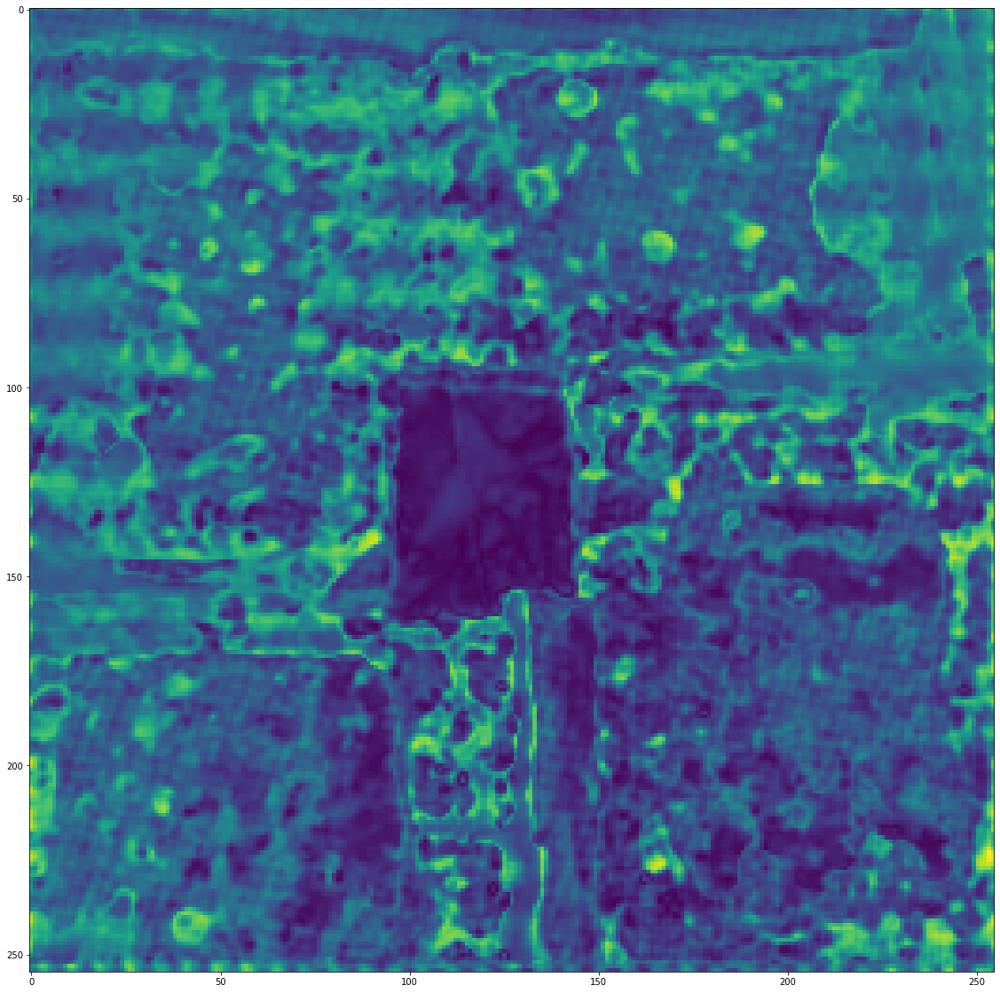

In [ ]:
#dataloader = DataLoader(dataset_name='img_align_celeba', img_res=(256, 256))
img1, img2 = dataloader.load_data(2)     # (10, 128, 128, 3)

#img1 = np.load('/content/drive/My Drive/CS236_model_result/BCE_vgg_S-CIELAB__1e-3_1_1/lr_0.00005__clp_0.5/3500 epoch/origin_/imgs_hr_.npy')
#img2 = np.load('/content/drive/My Drive/CS236_model_result/BCE_vgg_S-CIELAB__1e-3_1_1/lr_0.00005__clp_0.5/3500 epoch/random_/fake_hr_.npy')

print(img1.shape)
print(img2.shape)

out1 = S_CIELAB(img1)
out2 = S_CIELAB(img2)

test1 = out1[1,:,:,:]
test2 = out2[1,:,:,:]
deltaE_ = deltaE(test1,test2)
fig = plt.figure(figsize=(20, 20))
plt.imshow(deltaE_)
print(deltaE_.shape)
print(deltaE_.sum())       #--------------- (1)
#plt.close()
#delta = tf_deltaE(out1,out2)   # should be the same as (1)
#print(delta)
#_ = plt.hist(delta.numpy(), bins='auto')
#plt.show()
print('S-CIELAB deltaE mean: '+ str(delta.numpy().mean()))
print('S-CIELAB deltaE std:'+ str(delta.numpy().std()))


In [ ]:
#img1 = np.load('/content/drive/My Drive/CS236_model_result/BCE_vgg_S-CIELAB__1e-3_1_1/lr_0.00005__clp_0.5/3500 epoch/origin_/imgs_hr_.npy')
#img2 = np.load('/content/drive/My Drive/CS236_model_result/BCE_vgg_S-CIELAB__1e-3_1_1/lr_0.00005__clp_0.5/3500 epoch/random_/fake_hr_.npy')

print(img1.shape)
print(img2.shape)

feature_extractor = keras.Model(inputs=vgg.inputs,outputs=vgg.get_layer(name="block3_conv3").output)

features_1 = feature_extractor.predict(img1)
features_2 = feature_extractor.predict(img2)
print(features_1.shape)             #(1,64,64,256)


(2, 256, 256, 3)
(2, 256, 256, 3)
(2, 64, 64, 256)


(2, 64, 64)
[91.77318  31.890598]
91.77317810058594
91.77316284179688
Vgg MSE mean: 61.831886291503906
Vgg MSE std:29.9412899017334


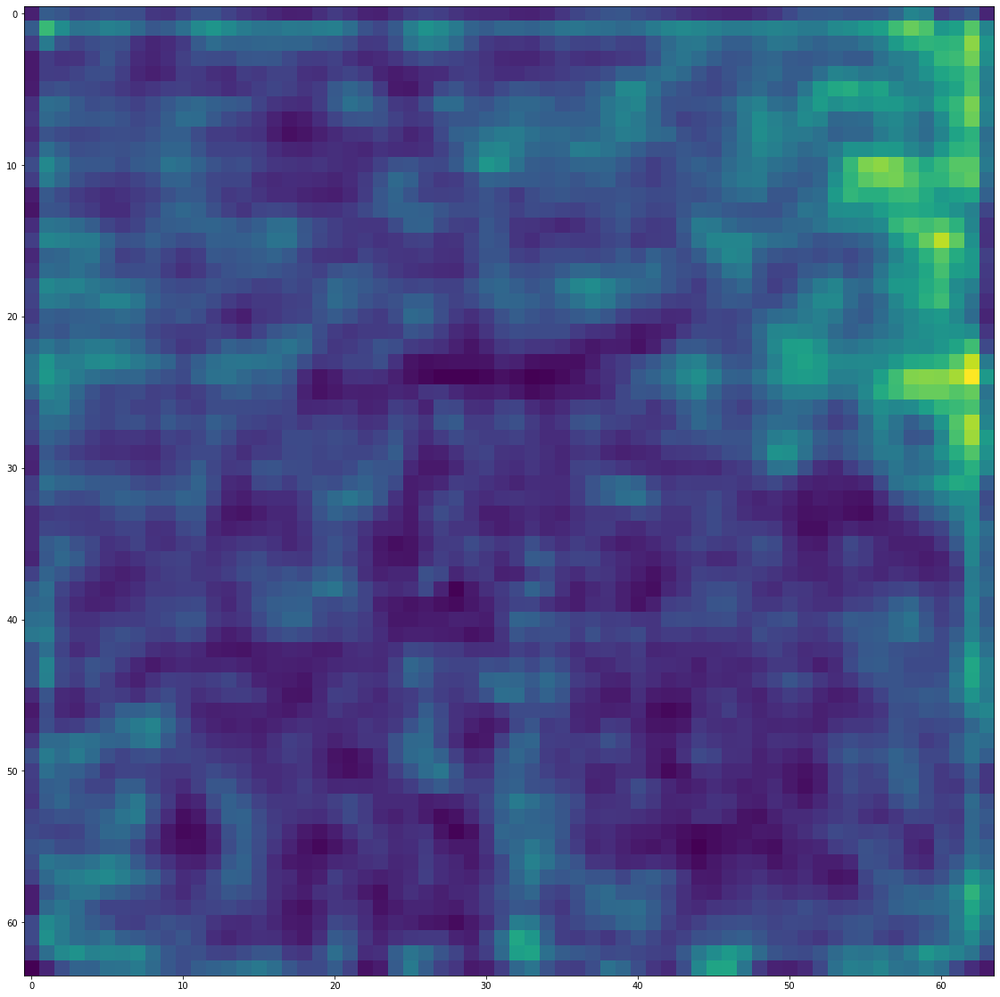

In [ ]:
loss = tf.keras.losses.mean_squared_error(features_1, features_2)    #tf.keras.metrics.mean_squared_error(y_true, y_pred)
loss2 = np.square(features_1 - features_2)
print(loss.shape)
fig = plt.figure(figsize=(20, 20))

plt.imshow(loss[1,:,:])
#plt.close

print(loss.numpy().sum(axis = 1).sum(axis = -1)/(features_1.shape[1]*features_1.shape[2]))
print(loss[0,:,:].numpy().sum()/(features_1.shape[1]*features_1.shape[2]))
print(loss2[0,:,:].sum()/(features_1.shape[1]*features_1.shape[2]*features_1.shape[3]))

#_ = plt.hist(loss.numpy().sum(axis = 1).sum(axis = -1)/(features_1.shape[1]*features_1.shape[2]), bins='auto')
#plt.show()

print('Vgg MSE mean: '+ str(loss.numpy().sum(axis = 1).sum(axis = -1).mean()/(features_1.shape[1]*features_1.shape[2])))
print('Vgg MSE std:'+ str(loss.numpy().sum(axis = 1).sum(axis = -1).std()/(features_1.shape[1]*features_1.shape[2])))

(2, 256, 256, 3)
(2, 255, 255, 3)
(2, 255, 255)
[39604868.01431248 37261783.41260912]
39604868.014312476


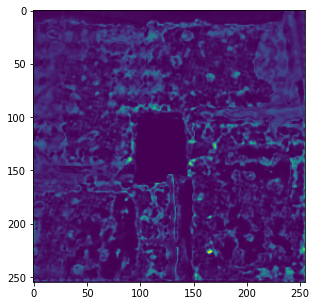

In [ ]:
#img --> S-CIELAB --> vgg == feature 


#img1, img2 = dataloader.load_data(1)     # (10, 128, 128, 3)
out1 = S_CIELAB(img1)
out2 = S_CIELAB(img2)
print(img1.shape)
print(out1.shape)

loss = tf.keras.losses.mean_squared_error(out1, out2)   #tf.keras.metrics.mean_squared_error(y_true, y_pred)
print(loss.shape)
fig = plt.figure(figsize=(5, 5))
plt.imshow(loss[1,:,:])

print(loss.numpy().sum(axis = 1).sum(axis = -1))
print(loss[0,:,:].numpy().sum())


(2, 63, 63, 256)
(63, 63, 256)
(256, 63, 63)


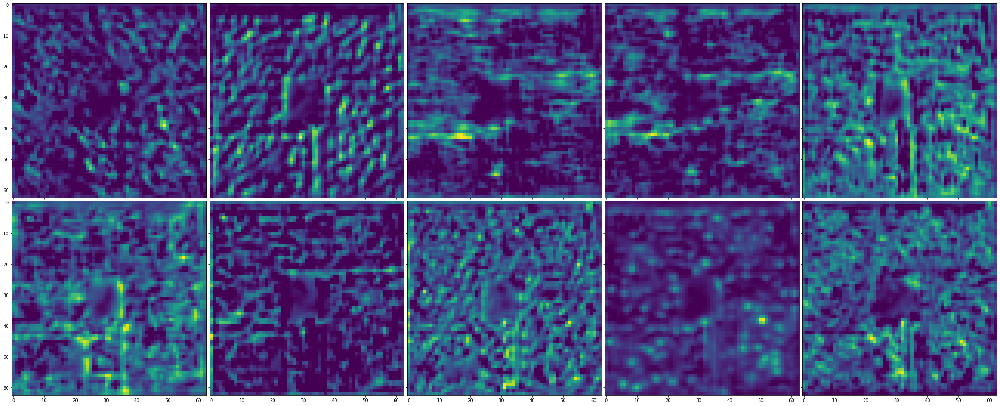

In [ ]:
vgg = VGG19(weights="imagenet",include_top=False,input_shape=(255,255,3))
feature_extractor = keras.Model(inputs=vgg.inputs,outputs=vgg.get_layer(name="block3_conv3").output)

features_1 = feature_extractor.predict(out2)
print(features_1.shape)

import torch
samples = features_1[1,:,:,:].reshape(63,63,256)
print(samples.shape)
samples = np.moveaxis(samples, -1, 0)
print(samples.shape)
samples = torch.tensor(samples)

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np

fig = plt.figure(figsize=(40., 40.))
grid = ImageGrid(fig, 111, 
                 nrows_ncols=(2, 5),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes
                 )

for ax, im in zip(grid, samples):
    ax.imshow(im)

plt.show()


(2, 256, 256, 64)
(256, 256, 64)
(64, 256, 256)


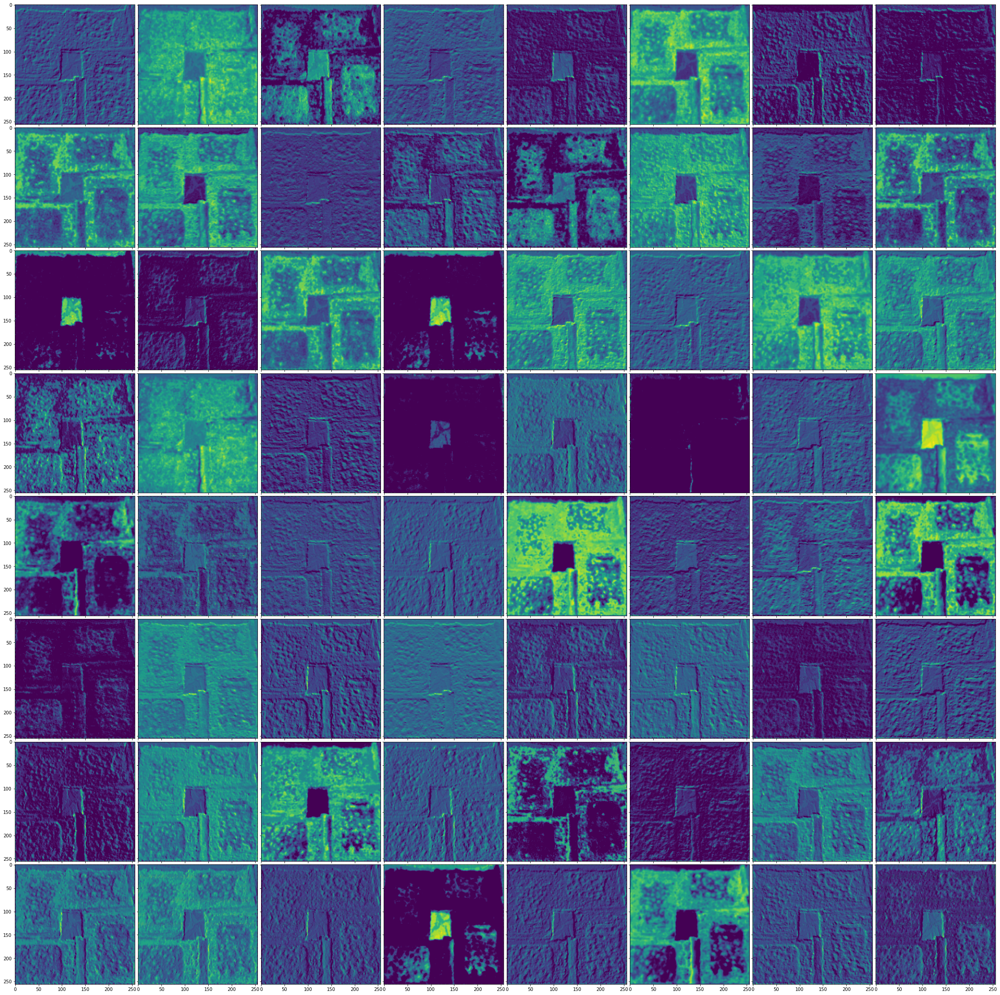

In [ ]:
vgg = VGG19(weights="imagenet",include_top=False,input_shape=(256,256,3))
feature_extractor = keras.Model(inputs=vgg.inputs,outputs=vgg.get_layer(name="block1_conv1").output)
features_1 = feature_extractor.predict(img2)
print(features_1.shape)

import torch
samples = features_1[1,:,:,:].reshape(256,256,64)
print(samples.shape)
samples = np.moveaxis(samples, -1, 0)
print(samples.shape)
samples = torch.tensor(samples)

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np

fig = plt.figure(figsize=(40., 40.))
grid = ImageGrid(fig, 111, 
                 nrows_ncols=(8, 8),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes
                 )

for ax, im in zip(grid, samples):
    ax.imshow(im)

plt.show()

## SRGAN 

In [ ]:
# fresh model 
class SRGAN():
    def __init__(self):
        # Input shape
        self.channels = 3
        self.lr_height = 256                 # Low resolution height
        self.lr_width = 256                  # Low resolution width
        self.lr_shape = (self.lr_height, self.lr_width, self.channels)
        self.hr_height = self.lr_height*1   # High resolution height
        self.hr_width = self.lr_width*1     # High resolution width
        self.hr_shape = (self.hr_height, self.hr_width, self.channels)

        # Number of residual blocks in the generator
        self.n_residual_blocks = 16

        optimizer1 = Adam(0.0002, 0.5)
        optimizer2 = Adam(0.0002, 0.5, clipvalue=0.5)

        # We use a pre-trained VGG19 model to extract image features from the high resolution
        # and the generated high resolution images and minimize the mse between them
        self.vgg = self.build_vgg()
        self.vgg.trainable = False
        self.vgg.compile(loss='mse',
            optimizer=optimizer1,
            metrics=['accuracy'])

        # Configure data loader
        self.dataset_name = 'CS236_train'
        self.data_loader = DataLoader(dataset_name=self.dataset_name,img_res=(self.hr_height, self.hr_width))

        # Calculate output shape of D (PatchGAN)
        patch = int(self.hr_height / 2**4)
        self.disc_patch = (patch, patch, 1)

        # Number of filters in the first layer of G and D
        self.gf = 64
        self.df = 64

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='mse',optimizer=optimizer1,metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        


        # High res. and low res. images                                          #combined model input
        img_hr = Input(shape=self.hr_shape) 
        img_lr = Input(shape=self.lr_shape)

        # Generate high res. version from low res.                               #path to output
        fake_hr = self.generator(img_lr) 

        # Extract image features of the generated img                            #path to output
        fake_features = self.vgg(fake_hr)
 
        # For the combined model we will only train the generator            
        self.discriminator.trainable = False

        # Discriminator determines validity of generated high res. images       #path to output
        validity = self.discriminator(fake_hr)

        self.combined = Model([img_lr, img_hr], [validity, fake_features])        # Model([input1,input2],[output1,output2])        
        self.combined.compile(loss=['binary_crossentropy', 'mse'],                # output1 vs groundtruth1  (label) : binaray_crossentropy loss
                              loss_weights=[1e-3, 1],                             # output2 vs groundtruth2  (feature) : mse loss
                              optimizer=optimizer1)
        self.combined.summary()

    

    def build_vgg(self):
        """
        Builds a pre-trained VGG19 model that outputs image features extracted at the
        third block of the model
        """
        vgg = VGG19(weights="imagenet",include_top=False,input_shape=self.hr_shape)
        # Set outputs to outputs of last conv. layer in block 3
        # See architecture at: https://github.com/keras-team/keras/blob/master/keras/applications/vgg19.py
        #vgg.outputs = [vgg.layers[9].output]   #v1.15

        #img = Input(shape=self.hr_shape)     #v1.15
 
        # Extract image features         #v1.15
        #img_features = vgg(img)         # v1.15

        #https://codeleading.com/article/70796051059/   #TF v2.0 above

        return Model(vgg.input, outputs=vgg.layers[5].output)

    def build_generator(self):

        def residual_block(layer_input, filters):
            """Residual block described in paper"""
            d = Conv2D(filters, kernel_size=3, strides=1, padding='same')(layer_input)
            d = Activation('relu')(d)
            d = BatchNormalization(momentum=0.8)(d)
            d = Conv2D(filters, kernel_size=3, strides=1, padding='same')(d)
            d = BatchNormalization(momentum=0.8)(d)
            d = Add()([d, layer_input])
            return d

        def deconv2d(layer_input):
            """Layers used during upsampling"""
            u = UpSampling2D(size=3)(layer_input)
            u = Conv2D(256, kernel_size=3, strides=1, padding='same')(u)
            u = Activation('relu')(u)
            return u

        # Low resolution image input
        img_lr = Input(shape=self.lr_shape)

        # Pre-residual block
        c1 = Conv2D(64, kernel_size=9, strides=1, padding='same')(img_lr)
        c1 = Activation('relu')(c1)

        # Propogate through residual blocks
        r = residual_block(c1, self.gf)
        for _ in range(self.n_residual_blocks - 1):
            r = residual_block(r, self.gf)

        # Post-residual block
        c2 = Conv2D(64, kernel_size=3, strides=1, padding='same')(r)
        c2 = BatchNormalization(momentum=0.8)(c2)
        c2 = Add()([c2, c1])

        # Upsampling
        #u1 = deconv2d(c2)
        #u2 = deconv2d(u1)

        # Generate high resolution output
        gen_hr = Conv2D(self.channels, kernel_size=9, strides=1, padding='same', activation='tanh')(c2)

        return Model(img_lr, gen_hr)

    def build_discriminator(self):

        def d_block(layer_input, filters, strides=1, bn=True):
            """Discriminator layer"""
            d = Conv2D(filters, kernel_size=3, strides=strides, padding='same')(layer_input)
            d = LeakyReLU(alpha=0.2)(d)
            if bn:
                d = BatchNormalization(momentum=0.8)(d)
            return d

        # Input img
        d0 = Input(shape=self.hr_shape)

        d1 = d_block(d0, self.df, bn=False)
        d2 = d_block(d1, self.df, strides=2)
        d3 = d_block(d2, self.df*2)
        d4 = d_block(d3, self.df*2, strides=2)
        d5 = d_block(d4, self.df*4)
        d6 = d_block(d5, self.df*4, strides=2)
        d7 = d_block(d6, self.df*8)
        d8 = d_block(d7, self.df*8, strides=2)

        d9 = Dense(self.df*16)(d8)
        d10 = LeakyReLU(alpha=0.2)(d9)
        validity = Dense(1, activation='sigmoid')(d10)

        return Model(d0, validity)

    def train(self, epochs, batch_size=50, sample_interval=50):

        start_time = datetime.datetime.now()
        #model =current_model

        for epoch in range(epochs):

            # ----------------------
            #  Train Discriminator
            # ----------------------

            # Sample images and their conditioning counterparts
            imgs_hr, imgs_lr = self.data_loader.load_data(batch_size)

            # From low res. image generate high res. version
            fake_hr = self.generator.predict(imgs_lr)

            valid = np.ones((batch_size,) + self.disc_patch)
            fake = np.zeros((batch_size,) + self.disc_patch)

            # Train the discriminators (original images = real / generated = Fake)
            d_loss_real = self.discriminator.train_on_batch(imgs_hr, valid)
            d_loss_fake = self.discriminator.train_on_batch(fake_hr, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ------------------
            #  Train Generator
            # ------------------

            # Sample images and their conditioning counterparts
            imgs_hr, imgs_lr = self.data_loader.load_data(batch_size)

            # The generators want the discriminators to label the generated images as real
            valid = np.ones((batch_size,) + self.disc_patch)

            # Extract ground truth image features using pre-trained VGG19 model
            image_features = self.vgg.predict(imgs_hr)

            print(tf.shape(imgs_lr))
            print(tf.shape(imgs_hr))
            print(tf.shape(valid))
            #print(image_features)
  

            # Train the geneijgty]rators
            g_loss = self.combined.train_on_batch([imgs_lr, imgs_hr], [valid, image_features])      # [Y1,Y2] = [groundtruth1,groundtruth2] = [valid, image_features]
            
            
            elapsed_time = datetime.datetime.now() - start_time
            # Plot the progress
            print ('-----')
            print ("%d time: %s" % (epoch, elapsed_time))
            #print (print(g_loss.history))

            print("%d [D loss: %f] [G Total loss: %f] [G Adversarial loss: %f] [G Feature loss: %f]" % (
                epoch, d_loss[0], g_loss[0], g_loss[1], g_loss[2]))
            
            D_loss.append(d_loss[0])
            G_total.append(g_loss[0])
            G_loss.append(g_loss[1])
            G_Feature.append(g_loss[2])

            print ('-----')

            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_images(epoch)
                self.save_model(epoch)


    def sample_images(self, epoch):
        os.makedirs('images/%s' % self.dataset_name, exist_ok=True)
        r, c = 2, 2

        imgs_hr, imgs_lr = self.data_loader.load_data(batch_size=2, is_testing=True)
        fake_hr = self.generator.predict(imgs_lr)

        print(imgs_hr.shape)
        print(imgs_lr.shape)
        print(fake_hr.shape)


        # Rescale images 0 - 1
        imgs_lr = 0.5 * imgs_lr + 0.5
        fake_hr = 0.5 * fake_hr + 0.5
        imgs_hr = 0.5 * imgs_hr + 0.5

        # Save generated images and the high resolution originals
        titles = ['Generated', 'Original']
        fig, axs = plt.subplots(r, c)
        cnt = 0
        for row in range(r):
            for col, image in enumerate([fake_hr, imgs_hr]):
                axs[row, col].imshow(image[row])
                axs[row, col].set_title(titles[col])
                axs[row, col].axis('off')
            cnt += 1
        fig.savefig('/content/drive/My Drive/CS236_model_result/baseline_ regular loss function_vgg_block2_conv2/%d.png' %epoch)
        plt.close()

        # Save low resolution images for comparison
        for i in range(r):
            fig = plt.figure()
            plt.imshow(imgs_lr[i])
            fig.savefig('/content/drive/My Drive/CS236_model_result/baseline_ regular loss function_vgg_block2_conv2/%d_lowres%d.png' %(epoch, i))
            plt.close()


        # Save high resolution images for comparison
        for i in range(r):
            fig = plt.figure()
            plt.imshow(fake_hr[i])
            fig.savefig('/content/drive/My Drive/CS236_model_result/baseline_ regular loss function_vgg_block2_conv2/%d_dehalftoned%d.png' %(epoch, i))
            plt.close()


        
        # Save original high resolution images for comparison
        for i in range(r):
            fig = plt.figure()
            plt.imshow(imgs_hr[i])
            fig.savefig('/content/drive/My Drive/CS236_model_result/baseline_ regular loss function_vgg_block2_conv2/%d_original%d.png' %(epoch, i))
            plt.close()

 

    def save_model(self,epoch):

        def save(model, model_name, epoch):
            model_path = '/content/drive/My Drive/CS236_model_result/baseline_ regular loss function_vgg_block2_conv2/%s%s.json' %(model_name,epoch)
            weights_path = '/content/drive/My Drive/CS236_model_result/baseline_ regular loss function_vgg_block2_conv2/%s%s_weight.hdf5' %(model_name,epoch)
            options = {"file_arch": model_path, "file_weight": weights_path}
            json_string = model.to_json()
            open(options['file_arch'], 'w').write(json_string)
            model.save_weights(options['file_weight'])

        save(self.generator, "generator", epoch)
        save(self.discriminator, "discriminator",epoch)
        result = pd.DataFrame({'D_loss': D_loss, 'G_Totol loss': G_total, 'G_Adversarial loss': G_loss, 'G_vgg': G_Feature})
        result.to_csv('/content/drive/My Drive/CS236_model_result/baseline_ regular loss function_vgg_block2_conv2/Model_Loss_history.csv')
        
    def feature(self,batch_size=1):
        imgs_hr, imgs_lr = self.data_loader.load_data(batch_size)
        image_features = self.vgg.predict(imgs_hr)
        plt.imshow(imgs_hr[0])
        plt.show()

        print(image_features.shape)

        dir = "C:/che/%s"
        for i in range(256):
            plt.imshow(image_features[0, :, :, i])
            plt.savefig(dir % i)
            plt.show()

In [ ]:
#load trained model 
class SRGAN():
    def __init__(self):
        # Input shape
        self.channels = 3
        self.lr_height = 256                 # Low resolution height
        self.lr_width = 256                  # Low resolution width
        self.lr_shape = (self.lr_height, self.lr_width, self.channels)
        self.hr_height = self.lr_height*1   # High resolution height
        self.hr_width = self.lr_width*1     # High resolution width
        self.hr_shape = (self.hr_height, self.hr_width, self.channels)

        # Number of residual blocks in the generator
        self.n_residual_blocks = 16

        optimizer = Adam(0.0002, 0.5)

        # We use a pre-trained VGG19 model to extract image features from the high resolution
        # and the generated high resolution images and minimize the mse between them
        self.vgg = self.build_vgg()
        self.vgg.trainable = False
        self.vgg.compile(loss='mse',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Configure data loader
        self.dataset_name = 'CS236_train'
        self.data_loader = DataLoader(dataset_name=self.dataset_name,img_res=(self.hr_height, self.hr_width))

        # Calculate output shape of D (PatchGAN)
        patch = int(self.hr_height / 2**4)
        self.disc_patch = (patch, patch, 1)

        # Number of filters in the first layer of G and D
        self.gf = 64
        self.df = 64

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='mse',optimizer=optimizer,metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        #load a generator

        json_file = open('/content/drive/My Drive/CS236_model_result/baseline_ regular loss function_vgg_block1_conv1/generator16600.json', 'r')
        loaded_model_json = json_file.read()
        json_file.close()
        self.generator = model_from_json(loaded_model_json)
        self.generator.summary()
        # load weights into new model
        self.generator.load_weights(filepath='/content/drive/My Drive/CS236_model_result/baseline_ regular loss function_vgg_block1_conv1/generator16600_weight.hdf5')
        print("Loaded model from disk")

        self.generator.summary()

        #load a discriminator

        json_file = open('/content/drive/My Drive/CS236_model_result/baseline_ regular loss function_vgg_block1_conv1/discriminator16600.json', 'r')
        loaded_model_json = json_file.read()
        json_file.close()
        self.discriminator = model_from_json(loaded_model_json)
        # load weights into new model
        self.discriminator.load_weights('/content/drive/My Drive/CS236_model_result/baseline_ regular loss function_vgg_block1_conv1/discriminator16600_weight.hdf5')
        print("Loaded model from disk")

        self.discriminator.compile(loss='mse',optimizer=optimizer,metrics=['accuracy'])
        self.discriminator.summary()


        # High res. and low res. images                                          #combined model input
        img_hr = Input(shape=self.hr_shape) 
        img_lr = Input(shape=self.lr_shape)

        # Generate high res. version from low res.                               #path to output
        fake_hr = self.generator(img_lr) 

        # Extract image features of the generated img                            #path to output
        fake_features = self.vgg(fake_hr)
 
        # For the combined model we will only train the generator            
        self.discriminator.trainable = False

        # Discriminator determines validity of generated high res. images       #path to output
        validity = self.discriminator(fake_hr)

        self.combined = Model([img_lr, img_hr], [validity, fake_features])        # Model([input1,input2],[output1,output2])        
        self.combined.compile(loss=['binary_crossentropy', 'mse'],                # output1 vs groundtruth1  (label) : binaray_crossentropy loss
                              loss_weights=[1e-3, 1],                             # output2 vs groundtruth2  (feature) : mse loss
                              optimizer=optimizer)


    def build_vgg(self):
        """
        Builds a pre-trained VGG19 model that outputs image features extracted at the
        third block of the model
        """
        vgg = VGG19(weights="imagenet",include_top=False,input_shape=self.hr_shape)
        # Set outputs to outputs of last conv. layer in block 3
        # See architecture at: https://github.com/keras-team/keras/blob/master/keras/applications/vgg19.py
        #vgg.outputs = [vgg.layers[9].output]   #v1.15

        #img = Input(shape=self.hr_shape)     #v1.15
 
        # Extract image features         #v1.15
        #img_features = vgg(img)         # v1.15

        #https://codeleading.com/article/70796051059/   #TF v2.0 above

        return Model(vgg.input, outputs=vgg.layers[9].output)

    def build_generator(self):

        def residual_block(layer_input, filters):
            """Residual block described in paper"""
            d = Conv2D(filters, kernel_size=3, strides=1, padding='same')(layer_input)
            d = Activation('relu')(d)
            d = BatchNormalization(momentum=0.8)(d)
            d = Conv2D(filters, kernel_size=3, strides=1, padding='same')(d)
            d = BatchNormalization(momentum=0.8)(d)
            d = Add()([d, layer_input])
            return d

        def deconv2d(layer_input):
            """Layers used during upsampling"""
            u = UpSampling2D(size=4)(layer_input)
            u = Conv2D(256, kernel_size=3, strides=1, padding='same')(u)
            u = Activation('relu')(u)
            return u

        # Low resolution image input
        img_lr = Input(shape=self.lr_shape)
        print(img_lr.shape)

        # Pre-residual block
        c1 = Conv2D(64, kernel_size=9, strides=1, padding='same')(img_lr)
        c1 = Activation('relu')(c1)

        # Propogate through residual blocks
        r = residual_block(c1, self.gf)
        for _ in range(self.n_residual_blocks - 1):
            r = residual_block(r, self.gf)

        # Post-residual block
        c2 = Conv2D(64, kernel_size=3, strides=1, padding='same')(r)
        c2 = BatchNormalization(momentum=0.8)(c2)
        c2 = Add()([c2, c1])

        # Upsampling
        #u1 = deconv2d(c2)
        #u2 = deconv2d(u1)

        # Generate high resolution output
        gen_hr = Conv2D(self.channels, kernel_size=9, strides=1, padding='same', activation='tanh')(c2)

        return Model(img_lr, gen_hr)

    def build_discriminator(self):

        def d_block(layer_input, filters, strides=1, bn=True):
            """Discriminator layer"""
            d = Conv2D(filters, kernel_size=3, strides=strides, padding='same')(layer_input)
            d = LeakyReLU(alpha=0.2)(d)
            if bn:
                d = BatchNormalization(momentum=0.8)(d)
            return d

        # Input img
        d0 = Input(shape=self.hr_shape)

        d1 = d_block(d0, self.df, bn=False)
        d2 = d_block(d1, self.df, strides=2)
        d3 = d_block(d2, self.df*2)
        d4 = d_block(d3, self.df*2, strides=2)
        d5 = d_block(d4, self.df*4)
        d6 = d_block(d5, self.df*4, strides=2)
        d7 = d_block(d6, self.df*8)
        d8 = d_block(d7, self.df*8, strides=2)

        d9 = Dense(self.df*16)(d8)
        d10 = LeakyReLU(alpha=0.2)(d9)
        validity = Dense(1, activation='sigmoid')(d10)

        return Model(d0, validity)

    def train(self, epochs, batch_size=50, sample_interval=50):

        start_time = datetime.datetime.now()

        for epoch in range(epochs):

            # ----------------------
            #  Train Discriminator
            # ----------------------

            # Sample images and their conditioning counterparts
            imgs_hr, imgs_lr = self.data_loader.load_data(batch_size)

            # From low res. image generate high res. version
            fake_hr = self.generator.predict(imgs_lr)

            valid = np.ones((batch_size,) + self.disc_patch)
            fake = np.zeros((batch_size,) + self.disc_patch)

            # Train the discriminators (original images = real / generated = Fake)
            d_loss_real = self.discriminator.train_on_batch(imgs_hr, valid)
            d_loss_fake = self.discriminator.train_on_batch(fake_hr, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ------------------
            #  Train Generator
            # ------------------

            # Sample images and their conditioning counterparts
            imgs_hr, imgs_lr = self.data_loader.load_data(batch_size)

            # The generators want the discriminators to label the generated images as real
            valid = np.ones((batch_size,) + self.disc_patch)

            # Extract ground truth image features using pre-trained VGG19 model
            image_features = self.vgg.predict(imgs_hr)

            # Train the geneijgty]rators
            g_loss = self.combined.train_on_batch([imgs_lr, imgs_hr], [valid, image_features])      # [Y1,Y2] = [groundtruth1,groundtruth2] = [valid, image_features]
            elapsed_time = datetime.datetime.now() - start_time
            # Plot the progress
            print ('-----')
            print ("%d time: %s" % (epoch, elapsed_time))
            #print (print(g_loss.history))

            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_images(epoch)
                self.save_model(epoch)


    def sample_images(self, epoch):
        os.makedirs('images/%s' % self.dataset_name, exist_ok=True)
        r, c = 2, 2

        imgs_hr, imgs_lr = self.data_loader.load_data(batch_size=100, is_testing=True)
        fake_hr = self.generator.predict(imgs_lr)

        print(imgs_hr.shape)
        print(imgs_lr.shape)
        print(fake_hr.shape)


        # Rescale images 0 - 1
        imgs_lr = 0.5 * imgs_lr + 0.5
        fake_hr = 0.5 * fake_hr + 0.5
        imgs_hr = 0.5 * imgs_hr + 0.5

        # Save generated images and the high resolution originals
        titles = ['Generated', 'Original']
        fig, axs = plt.subplots(r, c)
        cnt = 0
        for row in range(r):
            for col, image in enumerate([fake_hr, imgs_hr]):
                axs[row, col].imshow(image[row])
                axs[row, col].set_title(titles[col])
                axs[row, col].axis('off')
            cnt += 1
        fig.savefig('/content/drive/My Drive/cs230/MS2_Test_Train/_labeled_data/%s.png' %(epoch+20000))
        plt.close()

        # Save low resolution images for comparison
        for i in range(r):
            fig = plt.figure()
            plt.imshow(imgs_lr[i])
            fig.savefig('/content/drive/My Drive/cs230/MS2_Test_Train/_labeled_data/%s_lowres%d.png' %(epoch+20000, i))
            plt.close()


        # Save high resolution images for comparison
        for i in range(r):
            fig = plt.figure()
            plt.imshow(fake_hr[i])
            fig.savefig('/content/drive/My Drive/cs230/MS2_Test_Train/_labeled_data/%d_dehalftoned%d.png' %(epoch+20000, i))
            plt.close()


        
        # Save original high resolution images for comparison
        for i in range(r):
            fig = plt.figure()
            plt.imshow(imgs_hr[i])
            fig.savefig('/content/drive/My Drive/cs230/MS2_Test_Train/_labeled_data/%d_original%d.png' %(epoch+20000, i))
            plt.close()



    def generate_images(self, epoch):
        os.makedirs('images/%s' % self.dataset_name, exist_ok=True)

        imgs_hr, imgs_lr = self.data_loader.load_data(batch_size=100, is_testing=True)
        fake_hr = self.generator.predict(imgs_lr)

        print(imgs_hr.shape)
        print(imgs_lr.shape)
        print(fake_hr.shape)


        # Rescale images 0 - 1
        imgs_lr = 0.5 * imgs_lr + 0.5
        fake_hr = 0.5 * fake_hr + 0.5
        imgs_hr = 0.5 * imgs_hr + 0.5

        np.save('/content/drive/My Drive/CS236_model_result/baseline_ regular loss function_vgg_block1_conv1/random_lr_/imgs_lr', imgs_lr)
        np.save('/content/drive/My Drive/CS236_model_result/baseline_ regular loss function_vgg_block1_conv1/random_/fake_hr', fake_hr)
        np.save('/content/drive/My Drive/CS236_model_result/baseline_ regular loss function_vgg_block1_conv1/origin_/imgs_hr', imgs_hr)
     

        dir = '/content/drive/My Drive/CS236_model_result/baseline_ regular loss function_vgg_block1_conv1/origin_/%s_'
        dir2 ='/content/drive/My Drive/CS236_model_result/baseline_ regular loss function_vgg_block1_conv1/random_/%s_'
        dir3 ='/content/drive/My Drive/CS236_model_result/baseline_ regular loss function_vgg_block1_conv1/random_lr_/%s_'


        #for i in range(imgs_hr.shape[0]):
        #    imgs_hr_org = imgs_hr[i,:,:,:]
        #    plt.imshow(imgs_hr_org)
        #    plt.axis('off')
        #    plt.savefig(dir %i)
        #    plt.close

        for i in range(fake_hr.shape[0]):
            imgs_hr_fake = fake_hr[i,:,:,:]
            plt.imshow(imgs_hr_fake)
            plt.axis('off')
            plt.savefig(dir2 %i)
            plt.close

        #for i in range(imgs_lr.shape[0]):
        #    imgs_lr_ = imgs_lr[i,:,:,:]
        #    plt.imshow(imgs_lr_)
        #    plt.axis('off')
        #    plt.savefig(dir3 %i)
        #    plt.close
 


    def save_model(self,epoch):

        def save(model, model_name, epoch):
            model_path = '/content/drive/My Drive/cs230/MS2_Test_Train/_labeled_data/%s%s.json' %(model_name,epoch+18500)
            weights_path = '/content/drive/My Drive/cs230/MS2_Test_Train/_labeled_data/%s%s_weight.hdf5' %(model_name,epoch+18500)
            options = {"file_arch": model_path, "file_weight": weights_path}
            json_string = model.to_json()
            open(options['file_arch'], 'w').write(json_string)
            model.save_weights(options['file_weight'])

        save(self.generator, "generator", epoch)
        save(self.discriminator, "discriminator",epoch)
        
    def feature(self,batch_size=1):
        imgs_hr, imgs_lr = self.data_loader.load_data(batch_size)
        image_features = self.vgg.predict(imgs_hr)
        plt.imshow(imgs_hr[0])
        plt.show()

        print(image_features.shape)

        dir = "C:/che/%s"
        for i in range(256):
            plt.imshow(image_features[0, :, :, i])
            plt.savefig(dir % i)
            plt.show()

## SRGAN Training

In [ ]:
D_loss = []
G_loss = []
G_Feature =[]
G_total =[]

gan = SRGAN()
gan.train(epochs=20000, batch_size=11, sample_interval=100)

(None, 256, 256, 3)
Model: "model_13"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_14 (InputLayer)          [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_51 (Conv2D)             (None, 256, 256, 64  15616       ['input_14[0][0]']               
                                )                                                                 
                                                                                                  
 activation_17 (Activation)     (None, 256, 256, 64  0           ['conv2d_51[0][0]']              
                                )                                      

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:43: DeprecationWarning:     `imread` is deprecated!
    `imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``imageio.imread`` instead.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``skimage.transform.resize`` instead.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``skimage.transform.resize`` instead.


(5, 256, 256, 3)
(5, 256, 256, 3)
(5, 256, 256, 3)


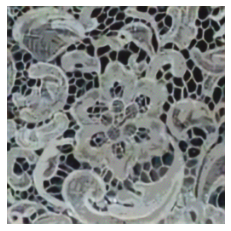

In [ ]:
gan = SRGAN()
gan.generate_images(100)

In [ ]:
from keras.backend import clear_session
number_of_epochs = 41

D_loss = []
G_loss = []
G_Feature =[]
G_total =[]

for e in range(number_of_epochs):
    #gan = 'gan_%s' %e
    #print(gan)
    gan= SRGAN()

    current_model = e*500
    print('current_model:'+str(current_model))

    # load a generator
    generator = '/content/drive/My Drive/CS236_model_result/baseline_ regular loss function/generator%s.json' %current_model
    print(generator)
    generator_weight = '/content/drive/My Drive/CS236_model_result/baseline_ regular loss function/generator%s_weight.hdf5' %current_model
    print(generator_weight)

    json_file = open(generator, 'r')
    loaded_model_json = json_file.read()
    json_file.close()
    gan.generator = model_from_json(loaded_model_json)
    # load weights into new model
    gan.generator.load_weights(generator_weight)
    print("Loaded model from disk")

    # load a discriminator

    discriminator = '/content/drive/My Drive/CS236_model_result/baseline_ regular loss function/discriminator%s.json' % current_model
    print(discriminator)
    discriminator_weight = '/content/drive/My Drive/CS236_model_result/baseline_ regular loss function/discriminator%s_weight.hdf5' % current_model
    print(discriminator_weight)

    json_file = open(discriminator, 'r')
    loaded_model_json = json_file.read()
    json_file.close()
    gan.discriminator = model_from_json(loaded_model_json)
    # load weights into new model
    gan.discriminator.load_weights(discriminator_weight)
    print("Loaded model from disk")

    optimizer = Adam(0.0002, 0.5)
    gan.discriminator.compile(loss='mse',
                                  optimizer=optimizer,
                                  metrics=['accuracy'])

    img_hr = Input(shape=gan.hr_shape)
    img_lr = Input(shape=gan.lr_shape)

    # Generate high res. version from low res.
    fake_hr = gan.generator(img_lr)

    # Extract image features of the generated img
    fake_features = gan.vgg(fake_hr)

    # For the combined model we will only train the generator
    gan.discriminator.trainable = False

    # Discriminator determines validity of generated high res. images
    validity = gan.discriminator(fake_hr)

    gan.combined = Model([img_lr, img_hr], [validity, fake_features])
    gan.combined.compile(loss=['binary_crossentropy', 'mse'],
                          loss_weights=[1e-3, 1],
                          optimizer=optimizer)


    gan.train(epochs=1, batch_size=11)
    clear_session()


result = pd.DataFrame({'D_loss': D_loss, 'G_Totol loss': G_total, 'G_Adversarial loss': G_loss, 'G_Feature loss': G_Feature})
result.to_csv('/content/drive/My Drive/CS236_model_result/baseline_ regular loss function/Model_Loss_history.csv')


(None, 256, 256, 3)
Model: "model_13"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_14 (InputLayer)          [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_51 (Conv2D)             (None, 256, 256, 64  15616       ['input_14[0][0]']               
                                )                                                                 
                                                                                                  
 activation_17 (Activation)     (None, 256, 256, 64  0           ['conv2d_51[0][0]']              
                                )                                      

FileNotFoundError: ignored

##SRGAN S-CIELAB

In [ ]:
# fresh model 
class SRGAN():
    def __init__(self):
        # Input shape
        self.channels = 3
        self.lr_height = 256                 # Low resolution height
        self.lr_width = 256                  # Low resolution width
        self.lr_shape = (self.lr_height, self.lr_width, self.channels)
        self.hr_height = self.lr_height*1   # High resolution height
        self.hr_width = self.lr_width*1     # High resolution width
        self.hr_shape = (self.hr_height, self.hr_width, self.channels)

        # Number of residual blocks in the generator
        self.n_residual_blocks = 16

        #optimizer = Adam(0.00005, 0.5, clipvalue=0.5)
        optimizer = Adam(0.00005, 0.5)

        # We use a pre-trained VGG19 model to extract image features from the high resolution
        # and the generated high resolution images and minimize the mse between them
        self.vgg = self.build_vgg()
        self.vgg.trainable = False
        self.vgg.compile(loss='mse',
            optimizer=optimizer,
            metrics=['accuracy'])

        self.S_CIELAB = self.build_SCIELAB()
        self.S_CIELAB.trainable = False
        self.S_CIELAB.compile(loss='mse',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Configure data loader
        self.dataset_name = 'CS236_train'
        self.data_loader = DataLoader(dataset_name=self.dataset_name,img_res=(self.hr_height, self.hr_width))

        # Calculate output shape of D (PatchGAN)
        patch = int(self.hr_height / 2**4)
        self.disc_patch = (patch, patch, 1)

        # Number of filters in the first layer of G and D
        self.gf = 64
        self.df = 64

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='mse',optimizer=optimizer,metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        


        # High res. and low res. images                                    #combined model input
        img_hr = Input(shape=self.hr_shape) 
        img_lr = Input(shape=self.lr_shape)

        # Generate high res. version from low res.                               #path to output
        fake_hr = self.generator(img_lr) 

        # Extract image features of the generated img                            #path to output
        fake_features = self.vgg(fake_hr)
        
        fake_features_SCIELAB = self.S_CIELAB(fake_hr)
        
        #print(fake_features)
 
        # For the combined model we will only train the generator            
        self.discriminator.trainable = False

        # Discriminator determines validity of generated high res. images       #path to output
        validity = self.discriminator(fake_hr)

        self.combined = Model([img_lr, img_hr], [validity, fake_features, fake_features_SCIELAB])        # Model([input1,input2],[output1,output2])        
        self.combined.compile(loss=['binary_crossentropy', 'mse', tf_deltaE],                # output1 vs groundtruth1  (label) : binaray_crossentropy loss
                              loss_weights=[1,0,-0.0001],                             # output2 vs groundtruth2  (feature) : mse loss
                              optimizer=optimizer)                  #loss_weights=[1e-3, 1]
        self.combined.summary()

    


    def build_vgg(self):
        """
        Builds a pre-trained VGG19 model that outputs image features extracted at the
        third block of the model
        """
        vgg = VGG19(weights="imagenet",include_top=False,input_shape=self.hr_shape)
        # Set outputs to outputs of last conv. layer in block 3
        # See architecture at: https://github.com/keras-team/keras/blob/master/keras/applications/vgg19.py
        #vgg.outputs = [vgg.layers[9].output]   #v1.15

        #img = Input(shape=self.hr_shape)     #v1.15
 
        # Extract image features         #v1.15
        #img_features = vgg(img)         # v1.15

        #https://codeleading.com/article/70796051059/   #TF v2.0 above

        return Model(vgg.input, outputs=vgg.layers[9].output)
         
    def build_SCIELAB(self):
        img_hr = Input(shape=self.hr_shape)
        out = tf_S_CIELAB(img_hr)

        return Model(img_hr,out)


    def build_generator(self):

        def residual_block(layer_input, filters):
            """Residual block described in paper"""
            d = Conv2D(filters, kernel_size=3, strides=1, padding='same')(layer_input)
            d = Activation('relu')(d)
            d = BatchNormalization(momentum=0.8)(d)
            d = Conv2D(filters, kernel_size=3, strides=1, padding='same')(d)
            d = BatchNormalization(momentum=0.8)(d)
            d = Add()([d, layer_input])
            return d

        def deconv2d(layer_input):
            """Layers used during upsampling"""
            u = UpSampling2D(size=2)(layer_input)
            u = Conv2D(256, kernel_size=3, strides=1, padding='same')(u)
            u = Activation('relu')(u)
            return u

        # Low resolution image input
        img_lr = Input(shape=self.lr_shape)

        # Pre-residual block
        c1 = Conv2D(64, kernel_size=9, strides=1, padding='same')(img_lr)
        c1 = Activation('relu')(c1)

        # Propogate through residual blocks
        r = residual_block(c1, self.gf)
        for _ in range(self.n_residual_blocks - 1):
            r = residual_block(r, self.gf)

        # Post-residual block
        c2 = Conv2D(64, kernel_size=3, strides=1, padding='same')(r)
        c2 = BatchNormalization(momentum=0.8)(c2)
        c2 = Add()([c2, c1])

        # Upsampling
        #u1 = deconv2d(c2)
        #u2 = deconv2d(u1)

        # Generate high resolution output
        gen_hr = Conv2D(self.channels, kernel_size=9, strides=1, padding='same', activation='tanh')(c2)

        return Model(img_lr, gen_hr)

    def build_discriminator(self):

        def d_block(layer_input, filters, strides=1, bn=True):
            """Discriminator layer"""
            d = Conv2D(filters, kernel_size=3, strides=strides, padding='same')(layer_input)
            d = LeakyReLU(alpha=0.2)(d)
            if bn:
                d = BatchNormalization(momentum=0.8)(d)
            return d

        # Input img
        d0 = Input(shape=self.hr_shape)

        d1 = d_block(d0, self.df, bn=False)
        d2 = d_block(d1, self.df, strides=2)
        d3 = d_block(d2, self.df*2)
        d4 = d_block(d3, self.df*2, strides=2)
        d5 = d_block(d4, self.df*4)
        d6 = d_block(d5, self.df*4, strides=2)
        d7 = d_block(d6, self.df*8)
        d8 = d_block(d7, self.df*8, strides=2)

        d9 = Dense(self.df*16)(d8)
        d10 = LeakyReLU(alpha=0.2)(d9)
        validity = Dense(1, activation='sigmoid')(d10)

        return Model(d0, validity)

    def train(self, epochs, batch_size=5, sample_interval=50):

        start_time = datetime.datetime.now()

        for epoch in range(epochs):

            # ----------------------
            #  Train Discriminator
            # ----------------------

            # Sample images and their conditioning counterparts
            imgs_hr, imgs_lr = self.data_loader.load_data(batch_size)

            # From low res. image generate high res. version
            fake_hr = self.generator.predict(imgs_lr)

            valid = np.ones((batch_size,) + self.disc_patch)
            fake = np.zeros((batch_size,) + self.disc_patch)

            # Train the discriminators (original images = real / generated = Fake)
            d_loss_real = self.discriminator.train_on_batch(imgs_hr, valid)
            d_loss_fake = self.discriminator.train_on_batch(fake_hr, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ------------------
            #  Train Generator
            # ------------------

            # Sample images and their conditioning counterparts
            imgs_hr, imgs_lr = self.data_loader.load_data(batch_size)

            # The generators want the discriminators to label the generated images as real
            valid = np.ones((batch_size,) + self.disc_patch)

            # Extract ground truth image features using pre-trained VGG19 model
            image_features = self.vgg.predict(imgs_hr)
            image_features_SCIELAB= self.S_CIELAB(imgs_hr)

            print(tf.shape(imgs_lr))
            print(tf.shape(imgs_hr))
            print(tf.shape(valid))
            print(tf.shape(image_features))
            #print(image_features)


            test = image_features[0,:,:,:]
            plt.subplot(1,3,1)
            plt.imshow(test[:,:,0])
            plt.subplot(1,3,2)
            plt.imshow(test[:,:,1])
            
            plt.subplot(1,3,3)
            plt.imshow(test[:,:,2])

            # Train the geneijgty]rators
            #g_loss = self.combined.train_on_batch([imgs_lr, imgs_hr], [valid, image_features])      # [Y1,Y2] = [groundtruth1,groundtruth2] = [valid, image_features]
            g_loss = self.combined.train_on_batch([imgs_lr, imgs_hr], [valid, image_features, image_features_SCIELAB]) 
            elapsed_time = datetime.datetime.now() - start_time
            # Plot the progress
          
            print ('-----')
            print ("%d time: %s" % (epoch, elapsed_time))
            #print (print(g_loss.history))


            print("%d [D loss: %f] [G Total loss: %f] [G Adversarial loss: %f] [G Feature loss: %f]  [G SCIELAB loss: %f]" % (
                epoch, d_loss[0], g_loss[0], g_loss[1], g_loss[2], g_loss[3]))
            
            D_loss.append(d_loss[0])
            G_total.append(g_loss[0])
            G_loss.append(g_loss[1])
            G_Feature_1.append(g_loss[2])
            G_Feature_2.append(g_loss[3])



            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_images(epoch)
                self.save_model(epoch)


    def sample_images(self, epoch):
        os.makedirs('images/%s' % self.dataset_name, exist_ok=True)
        r, c = 2, 2

        imgs_hr, imgs_lr = self.data_loader.load_data(batch_size=2, is_testing=True)
        fake_hr = self.generator.predict(imgs_lr)

        print(imgs_hr.shape)
        print(imgs_lr.shape)
        print(fake_hr.shape)


        # Rescale images 0 - 1
        imgs_lr = 0.5 * imgs_lr + 0.5
        fake_hr = 0.5 * fake_hr + 0.5
        imgs_hr = 0.5 * imgs_hr + 0.5

        # Save generated images and the high resolution originals
        titles = ['Generated', 'Original']
        fig, axs = plt.subplots(r, c)
        cnt = 0
        for row in range(r):
            for col, image in enumerate([fake_hr, imgs_hr]):
                axs[row, col].imshow(image[row])
                axs[row, col].set_title(titles[col])
                axs[row, col].axis('off')
            cnt += 1
        fig.savefig('/content/drive/My Drive/CS236_model_result/S-CIELAB loss function (1,0.0001)/lr_0.00005__no_clp/smp_size_5_neg loss/%d.png' %epoch)
        plt.close()

        # Save low resolution images for comparison
        for i in range(r):
            fig = plt.figure()
            plt.imshow(imgs_lr[i])
            fig.savefig('/content/drive/My Drive/CS236_model_result/S-CIELAB loss function (1,0.0001)/lr_0.00005__no_clp/smp_size_5_neg loss/%s_lowres%d.png' %(epoch, i))
            plt.close()


        # Save high resolution images for comparison
        for i in range(r):
            fig = plt.figure()
            plt.imshow(fake_hr[i])
            fig.savefig('/content/drive/My Drive/CS236_model_result/S-CIELAB loss function (1,0.0001)/lr_0.00005__no_clp/smp_size_5_neg loss/%d_dehalftoned%d.png' %(epoch, i))
            plt.close()


        
        # Save original high resolution images for comparison
        for i in range(r):
            fig = plt.figure()
            plt.imshow(imgs_hr[i])
            fig.savefig('/content/drive/My Drive/CS236_model_result/S-CIELAB loss function (1,0.0001)/lr_0.00005__no_clp/smp_size_5_neg loss/%d_original%d.png' %(epoch, i))
            plt.close()



    def save_model(self,epoch):

        def save(model, model_name, epoch):
            model_path = '/content/drive/My Drive/CS236_model_result/S-CIELAB loss function (1,0.0001)/lr_0.00005__no_clp/smp_size_5_neg loss/%s%s.json' %(model_name,epoch)
            weights_path = '/content/drive/My Drive/CS236_model_result/S-CIELAB loss function (1,0.0001)/lr_0.00005__no_clp/smp_size_5_neg loss/%s%s_weight.hdf5' %(model_name,epoch)
            options = {"file_arch": model_path, "file_weight": weights_path}
            json_string = model.to_json()
            open(options['file_arch'], 'w').write(json_string)
            model.save_weights(options['file_weight'])

        save(self.generator, "generator", epoch)
        save(self.discriminator, "discriminator",epoch)
        result = pd.DataFrame({'D_loss': D_loss, 'G_Totol loss': G_total, 'G_Adversarial loss': G_loss, 'G_vgg': G_Feature_1, 'G_SCIELAB': G_Feature_2})
        result.to_csv('/content/drive/My Drive/CS236_model_result/S-CIELAB loss function (1,0.0001)/lr_0.00005__no_clp/smp_size_5_neg loss/Model_Loss_history.csv')
        
    def feature(self,batch_size=1):
        imgs_hr, imgs_lr = self.data_loader.load_data(batch_size)
        image_features = self.vgg.predict(imgs_hr)
        plt.imshow(imgs_hr[0])
        plt.show()

        print(image_features.shape)

        dir = "C:/che/%s"
        for i in range(256):
            plt.imshow(image_features[0, :, :, i])
            plt.savefig(dir % i)
            plt.show()

    def deltaE(lab1,lab2):
      a,ra,ca,wa = np.reshape(lab1,(lab1.shape[0]*lab1.shape[1],lab1.shape[2])),lab1.shape[0],lab1.shape[1],lab1.shape[2]
      b,rb,cb,wb = np.reshape(lab2,(lab2.shape[0]*lab2.shape[1],lab2.shape[2])),lab2.shape[0],lab2.shape[1],lab2.shape[2]
      print(ra,ca,wa)
      print(rb,cb,wb)

      Lstd = a[:,0]
      astd = a[:,1]
      bstd = a[:,2]
      Cabstd = np.sqrt(np.power(astd,2)+np.power(bstd,2))

      Lsample = b[:,0]
      asample = b[:,1]
      bsample = b[:,2]
      Cabsample = np.sqrt(np.power(asample,2)+np.power(bsample,2))

      Cabarithmean = (Cabstd+Cabsample)/2

      G = 0.5*(1-np.sqrt(np.power(Cabarithmean,7)/(np.add(np.power(Cabarithmean,7),25^7))))

      apstd = (1+G)*astd
      apsample = (1+G)*asample 
      Cpsample = np.sqrt(np.power(apsample,2)+np.power(bsample,2))
      Cpstd = np.sqrt(np.power(apstd,2)+np.power(bstd,2))

      Cpprod = Cpsample*Cpstd
      zcidx = np.where(Cpprod==0)

      print(Cpprod.shape)
      print(zcidx)
      

      hpstd = np.arctan2(bstd,apstd)
      hpstd = hpstd+2*np.pi*(hpstd<0)
      hpstd[np.where((abs(apstd)+abs(bstd))==0)] = 0
      hpsample = np.arctan2(bsample,apsample)
      hpsample = hpsample+2*np.pi*(hpsample<0)
      hpsample[np.where((abs(apsample)+abs(bsample))==0)] = 0

      dL = Lsample-Lstd
      dC = Cpsample-Cpstd

      dhp = (hpsample-hpstd)
      dhp = dhp-2*np.pi*(dhp>np.pi)
      dhp = dhp+2*np.pi*(dhp<(-np.pi))

      dhp[zcidx] = 0

      dH = 2*np.sqrt(Cpprod)*np.sin(dhp/2)

      Lp = (Lsample+Lstd)/2 
      Cp = (Cpstd+Cpsample)/2

      hp = (hpstd+hpsample)/2

      hp = hp-(abs(hpstd-hpsample)>np.pi)*np.pi

      hp = hp+(hp<0)*2*np.pi

      hp[zcidx] = hpsample[zcidx]+hpstd[zcidx]

      Lpm502 = np.power((Lp-50),2)
      Sl = 1+ 0.015*Lpm502/np.sqrt(np.add(20,Lpm502))
      Sc = 1+0.045*Cp
      T = 1-0.17*np.cos(hp-np.pi/6)+0.24*np.cos(2*hp)+0.32*np.cos(3*hp+np.pi/30)-0.2*np.cos(4*hp-63*np.pi/180)
      Sh = 1+0.015*Cp*T
      delthetarad = (30*np.pi/180)*np.exp(-(np.power((180/np.pi*hp-275)/25,2)))
      Rc = 2*np.sqrt(np.power(Cp,7))/(np.add(np.power(Cp,7),25**7))
      RT = -np.sin(2*delthetarad)*Rc

      kl,kc,kh=1,1,1

      klSl = kl*Sl
      kcSc = kc*Sc
      khSh = kh*Sh

      de00 = np.sqrt(np.power(dL/klSl,2)+np.power(dC/kcSc,2)+np.power(dH/khSh,2)+ RT*(dC/kcSc)*(dH/khSh))

      dEab = np.reshape(de00,(ra,ca))

      return dEab

    def cal_deltaE(feature1,feature2):
      delE_out = []
      for i in range(feature1.shape[0]):
        out = deltaE(feature1[i,:,:,:],feature2[i,:,:,:])
        delE_out.append(np.sum(out))
        
      delE_out = np.array(delE_out)
      return delE_out

    def tf_deltaE(input1,input2):
      y = tf.numpy_function(cal_deltaE, [input1,input2], [tf.float64])
      
      return -y

In [ ]:
#load trained model 
class SRGAN():
    def __init__(self,a,b,L):
        # Input shape
        self.channels = 3
        self.lr_height = 256                 # Low resolution height
        self.lr_width = 256                  # Low resolution width
        self.lr_shape = (self.lr_height, self.lr_width, self.channels)
        self.hr_height = self.lr_height*1   # High resolution height
        self.hr_width = self.lr_width*1     # High resolution width
        self.hr_shape = (self.hr_height, self.hr_width, self.channels)
        self.rate = a
        self.rate2 = b
        self.loss = L
        

        # Number of residual blocks in the generator
        self.n_residual_blocks = 16

        #optimizer = Adam(0.0002, 0.5)
        #optimizer = Adam(0.00005, 0.5, clipvalue=0.5)
        #optimizer = Adam(a, b, clipvalue=0.5)
        optimizer = Adam(a, b)


        # We use a pre-trained VGG19 model to extract image features from the high resolution
        # and the generated high resolution images and minimize the mse between them
        self.vgg = self.build_vgg()
        self.vgg.trainable = False
        self.vgg.compile(loss='mse',
            optimizer=optimizer,
            metrics=['accuracy'])
          
        self.S_CIELAB = self.build_SCIELAB()
        self.S_CIELAB.trainable = False
        self.S_CIELAB.compile(loss='mse',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Configure data loader
        self.dataset_name = 'CS236_train'
        self.data_loader = DataLoader(dataset_name=self.dataset_name,img_res=(self.hr_height, self.hr_width))

        # Calculate output shape of D (PatchGAN)
        patch = int(self.hr_height / 2**4)
        self.disc_patch = (patch, patch, 1)

        # Number of filters in the first layer of G and D
        self.gf = 64
        self.df = 64

        # Build and compile the discriminator
        #self.discriminator = self.build_discriminator()
        #self.discriminator.compile(loss='mse',optimizer=optimizer,metrics=['accuracy'])

        # Build the generator
        #self.generator = self.build_generator()

        #load a generator

        json_file = open('/content/drive/My Drive/CS236_model_result/baseline_ regular loss function/generator1500.json', 'r')
        loaded_model_json = json_file.read()
        json_file.close()
        self.generator = model_from_json(loaded_model_json)
        self.generator.summary()
        # load weights into new model
        self.generator.load_weights(filepath='/content/drive/My Drive/CS236_model_result/baseline_ regular loss function/generator1500_weight.hdf5')
        print("Loaded model from disk")

        self.generator.summary()

        #load a discriminator

        json_file = open('/content/drive/My Drive/CS236_model_result/baseline_ regular loss function/discriminator1500.json', 'r')
        loaded_model_json = json_file.read()
        json_file.close()
        self.discriminator = model_from_json(loaded_model_json)
        # load weights into new model
        self.discriminator.load_weights('/content/drive/My Drive/CS236_model_result/baseline_ regular loss function/discriminator1500_weight.hdf5')
        print("Loaded model from disk")

        self.discriminator.compile(loss='mse',optimizer=optimizer,metrics=['accuracy'])
        self.discriminator.summary()


        # High res. and low res. images                                          #combined model input
        img_hr = Input(shape=self.hr_shape) 
        img_lr = Input(shape=self.lr_shape)

        # Generate high res. version from low res.                               #path to output
        fake_hr = self.generator(img_lr) 

        # Extract image features of the generated img                            #path to output
        fake_features = self.vgg(fake_hr)
        
        fake_features_SCIELAB = self.S_CIELAB(fake_hr)
 
        # For the combined model we will only train the generator            
        self.discriminator.trainable = False

        # Discriminator determines validity of generated high res. images       #path to output
        validity = self.discriminator(fake_hr)

        self.combined = Model([img_lr, img_hr], [validity, fake_features,fake_features_SCIELAB])        # Model([input1,input2],[output1,output2])        
        self.combined.compile(loss=['binary_crossentropy', 'mse', tf_deltaE],                # output1 vs groundtruth1  (label) : binaray_crossentropy loss
                              loss_weights=[1,0,L],                             # output2 vs groundtruth2  (feature) : mse loss
                              optimizer=optimizer)                  #loss_weights=[1e-3, 1]
        self.combined.summary()
        

    def build_vgg(self):
        """
        Builds a pre-trained VGG19 model that outputs image features extracted at the
        third block of the model
        """
        vgg = VGG19(weights="imagenet",include_top=False,input_shape=self.hr_shape)
        # Set outputs to outputs of last conv. layer in block 3
        # See architecture at: https://github.com/keras-team/keras/blob/master/keras/applications/vgg19.py
        #vgg.outputs = [vgg.layers[9].output]   #v1.15

        #img = Input(shape=self.hr_shape)     #v1.15
 
        # Extract image features         #v1.15
        #img_features = vgg(img)         # v1.15

        #https://codeleading.com/article/70796051059/   #TF v2.0 above

        return Model(vgg.input, outputs=vgg.layers[9].output)
    
    
    def build_SCIELAB(self):
        img_hr = Input(shape=self.hr_shape)
        out = tf_S_CIELAB(img_hr)

        return Model(img_hr,out)


    def build_generator(self):

        def residual_block(layer_input, filters):
            """Residual block described in paper"""
            d = Conv2D(filters, kernel_size=3, strides=1, padding='same')(layer_input)
            d = Activation('relu')(d)
            d = BatchNormalization(momentum=0.8)(d)
            d = Conv2D(filters, kernel_size=3, strides=1, padding='same')(d)
            d = BatchNormalization(momentum=0.8)(d)
            d = Add()([d, layer_input])
            return d

        def deconv2d(layer_input):
            """Layers used during upsampling"""
            u = UpSampling2D(size=4)(layer_input)
            u = Conv2D(256, kernel_size=3, strides=1, padding='same')(u)
            u = Activation('relu')(u)
            return u

        # Low resolution image input
        img_lr = Input(shape=self.lr_shape)
        print(img_lr.shape)

        # Pre-residual block
        c1 = Conv2D(64, kernel_size=9, strides=1, padding='same')(img_lr)
        c1 = Activation('relu')(c1)

        # Propogate through residual blocks
        r = residual_block(c1, self.gf)
        for _ in range(self.n_residual_blocks - 1):
            r = residual_block(r, self.gf)

        # Post-residual block
        c2 = Conv2D(64, kernel_size=3, strides=1, padding='same')(r)
        c2 = BatchNormalization(momentum=0.8)(c2)
        c2 = Add()([c2, c1])

        # Upsampling
        #u1 = deconv2d(c2)
        #u2 = deconv2d(u1)

        # Generate high resolution output
        gen_hr = Conv2D(self.channels, kernel_size=9, strides=1, padding='same', activation='tanh')(c2)

        return Model(img_lr, gen_hr)

    def build_discriminator(self):

        def d_block(layer_input, filters, strides=1, bn=True):
            """Discriminator layer"""
            d = Conv2D(filters, kernel_size=3, strides=strides, padding='same')(layer_input)
            d = LeakyReLU(alpha=0.2)(d)
            if bn:
                d = BatchNormalization(momentum=0.8)(d)
            return d

        # Input img
        d0 = Input(shape=self.hr_shape)

        d1 = d_block(d0, self.df, bn=False)
        d2 = d_block(d1, self.df, strides=2)
        d3 = d_block(d2, self.df*2)
        d4 = d_block(d3, self.df*2, strides=2)
        d5 = d_block(d4, self.df*4)
        d6 = d_block(d5, self.df*4, strides=2)
        d7 = d_block(d6, self.df*8)
        d8 = d_block(d7, self.df*8, strides=2)

        d9 = Dense(self.df*16)(d8)
        d10 = LeakyReLU(alpha=0.2)(d9)
        validity = Dense(1, activation='sigmoid')(d10)

        return Model(d0, validity)

    def train(self, epochs, batch_size=50, sample_interval=50):

        start_time = datetime.datetime.now()

        for epoch in range(epochs):

            # ----------------------
            #  Train Discriminator
            # ----------------------

            # Sample images and their conditioning counterparts
            imgs_hr, imgs_lr = self.data_loader.load_data(batch_size)

            # From low res. image generate high res. version
            fake_hr = self.generator.predict(imgs_lr)

            valid = np.ones((batch_size,) + self.disc_patch)
            fake = np.zeros((batch_size,) + self.disc_patch)

            # Train the discriminators (original images = real / generated = Fake)
            d_loss_real = self.discriminator.train_on_batch(imgs_hr, valid)
            d_loss_fake = self.discriminator.train_on_batch(fake_hr, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ------------------
            #  Train Generator
            # ------------------

            # Sample images and their conditioning counterparts
            imgs_hr, imgs_lr = self.data_loader.load_data(batch_size)

            # The generators want the discriminators to label the generated images as real
            valid = np.ones((batch_size,) + self.disc_patch)

            # Extract ground truth image features using pre-trained VGG19 model
            image_features = self.vgg.predict(imgs_hr)
            image_features_SCIELAB= self.S_CIELAB(imgs_hr)

            # Train the geneijgty]rators
            g_loss = self.combined.train_on_batch([imgs_lr, imgs_hr], [valid, image_features,image_features_SCIELAB])      # [Y1,Y2] = [groundtruth1,groundtruth2] = [valid, image_features]
            elapsed_time = datetime.datetime.now() - start_time
            # Plot the progress
            print ('-----')
            print ("%d time: %s" % (epoch, elapsed_time))
            #print (print(g_loss.history))


            print("%d [D loss: %f] [G Total loss: %f] [G Adversarial loss: %f] [G Feature loss: %f]  [G SCIELAB loss: %f]" % (
                epoch, d_loss[0], g_loss[0], g_loss[1], g_loss[2], g_loss[3]))
            
            D_loss.append(d_loss[0])
            G_total.append(g_loss[0])
            G_loss.append(g_loss[1])
            G_Feature_1.append(g_loss[2])
            G_Feature_2.append(g_loss[3])


            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_images(epoch)
                self.save_model(epoch)


    def sample_images(self, epoch):
        os.makedirs('images/%s' % self.dataset_name, exist_ok=True)
        r, c = 2, 2

        imgs_hr, imgs_lr = self.data_loader.load_data(batch_size=5, is_testing=True)
        fake_hr = self.generator.predict(imgs_lr)

        print(imgs_hr.shape)
        print(imgs_lr.shape)
        print(fake_hr.shape)


        # Rescale images 0 - 1
        imgs_lr = 0.5 * imgs_lr + 0.5
        fake_hr = 0.5 * fake_hr + 0.5
        imgs_hr = 0.5 * imgs_hr + 0.5

        # Save generated images and the high resolution originals
        titles = ['Generated', 'Original']
        fig, axs = plt.subplots(r, c)
        cnt = 0
        for row in range(r):
            for col, image in enumerate([fake_hr, imgs_hr]):
                axs[row, col].imshow(image[row])
                axs[row, col].set_title(titles[col])
                axs[row, col].axis('off')
            cnt += 1
        fig.savefig('/content/drive/My Drive/CS236_model_result/baseline1500epoch_then_S-CIELAB(1,0.0001)/lr_0.0002_no_clp/%s_%s_%s_%s.png' %(self.rate,self.rate2,self.loss,epoch))
        plt.close()

        # Save low resolution images for comparison
        for i in range(r):
            fig = plt.figure()
            plt.imshow(imgs_lr[i])
            fig.savefig('/content/drive/My Drive/CS236_model_result/baseline1500epoch_then_S-CIELAB(1,0.0001)/lr_0.0002_no_clp/%s_%s_%s_%d_lowres%d.png' %(self.rate,self.rate2,self.loss,epoch, i))
            plt.close()


        # Save high resolution images for comparison
        for i in range(r):
            fig = plt.figure()
            plt.imshow(fake_hr[i])
            fig.savefig('/content/drive/My Drive/CS236_model_result/baseline1500epoch_then_S-CIELAB(1,0.0001)/lr_0.0002_no_clp/%s_%s_%s_%d_dehalftoned%d.png' %(self.rate,self.rate2,self.loss,epoch, i))
            plt.close()


        
        # Save original high resolution images for comparison
        for i in range(r):
            fig = plt.figure()
            plt.imshow(imgs_hr[i])
            fig.savefig('/content/drive/My Drive/CS236_model_result/baseline1500epoch_then_S-CIELAB(1,0.0001)/lr_0.0002_no_clp/%s_%s_%s_%d_original%d.png' %(self.rate,self.rate2,self.loss,epoch, i))
            plt.close()



    def generate_images(self, epoch):
        os.makedirs('images/%s' % self.dataset_name, exist_ok=True)

        imgs_hr, imgs_lr = self.data_loader.load_data(batch_size=5, is_testing=True)
        fake_hr = self.generator.predict(imgs_lr)

        print(imgs_hr.shape)
        print(imgs_lr.shape)
        print(fake_hr.shape)


        # Rescale images 0 - 1
        imgs_lr = 0.5 * imgs_lr + 0.5
        fake_hr = 0.5 * fake_hr + 0.5
        imgs_hr = 0.5 * imgs_hr + 0.5

        np.save('/content/drive/My Drive/CS236_model_result/baseline1500epoch_then_S-CIELAB(1,0.0001)/lr_0.0002__clp_0.5/5000 epoch/random_lr_/imgs_lr', imgs_lr)
        np.save('/content/drive/My Drive/CS236_model_result/baseline1500epoch_then_S-CIELAB(1,0.0001)/lr_0.0002__clp_0.5/5000 epoch/random_/fake_hr', fake_hr)
        np.save('/content/drive/My Drive/CS236_model_result/baseline1500epoch_then_S-CIELAB(1,0.0001)/lr_0.0002__clp_0.5/5000 epoch/origin_/imgs_hr', imgs_hr)
     

        dir = '/content/drive/My Drive/CS236_model_result/baseline1500epoch_then_S-CIELAB(1,0.0001)/lr_0.0002__clp_0.5/5000 epoch/origin_/%s_'
        dir2 ='/content/drive/My Drive/CS236_model_result/baseline1500epoch_then_S-CIELAB(1,0.0001)/lr_0.0002__clp_0.5/5000 epoch/random_/%s_'
        dir3 ='/content/drive/My Drive/CS236_model_result/baseline1500epoch_then_S-CIELAB(1,0.0001)/lr_0.0002__clp_0.5/5000 epoch/random_lr_/%s_'


        for i in range(imgs_hr.shape[0]):
            imgs_hr_org = imgs_hr[i,:,:,:]
            plt.imshow(imgs_hr_org)
            plt.axis('off')
            plt.savefig(dir %i)
            plt.close

        for i in range(fake_hr.shape[0]):
            imgs_hr_fake = fake_hr[i,:,:,:]
            plt.imshow(imgs_hr_fake)
            plt.axis('off')
            plt.savefig(dir2 %i)
            plt.close

        for i in range(imgs_lr.shape[0]):
            imgs_lr_ = imgs_lr[i,:,:,:]
            plt.imshow(imgs_lr_)
            plt.axis('off')
            plt.savefig(dir3 %i)
            plt.close
 


    def save_model(self,epoch):

        def save(model, model_name, epoch):
            model_path = ('/content/drive/My Drive/CS236_model_result/baseline1500epoch_then_S-CIELAB(1,0.0001)/lr_0.0002_no_clp/%s%s.json' %(model_name,epoch))
            weights_path = ('/content/drive/My Drive/CS236_model_result/baseline1500epoch_then_S-CIELAB(1,0.0001)/lr_0.0002_no_clp/%s%s_weight.hdf5' %(model_name,epoch))
            options = {"file_arch": model_path, "file_weight": weights_path}
            json_string = model.to_json()
            open(options['file_arch'], 'w').write(json_string)
            model.save_weights(options['file_weight'])

        save(self.generator, "generator", epoch)
        save(self.discriminator, "discriminator",epoch)
        result = pd.DataFrame({'D_loss': D_loss, 'G_Totol loss': G_total, 'G_Adversarial loss': G_loss, 'G_vgg': G_Feature_1, 'G_SCIELAB': G_Feature_2})
        result.to_csv('/content/drive/My Drive/CS236_model_result/baseline1500epoch_then_S-CIELAB(1,0.0001)/lr_0.0002_no_clp/Model_Loss_history.csv')
        
    def feature(self,batch_size=1):
        imgs_hr, imgs_lr = self.data_loader.load_data(batch_size)
        image_features = self.vgg.predict(imgs_hr)
        plt.imshow(imgs_hr[0])
        plt.show()

        print(image_features.shape)

        dir = "C:/che/%s"
        for i in range(256):
            plt.imshow(image_features[0, :, :, i])
            plt.savefig(dir % i)
            plt.show()

    def deltaE(lab1,lab2):
      a,ra,ca,wa = np.reshape(lab1,(lab1.shape[0]*lab1.shape[1],lab1.shape[2])),lab1.shape[0],lab1.shape[1],lab1.shape[2]
      b,rb,cb,wb = np.reshape(lab2,(lab2.shape[0]*lab2.shape[1],lab2.shape[2])),lab2.shape[0],lab2.shape[1],lab2.shape[2]
      print(ra,ca,wa)
      print(rb,cb,wb)

      Lstd = a[:,0]
      astd = a[:,1]
      bstd = a[:,2]
      Cabstd = np.sqrt(np.power(astd,2)+np.power(bstd,2))

      Lsample = b[:,0]
      asample = b[:,1]
      bsample = b[:,2]
      Cabsample = np.sqrt(np.power(asample,2)+np.power(bsample,2))

      Cabarithmean = (Cabstd+Cabsample)/2

      G = 0.5*(1-np.sqrt(np.power(Cabarithmean,7)/(np.add(np.power(Cabarithmean,7),25^7))))

      apstd = (1+G)*astd
      apsample = (1+G)*asample 
      Cpsample = np.sqrt(np.power(apsample,2)+np.power(bsample,2))
      Cpstd = np.sqrt(np.power(apstd,2)+np.power(bstd,2))

      Cpprod = Cpsample*Cpstd
      zcidx = np.where(Cpprod==0)

      print(Cpprod.shape)
      print(zcidx)
      

      hpstd = np.arctan2(bstd,apstd)
      hpstd = hpstd+2*np.pi*(hpstd<0)
      hpstd[np.where((abs(apstd)+abs(bstd))==0)] = 0
      hpsample = np.arctan2(bsample,apsample)
      hpsample = hpsample+2*np.pi*(hpsample<0)
      hpsample[np.where((abs(apsample)+abs(bsample))==0)] = 0

      dL = Lsample-Lstd
      dC = Cpsample-Cpstd

      dhp = (hpsample-hpstd)
      dhp = dhp-2*np.pi*(dhp>np.pi)
      dhp = dhp+2*np.pi*(dhp<(-np.pi))

      dhp[zcidx] = 0

      dH = 2*np.sqrt(Cpprod)*np.sin(dhp/2)

      Lp = (Lsample+Lstd)/2 
      Cp = (Cpstd+Cpsample)/2

      hp = (hpstd+hpsample)/2

      hp = hp-(abs(hpstd-hpsample)>np.pi)*np.pi

      hp = hp+(hp<0)*2*np.pi

      hp[zcidx] = hpsample[zcidx]+hpstd[zcidx]

      Lpm502 = np.power((Lp-50),2)
      Sl = 1+ 0.015*Lpm502/np.sqrt(np.add(20,Lpm502))
      Sc = 1+0.045*Cp
      T = 1-0.17*np.cos(hp-np.pi/6)+0.24*np.cos(2*hp)+0.32*np.cos(3*hp+np.pi/30)-0.2*np.cos(4*hp-63*np.pi/180)
      Sh = 1+0.015*Cp*T
      delthetarad = (30*np.pi/180)*np.exp(-(np.power((180/np.pi*hp-275)/25,2)))
      Rc = 2*np.sqrt(np.power(Cp,7))/(np.add(np.power(Cp,7),25**7))
      RT = -np.sin(2*delthetarad)*Rc

      kl,kc,kh=1,1,1

      klSl = kl*Sl
      kcSc = kc*Sc
      khSh = kh*Sh

      de00 = np.sqrt(np.power(dL/klSl,2)+np.power(dC/kcSc,2)+np.power(dH/khSh,2)+ RT*(dC/kcSc)*(dH/khSh))

      dEab = np.reshape(de00,(ra,ca))

      return dEab

    def cal_deltaE(feature1,feature2):
      delE_out = []
      for i in range(feature1.shape[0]):
        out = deltaE(feature1[i,:,:,:],feature2[i,:,:,:])
        delE_out.append(np.sum(out))
        
      delE_out = np.array(delE_out)
      return delE_out

    def tf_deltaE(input1,input2):
      y = tf.numpy_function(cal_deltaE, [input1,input2], [tf.float64])
      
      return y

In [ ]:
D_loss = []
G_loss = []
G_Feature_1 =[]
G_Feature_2 =[]
G_total =[]

gan = SRGAN()
gan.train(epochs=20000, batch_size=5, sample_interval=100)

In [ ]:
D_loss = []
G_loss = []
G_Feature_1 =[]
G_Feature_2 =[]
G_total =[]


gan = SRGAN(0.0002,0.5,1)
gan.generate_images(5)

In [ ]:
D_loss = []
G_loss = []
G_Feature_1 =[]
G_Feature_2 =[]
G_total =[]

gan = SRGAN(0.0002,0.5,0.0001)
gan.train(epochs=20000, batch_size=11, sample_interval=100)

In [ ]:
A = [0.00005]
B = [0.9]
L_ = [1e-3,1,1000]

for a in A:
  for b in B:
    for L in L_:
      gan = SRGAN(a,b,L)
      gan.train(epochs=601, batch_size=11, sample_interval=100)

##SRGAN S-CIELAB->Vgg featutre

In [ ]:
# fresh model 
class SRGAN():
    def __init__(self):
        # Input shape
        self.channels = 3
        self.lr_height = 256                 # Low resolution height
        self.lr_width = 256                  # Low resolution width
        self.lr_shape = (self.lr_height, self.lr_width, self.channels)
        self.hr_height = self.lr_height*1   # High resolution height
        self.hr_width = self.lr_width*1     # High resolution width
        self.hr_shape = (self.hr_height, self.hr_width, self.channels)

        # Number of residual blocks in the generator
        self.n_residual_blocks = 16

        optimizer = Adam(0.0002, 0.5)

        # We use a pre-trained VGG19 model to extract image features from the high resolution
        # and the generated high resolution images and minimize the mse between them
        self.vgg = self.build_vgg()
        self.vgg.trainable = False
        self.vgg.compile(loss='mse',
            optimizer=optimizer,
            metrics=['accuracy'])

        self.S_CIELAB = self.build_SCIELAB()
        self.S_CIELAB.trainable = False
        self.S_CIELAB.compile(loss='mse',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Configure data loader
        self.dataset_name = 'CS236_train'
        self.data_loader = DataLoader(dataset_name=self.dataset_name,img_res=(self.hr_height, self.hr_width))

        # Calculate output shape of D (PatchGAN)
        patch = int(self.hr_height / 2**4)
        self.disc_patch = (patch, patch, 1)

        # Number of filters in the first layer of G and D
        self.gf = 64
        self.df = 64

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='mse',optimizer=optimizer,metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        


        # High res. and low res. images                                    #combined model input
        img_hr = Input(shape=self.hr_shape) 
        img_lr = Input(shape=self.lr_shape)

        # Generate high res. version from low res.                               #path to output
        fake_hr = self.generator(img_lr) 

        # Extract image features of the generated img                            #path to output
        
        fake_features_SCIELAB = self.S_CIELAB(fake_hr)
        fake_features = self.vgg(fake_features_SCIELAB)
        
        #print(fake_features)
 
        # For the combined model we will only train the generator            
        self.discriminator.trainable = False

        # Discriminator determines validity of generated high res. images       #path to output
        validity = self.discriminator(fake_hr)

        self.combined = Model([img_lr, img_hr], [validity, fake_features])        # Model([input1,input2],[output1,output2])        
        self.combined.compile(loss=['binary_crossentropy', 'mse'],                # output1 vs groundtruth1  (label) : binaray_crossentropy loss
                              loss_weights=[1e-3,1e-3],                             # output2 vs groundtruth2  (feature) : mse loss
                              optimizer=optimizer)                  #loss_weights=[1e-3, 1]
        self.combined.summary()


    def build_vgg(self):
        """
        Builds a pre-trained VGG19 model that outputs image features extracted at the
        third block of the model
        """
        vgg = VGG19(weights="imagenet",include_top=False,input_shape=(255,255,3))
        # Set outputs to outputs of last conv. layer in block 3
        # See architecture at: https://github.com/keras-team/keras/blob/master/keras/applications/vgg19.py
        #vgg.outputs = [vgg.layers[9].output]   #v1.15

        #img = Input(shape=self.hr_shape)     #v1.15
 
        # Extract image features         #v1.15
        #img_features = vgg(img)         # v1.15

        #https://codeleading.com/article/70796051059/   #TF v2.0 above

        return Model(vgg.input, outputs=vgg.layers[9].output)
         
    def build_SCIELAB(self):
        img_hr = Input(shape=self.hr_shape)
        out = tf_S_CIELAB(img_hr)

        return Model(img_hr,out)


    def build_generator(self):

        def residual_block(layer_input, filters):
            """Residual block described in paper"""
            d = Conv2D(filters, kernel_size=3, strides=1, padding='same')(layer_input)
            d = BatchNormalization(momentum=0.8)(d)
            d = Activation('relu')(d)
            d = Conv2D(filters, kernel_size=3, strides=1, padding='same')(d)
            d = BatchNormalization(momentum=0.8)(d)
            d = Add()([d, layer_input])
            return d

        def deconv2d(layer_input):
            """Layers used during upsampling"""
            u = UpSampling2D(size=2)(layer_input)
            u = Conv2D(256, kernel_size=3, strides=1, padding='same')(u)
            u = Activation('relu')(u)
            return u

        # Low resolution image input
        img_lr = Input(shape=self.lr_shape)

        # Pre-residual block
        c1 = Conv2D(64, kernel_size=9, strides=1, padding='same')(img_lr)
        c1 = Activation('relu')(c1)

        # Propogate through residual blocks
        r = residual_block(c1, self.gf)
        for _ in range(self.n_residual_blocks - 1):
            r = residual_block(r, self.gf)

        # Post-residual block
        c2 = Conv2D(64, kernel_size=3, strides=1, padding='same')(r)
        c2 = BatchNormalization(momentum=0.8)(c2)
        c2 = Add()([c2, c1])

        # Upsampling
        #u1 = deconv2d(c2)
        #u2 = deconv2d(u1)

        # Generate high resolution output
        gen_hr = Conv2D(self.channels, kernel_size=9, strides=1, padding='same', activation='tanh')(c2)

        return Model(img_lr, gen_hr)

    def build_discriminator(self):

        def d_block(layer_input, filters, strides=1, bn=True):
            """Discriminator layer"""
            d = Conv2D(filters, kernel_size=3, strides=strides, padding='same')(layer_input)
            d = LeakyReLU(alpha=0.2)(d)
            if bn:
                d = BatchNormalization(momentum=0.8)(d)
            return d

        # Input img
        d0 = Input(shape=self.hr_shape)

        d1 = d_block(d0, self.df, bn=False)
        d2 = d_block(d1, self.df, strides=2)
        d3 = d_block(d2, self.df*2)
        d4 = d_block(d3, self.df*2, strides=2)
        d5 = d_block(d4, self.df*4)
        d6 = d_block(d5, self.df*4, strides=2)
        d7 = d_block(d6, self.df*8)
        d8 = d_block(d7, self.df*8, strides=2)

        d9 = Dense(self.df*16)(d8)
        d10 = LeakyReLU(alpha=0.2)(d9)
        validity = Dense(1, activation='sigmoid')(d10)

        return Model(d0, validity)

    def train(self, epochs, batch_size=50, sample_interval=50):

        start_time = datetime.datetime.now()

        for epoch in range(epochs):

            # ----------------------
            #  Train Discriminator
            # ----------------------

            # Sample images and their conditioning counterparts
            imgs_hr, imgs_lr = self.data_loader.load_data(batch_size)

            # From low res. image generate high res. version
            fake_hr = self.generator.predict(imgs_lr)

            valid = np.ones((batch_size,) + self.disc_patch)
            fake = np.zeros((batch_size,) + self.disc_patch)

            # Train the discriminators (original images = real / generated = Fake)
            d_loss_real = self.discriminator.train_on_batch(imgs_hr, valid)
            d_loss_fake = self.discriminator.train_on_batch(fake_hr, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ------------------
            #  Train Generator
            # ------------------

            # Sample images and their conditioning counterparts
            imgs_hr, imgs_lr = self.data_loader.load_data(batch_size)

            # The generators want the discriminators to label the generated images as real
            valid = np.ones((batch_size,) + self.disc_patch)

            # Extract ground truth image features using pre-trained VGG19 model
           
            image_features_SCIELAB= self.S_CIELAB(imgs_hr)
            image_features = self.vgg.predict(image_features_SCIELAB)

            print(tf.shape(imgs_lr))
            print(tf.shape(imgs_hr))
            print(tf.shape(valid))
            print(tf.shape(image_features))
            #print(image_features)


            test = image_features[0,:,:,:]
            plt.subplot(1,3,1)
            plt.imshow(test[:,:,0])
            plt.subplot(1,3,2)
            plt.imshow(test[:,:,1])
            
            plt.subplot(1,3,3)
            plt.imshow(test[:,:,2])

            # Train the geneijgty]rators
            #g_loss = self.combined.train_on_batch([imgs_lr, imgs_hr], [valid, image_features])      # [Y1,Y2] = [groundtruth1,groundtruth2] = [valid, image_features]
            g_loss = self.combined.train_on_batch([imgs_lr, imgs_hr], [valid, image_features]) 
            elapsed_time = datetime.datetime.now() - start_time
            # Plot the progress
          
            print ('-----')
            print ("%d time: %s" % (epoch, elapsed_time))
            #print (print(g_loss.history))


            print("%d [D loss: %f] [G Total loss: %f] [G Adversarial loss: %f] [G Feature loss: %f]" % (
                epoch, d_loss[0], g_loss[0], g_loss[1], g_loss[2]))
            
            D_loss.append(d_loss[0])
            G_total.append(g_loss[0])
            G_loss.append(g_loss[1])
            G_Feature.append(g_loss[2])

            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_images(epoch)
                self.save_model(epoch)

    
    def sample_images(self, epoch):
        os.makedirs('images/%s' % self.dataset_name, exist_ok=True)
        r, c = 2, 2

        imgs_hr, imgs_lr = self.data_loader.load_data(batch_size=2, is_testing=True)
        fake_hr = self.generator.predict(imgs_lr)

        print(imgs_hr.shape)
        print(imgs_lr.shape)
        print(fake_hr.shape)


        # Rescale images 0 - 1
        imgs_lr = 0.5 * imgs_lr + 0.5
        fake_hr = 0.5 * fake_hr + 0.5
        imgs_hr = 0.5 * imgs_hr + 0.5

        # Save generated images and the high resolution originals
        titles = ['Generated', 'Original']
        fig, axs = plt.subplots(r, c)
        cnt = 0
        for row in range(r):
            for col, image in enumerate([fake_hr, imgs_hr]):
                axs[row, col].imshow(image[row])
                axs[row, col].set_title(titles[col])
                axs[row, col].axis('off')
            cnt += 1
        fig.savefig('/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/%d.png' %epoch)
        plt.close()

        # Save low resolution images for comparison
        for i in range(r):
            fig = plt.figure()
            plt.imshow(imgs_lr[i])
            fig.savefig('/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/%s_lowres%d.png' %(epoch, i))
            plt.close()


        # Save high resolution images for comparison
        for i in range(r):
            fig = plt.figure()
            plt.imshow(fake_hr[i])
            fig.savefig('/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/%d_dehalftoned%d.png' %(epoch, i))
            plt.close()


        
        # Save original high resolution images for comparison
        for i in range(r):
            fig = plt.figure()
            plt.imshow(imgs_hr[i])
            fig.savefig('/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/%d_original%d.png' %(epoch, i))
            plt.close()



    def save_model(self,epoch):

        def save(model, model_name, epoch):
            model_path = '/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/%s%s.json' %(model_name,epoch)
            weights_path = '/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/%s%s_weight.hdf5' %(model_name,epoch)
            options = {"file_arch": model_path, "file_weight": weights_path}
            json_string = model.to_json()
            open(options['file_arch'], 'w').write(json_string)
            model.save_weights(options['file_weight'])

        save(self.generator, "generator", epoch)
        save(self.discriminator, "discriminator",epoch)
        
        result = pd.DataFrame({'D_loss': D_loss, 'G_Totol loss': G_total, 'G_Adversarial loss': G_loss, 'G_Feature loss': G_Feature})
        result.to_csv('/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/Model_Loss_history.csv')
        
    def feature(self,batch_size=1):
        imgs_hr, imgs_lr = self.data_loader.load_data(batch_size)
        image_features = self.vgg.predict(imgs_hr)
        plt.imshow(imgs_hr[0])
        plt.show()

        print(image_features.shape)

        dir = "C:/che/%s"
        for i in range(256):
            plt.imshow(image_features[0, :, :, i])
            plt.savefig(dir % i)
            plt.show()

    def deltaE(lab1,lab2):
      a,ra,ca,wa = np.reshape(lab1,(lab1.shape[0]*lab1.shape[1],lab1.shape[2])),lab1.shape[0],lab1.shape[1],lab1.shape[2]
      b,rb,cb,wb = np.reshape(lab2,(lab2.shape[0]*lab2.shape[1],lab2.shape[2])),lab2.shape[0],lab2.shape[1],lab2.shape[2]
      print(ra,ca,wa)
      print(rb,cb,wb)

      Lstd = a[:,0]
      astd = a[:,1]
      bstd = a[:,2]
      Cabstd = np.sqrt(np.power(astd,2)+np.power(bstd,2))

      Lsample = b[:,0]
      asample = b[:,1]
      bsample = b[:,2]
      Cabsample = np.sqrt(np.power(asample,2)+np.power(bsample,2))

      Cabarithmean = (Cabstd+Cabsample)/2

      G = 0.5*(1-np.sqrt(np.power(Cabarithmean,7)/(np.add(np.power(Cabarithmean,7),25^7))))

      apstd = (1+G)*astd
      apsample = (1+G)*asample 
      Cpsample = np.sqrt(np.power(apsample,2)+np.power(bsample,2))
      Cpstd = np.sqrt(np.power(apstd,2)+np.power(bstd,2))

      Cpprod = Cpsample*Cpstd
      zcidx = np.where(Cpprod==0)

      print(Cpprod.shape)
      print(zcidx)
      

      hpstd = np.arctan2(bstd,apstd)
      hpstd = hpstd+2*np.pi*(hpstd<0)
      hpstd[np.where((abs(apstd)+abs(bstd))==0)] = 0
      hpsample = np.arctan2(bsample,apsample)
      hpsample = hpsample+2*np.pi*(hpsample<0)
      hpsample[np.where((abs(apsample)+abs(bsample))==0)] = 0

      dL = Lsample-Lstd
      dC = Cpsample-Cpstd

      dhp = (hpsample-hpstd)
      dhp = dhp-2*np.pi*(dhp>np.pi)
      dhp = dhp+2*np.pi*(dhp<(-np.pi))

      dhp[zcidx] = 0

      dH = 2*np.sqrt(Cpprod)*np.sin(dhp/2)

      Lp = (Lsample+Lstd)/2 
      Cp = (Cpstd+Cpsample)/2

      hp = (hpstd+hpsample)/2

      hp = hp-(abs(hpstd-hpsample)>np.pi)*np.pi

      hp = hp+(hp<0)*2*np.pi

      hp[zcidx] = hpsample[zcidx]+hpstd[zcidx]

      Lpm502 = np.power((Lp-50),2)
      Sl = 1+ 0.015*Lpm502/np.sqrt(np.add(20,Lpm502))
      Sc = 1+0.045*Cp
      T = 1-0.17*np.cos(hp-np.pi/6)+0.24*np.cos(2*hp)+0.32*np.cos(3*hp+np.pi/30)-0.2*np.cos(4*hp-63*np.pi/180)
      Sh = 1+0.015*Cp*T
      delthetarad = (30*np.pi/180)*np.exp(-(np.power((180/np.pi*hp-275)/25,2)))
      Rc = 2*np.sqrt(np.power(Cp,7))/(np.add(np.power(Cp,7),25**7))
      RT = -np.sin(2*delthetarad)*Rc

      kl,kc,kh=1,1,1

      klSl = kl*Sl
      kcSc = kc*Sc
      khSh = kh*Sh

      de00 = np.sqrt(np.power(dL/klSl,2)+np.power(dC/kcSc,2)+np.power(dH/khSh,2)+ RT*(dC/kcSc)*(dH/khSh))

      dEab = np.reshape(de00,(ra,ca))

      return dEab

    def cal_deltaE(feature1,feature2):
      delE_out = []
      for i in range(feature1.shape[0]):
        out = deltaE(feature1[i,:,:,:],feature2[i,:,:,:])
        delE_out.append(np.sum(out))
        
      delE_out = np.array(delE_out)
      return delE_out

    def tf_deltaE(input1,input2):
      y = tf.numpy_function(cal_deltaE, [input1,input2], [tf.float64])
      
      return y

In [ ]:
#load trained model 
class SRGAN():
    def __init__(self):
        # Input shape
        self.channels = 3
        self.lr_height = 256                 # Low resolution height
        self.lr_width = 256                  # Low resolution width
        self.lr_shape = (self.lr_height, self.lr_width, self.channels)
        self.hr_height = self.lr_height*1   # High resolution height
        self.hr_width = self.lr_width*1     # High resolution width
        self.hr_shape = (self.hr_height, self.hr_width, self.channels)
        

        # Number of residual blocks in the generator
        self.n_residual_blocks = 16

        optimizer = Adam(0.00005, 0.5, clipvalue=0.5)

        # We use a pre-trained VGG19 model to extract image features from the high resolution
        # and the generated high resolution images and minimize the mse between them
        self.vgg = self.build_vgg()
        self.vgg.trainable = False
        self.vgg.compile(loss='mse',
            optimizer=optimizer,
            metrics=['accuracy'])
          
        self.S_CIELAB = self.build_SCIELAB()
        self.S_CIELAB.trainable = False
        self.S_CIELAB.compile(loss='mse',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Configure data loader
        self.dataset_name = 'CS236_train'
        self.data_loader = DataLoader(dataset_name=self.dataset_name,img_res=(self.hr_height, self.hr_width))

        # Calculate output shape of D (PatchGAN)
        patch = int(self.hr_height / 2**4)
        self.disc_patch = (patch, patch, 1)

        # Number of filters in the first layer of G and D
        self.gf = 64
        self.df = 64

        # Build and compile the discriminator
        #self.discriminator = self.build_discriminator()
        #self.discriminator.compile(loss='mse',optimizer=optimizer,metrics=['accuracy'])

        # Build the generator
        #self.generator = self.build_generator()

        #load a generator

        json_file = open('/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/baseline_g20000_d20000/lr_0.00005__clp_0.5/generator700.json', 'r')
        loaded_model_json = json_file.read()
        json_file.close()
        self.generator = model_from_json(loaded_model_json)
        self.generator.summary()
        # load weights into new model
        self.generator.load_weights(filepath='/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/baseline_g20000_d20000/lr_0.00005__clp_0.5/generator700_weight.hdf5')
        print("Loaded model from disk")

        self.generator.summary()

        #load a discriminator

        json_file = open('/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/baseline_g20000_d20000/lr_0.00005__clp_0.5/discriminator700.json', 'r')
        loaded_model_json = json_file.read()
        json_file.close()
        self.discriminator = model_from_json(loaded_model_json)
        # load weights into new model
        self.discriminator.load_weights('/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/baseline_g20000_d20000/lr_0.00005__clp_0.5/discriminator700_weight.hdf5')
        print("Loaded model from disk")

        self.discriminator.compile(loss='mse',optimizer=optimizer,metrics=['accuracy'])
        self.discriminator.summary()


        # High res. and low res. images                                          #combined model input
        img_hr = Input(shape=self.hr_shape) 
        img_lr = Input(shape=self.lr_shape)

        # Generate high res. version from low res.                               #path to output
        fake_hr = self.generator(img_lr) 

        # Extract image features of the generated img                            #path to output
        fake_features_SCIELAB = self.S_CIELAB(fake_hr)
        fake_features = self.vgg(fake_features_SCIELAB)
        
 
        # For the combined model we will only train the generator            
        self.discriminator.trainable = False

        # Discriminator determines validity of generated high res. images       #path to output
        validity = self.discriminator(fake_hr)

        self.combined = Model([img_lr, img_hr], [validity, fake_features])        # Model([input1,input2],[output1,output2])        
        self.combined.compile(loss=['binary_crossentropy', 'mse'],                # output1 vs groundtruth1  (label) : binaray_crossentropy loss
                              loss_weights=[1e-3,1e-3],                             # output2 vs groundtruth2  (feature) : mse loss
                              optimizer=optimizer)                  #loss_weights=[1e-3, 1]
        self.combined.summary()
        

    def build_vgg(self):
        """
        Builds a pre-trained VGG19 model that outputs image features extracted at the
        third block of the model
        """
        vgg = VGG19(weights="imagenet",include_top=False,input_shape=(255,255,3))
        # Set outputs to outputs of last conv. layer in block 3
        # See architecture at: https://github.com/keras-team/keras/blob/master/keras/applications/vgg19.py
        #vgg.outputs = [vgg.layers[9].output]   #v1.15

        #img = Input(shape=self.hr_shape)     #v1.15
 
        # Extract image features         #v1.15
        #img_features = vgg(img)         # v1.15

        #https://codeleading.com/article/70796051059/   #TF v2.0 above

        return Model(vgg.input, outputs=vgg.layers[9].output)
    
    
    def build_SCIELAB(self):
        img_hr = Input(shape=self.hr_shape)
        out = tf_S_CIELAB(img_hr)

        return Model(img_hr,out)


    def build_generator(self):

        def residual_block(layer_input, filters):
            """Residual block described in paper"""
            d = Conv2D(filters, kernel_size=3, strides=1, padding='same')(layer_input)
            d = Activation('relu')(d)
            d = BatchNormalization(momentum=0.8)(d)
            d = Conv2D(filters, kernel_size=3, strides=1, padding='same')(d)
            d = BatchNormalization(momentum=0.8)(d)
            d = Add()([d, layer_input])
            return d

        def deconv2d(layer_input):
            """Layers used during upsampling"""
            u = UpSampling2D(size=4)(layer_input)
            u = Conv2D(256, kernel_size=3, strides=1, padding='same')(u)
            u = Activation('relu')(u)
            return u

        # Low resolution image input
        img_lr = Input(shape=self.lr_shape)
        print(img_lr.shape)

        # Pre-residual block
        c1 = Conv2D(64, kernel_size=9, strides=1, padding='same')(img_lr)
        c1 = Activation('relu')(c1)

        # Propogate through residual blocks
        r = residual_block(c1, self.gf)
        for _ in range(self.n_residual_blocks - 1):
            r = residual_block(r, self.gf)

        # Post-residual block
        c2 = Conv2D(64, kernel_size=3, strides=1, padding='same')(r)
        c2 = BatchNormalization(momentum=0.8)(c2)
        c2 = Add()([c2, c1])

        # Upsampling
        #u1 = deconv2d(c2)
        #u2 = deconv2d(u1)

        # Generate high resolution output
        gen_hr = Conv2D(self.channels, kernel_size=9, strides=1, padding='same', activation='tanh')(c2)

        return Model(img_lr, gen_hr)

    def build_discriminator(self):

        def d_block(layer_input, filters, strides=1, bn=True):
            """Discriminator layer"""
            d = Conv2D(filters, kernel_size=3, strides=strides, padding='same')(layer_input)
            d = LeakyReLU(alpha=0.2)(d)
            if bn:
                d = BatchNormalization(momentum=0.8)(d)
            return d

        # Input img
        d0 = Input(shape=self.hr_shape)

        d1 = d_block(d0, self.df, bn=False)
        d2 = d_block(d1, self.df, strides=2)
        d3 = d_block(d2, self.df*2)
        d4 = d_block(d3, self.df*2, strides=2)
        d5 = d_block(d4, self.df*4)
        d6 = d_block(d5, self.df*4, strides=2)
        d7 = d_block(d6, self.df*8)
        d8 = d_block(d7, self.df*8, strides=2)

        d9 = Dense(self.df*16)(d8)
        d10 = LeakyReLU(alpha=0.2)(d9)
        validity = Dense(1, activation='sigmoid')(d10)

        return Model(d0, validity)

    def train(self, epochs, batch_size=50, sample_interval=50):

        start_time = datetime.datetime.now()

        for epoch in range(epochs):

            # ----------------------
            #  Train Discriminator
            # ----------------------

            # Sample images and their conditioning counterparts
            imgs_hr, imgs_lr = self.data_loader.load_data(batch_size)

            # From low res. image generate high res. version
            fake_hr = self.generator.predict(imgs_lr)

            valid = np.ones((batch_size,) + self.disc_patch)
            fake = np.zeros((batch_size,) + self.disc_patch)

            # Train the discriminators (original images = real / generated = Fake)
            d_loss_real = self.discriminator.train_on_batch(imgs_hr, valid)
            d_loss_fake = self.discriminator.train_on_batch(fake_hr, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ------------------
            #  Train Generator
            # ------------------

            # Sample images and their conditioning counterparts
            imgs_hr, imgs_lr = self.data_loader.load_data(batch_size)

            # The generators want the discriminators to label the generated images as real
            valid = np.ones((batch_size,) + self.disc_patch)

            # Extract ground truth image features using pre-trained VGG19 model
            
            image_features_SCIELAB= self.S_CIELAB(imgs_hr)
            image_features = self.vgg.predict(image_features_SCIELAB)

            # Train the geneijgty]rators
            g_loss = self.combined.train_on_batch([imgs_lr, imgs_hr], [valid, image_features])      # [Y1,Y2] = [groundtruth1,groundtruth2] = [valid, image_features]
            elapsed_time = datetime.datetime.now() - start_time
            # Plot the progress
            print ('-----')
            print ("%d time: %s" % (epoch, elapsed_time))
            #print (print(g_loss.history))

            print("%d [D loss: %f] [G Total loss: %f] [G Adversarial loss: %f] [G Feature loss: %f]" % (
                epoch, d_loss[0], g_loss[0], g_loss[1], g_loss[2]))

            D_loss.append(d_loss[0])
            G_total.append(g_loss[0])
            G_loss.append(g_loss[1])
            G_Feature.append(g_loss[2])

            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_images(epoch)
                self.save_model(epoch)


    def sample_images(self, epoch):
        os.makedirs('images/%s' % self.dataset_name, exist_ok=True)
        r, c = 2, 2

        imgs_hr, imgs_lr = self.data_loader.load_data(batch_size=5, is_testing=True)
        fake_hr = self.generator.predict(imgs_lr)

        print(imgs_hr.shape)
        print(imgs_lr.shape)
        print(fake_hr.shape)


        # Rescale images 0 - 1
        imgs_lr = 0.5 * imgs_lr + 0.5
        fake_hr = 0.5 * fake_hr + 0.5
        imgs_hr = 0.5 * imgs_hr + 0.5

        # Save generated images and the high resolution originals
        titles = ['Generated', 'Original']
        fig, axs = plt.subplots(r, c)
        cnt = 0
        for row in range(r):
            for col, image in enumerate([fake_hr, imgs_hr]):
                axs[row, col].imshow(image[row])
                axs[row, col].set_title(titles[col])
                axs[row, col].axis('off')
            cnt += 1
        fig.savefig('/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/baseline_g20000_d20000/lr_0.00005__clp_0.5/%s.png' %(epoch))
        plt.close()

        # Save low resolution images for comparison
        for i in range(r):
            fig = plt.figure()
            plt.imshow(imgs_lr[i])
            fig.savefig('/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/baseline_g20000_d20000/lr_0.00005__clp_0.5/%d_lowres%d.png' %(epoch+0, i))
            plt.close()


        # Save high resolution images for comparison
        for i in range(r):
            fig = plt.figure()
            plt.imshow(fake_hr[i])
            fig.savefig('/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/baseline_g20000_d20000/lr_0.00005__clp_0.5/%d_dehalftoned%d.png' %(epoch+0, i))
            plt.close()


        
        # Save original high resolution images for comparison
        for i in range(r):
            fig = plt.figure()
            plt.imshow(imgs_hr[i])
            fig.savefig('/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/baseline_g20000_d20000/lr_0.00005__clp_0.5/%d_original%d.png' %(epoch+0, i))
            plt.close()



    def generate_images(self, epoch):
        os.makedirs('images/%s' % self.dataset_name, exist_ok=True)

        imgs_hr, imgs_lr = self.data_loader.load_data(batch_size=5, is_testing=True)
        fake_hr = self.generator.predict(imgs_lr)

        print(imgs_hr.shape)
        print(imgs_lr.shape)
        print(fake_hr.shape)


        # Rescale images 0 - 1
        imgs_lr = 0.5 * imgs_lr + 0.5
        fake_hr = 0.5 * fake_hr + 0.5
        imgs_hr = 0.5 * imgs_hr + 0.5

        np.save('/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/baseline_g20000_d20000/lr_0.00005__clp_0.5/700 epoch/random_lr_/imgs_lr', imgs_lr)
        np.save('/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/baseline_g20000_d20000/lr_0.00005__clp_0.5/700 epoch/random_/fake_hr', fake_hr)
        np.save('/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/baseline_g20000_d20000/lr_0.00005__clp_0.5/700 epoch/origin_/imgs_hr', imgs_hr)
     

        dir = '/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/baseline_g20000_d20000/lr_0.00005__clp_0.5/700 epoch/origin_/%s'
        dir2 ='/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/baseline_g20000_d20000/lr_0.00005__clp_0.5/700 epoch/random_/%s'
        dir3 ='/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/baseline_g20000_d20000/lr_0.00005__clp_0.5/700 epoch/random_lr_/%s'


        for i in range(imgs_hr.shape[0]):
            imgs_hr_org = imgs_hr[i,:,:,:]
            plt.imshow(imgs_hr_org)
            plt.axis('off')
            plt.savefig(dir %i)
            plt.close

        for i in range(fake_hr.shape[0]):
            imgs_hr_fake = fake_hr[i,:,:,:]
            plt.imshow(imgs_hr_fake)
            plt.axis('off')
            plt.savefig(dir2 %i)
            plt.close

        for i in range(imgs_lr.shape[0]):
            imgs_lr_ = imgs_lr[i,:,:,:]
            plt.imshow(imgs_lr_)
            plt.axis('off')
            plt.savefig(dir3 %i)
            plt.close
 


    def save_model(self,epoch):

        def save(model, model_name, epoch):
            model_path = '/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/baseline_g20000_d20000/lr_0.00005__clp_0.5/%s%s.json' %(model_name,epoch+0)
            weights_path = '/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/baseline_g20000_d20000/lr_0.00005__clp_0.5/%s%s_weight.hdf5' %(model_name,epoch+0)
            options = {"file_arch": model_path, "file_weight": weights_path}
            json_string = model.to_json()
            open(options['file_arch'], 'w').write(json_string)
            model.save_weights(options['file_weight'])

        save(self.generator, "generator", epoch)
        save(self.discriminator, "discriminator",epoch)

        result = pd.DataFrame({'D_loss': D_loss, 'G_Totol loss': G_total, 'G_Adversarial loss': G_loss, 'G_Feature loss': G_Feature})
        result.to_csv('/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1e-3/baseline_g20000_d20000/lr_0.00005__clp_0.5/Model_Loss_history.csv')
        
    def feature(self,batch_size=1):
        imgs_hr, imgs_lr = self.data_loader.load_data(batch_size)
        image_features = self.vgg.predict(imgs_hr)
        plt.imshow(imgs_hr[0])
        plt.show()

        print(image_features.shape)

        dir = "C:/che/%s"
        for i in range(256):
            plt.imshow(image_features[0, :, :, i])
            plt.savefig(dir % i)
            plt.show()

    def deltaE(lab1,lab2):
      a,ra,ca,wa = np.reshape(lab1,(lab1.shape[0]*lab1.shape[1],lab1.shape[2])),lab1.shape[0],lab1.shape[1],lab1.shape[2]
      b,rb,cb,wb = np.reshape(lab2,(lab2.shape[0]*lab2.shape[1],lab2.shape[2])),lab2.shape[0],lab2.shape[1],lab2.shape[2]
      print(ra,ca,wa)
      print(rb,cb,wb)

      Lstd = a[:,0]
      astd = a[:,1]
      bstd = a[:,2]
      Cabstd = np.sqrt(np.power(astd,2)+np.power(bstd,2))

      Lsample = b[:,0]
      asample = b[:,1]
      bsample = b[:,2]
      Cabsample = np.sqrt(np.power(asample,2)+np.power(bsample,2))

      Cabarithmean = (Cabstd+Cabsample)/2

      G = 0.5*(1-np.sqrt(np.power(Cabarithmean,7)/(np.add(np.power(Cabarithmean,7),25^7))))

      apstd = (1+G)*astd
      apsample = (1+G)*asample 
      Cpsample = np.sqrt(np.power(apsample,2)+np.power(bsample,2))
      Cpstd = np.sqrt(np.power(apstd,2)+np.power(bstd,2))

      Cpprod = Cpsample*Cpstd
      zcidx = np.where(Cpprod==0)

      print(Cpprod.shape)
      print(zcidx)
      

      hpstd = np.arctan2(bstd,apstd)
      hpstd = hpstd+2*np.pi*(hpstd<0)
      hpstd[np.where((abs(apstd)+abs(bstd))==0)] = 0
      hpsample = np.arctan2(bsample,apsample)
      hpsample = hpsample+2*np.pi*(hpsample<0)
      hpsample[np.where((abs(apsample)+abs(bsample))==0)] = 0

      dL = Lsample-Lstd
      dC = Cpsample-Cpstd

      dhp = (hpsample-hpstd)
      dhp = dhp-2*np.pi*(dhp>np.pi)
      dhp = dhp+2*np.pi*(dhp<(-np.pi))

      dhp[zcidx] = 0

      dH = 2*np.sqrt(Cpprod)*np.sin(dhp/2)

      Lp = (Lsample+Lstd)/2 
      Cp = (Cpstd+Cpsample)/2

      hp = (hpstd+hpsample)/2

      hp = hp-(abs(hpstd-hpsample)>np.pi)*np.pi

      hp = hp+(hp<0)*2*np.pi

      hp[zcidx] = hpsample[zcidx]+hpstd[zcidx]

      Lpm502 = np.power((Lp-50),2)
      Sl = 1+ 0.015*Lpm502/np.sqrt(np.add(20,Lpm502))
      Sc = 1+0.045*Cp
      T = 1-0.17*np.cos(hp-np.pi/6)+0.24*np.cos(2*hp)+0.32*np.cos(3*hp+np.pi/30)-0.2*np.cos(4*hp-63*np.pi/180)
      Sh = 1+0.015*Cp*T
      delthetarad = (30*np.pi/180)*np.exp(-(np.power((180/np.pi*hp-275)/25,2)))
      Rc = 2*np.sqrt(np.power(Cp,7))/(np.add(np.power(Cp,7),25**7))
      RT = -np.sin(2*delthetarad)*Rc

      kl,kc,kh=1,1,1

      klSl = kl*Sl
      kcSc = kc*Sc
      khSh = kh*Sh

      de00 = np.sqrt(np.power(dL/klSl,2)+np.power(dC/kcSc,2)+np.power(dH/khSh,2)+ RT*(dC/kcSc)*(dH/khSh))

      dEab = np.reshape(de00,(ra,ca))

      return dEab

    def cal_deltaE(feature1,feature2):
      delE_out = []
      for i in range(feature1.shape[0]):
        out = deltaE(feature1[i,:,:,:],feature2[i,:,:,:])
        delE_out.append(np.sum(out))
        
      delE_out = np.array(delE_out)
      return delE_out

    def tf_deltaE(input1,input2):
      y = tf.numpy_function(cal_deltaE, [input1,input2], [tf.float64])
      
      return y

In [ ]:
D_loss = []
G_loss = []
G_Feature =[]
G_total =[]

gan = SRGAN()
gan.train(epochs=20000, batch_size=11, sample_interval=100)

#result = pd.DataFrame({'D_loss': D_loss, 'G_Totol loss': G_total, 'G_Adversarial loss': G_loss, 'G_Feature loss': G_Feature})
#result.to_csv('/content/drive/My Drive/CS236_model_result/BSC_(S-CIELAB-->vgg)__1e-3_1/Model_Loss_history.csv')

In [ ]:
R = [1,2,0.5,0.1]

for r in R:
  gan = SRGAN(r)
  gan.train(epochs=501, batch_size=11, sample_interval=100)

In [ ]:
gan = SRGAN()
gan.generate_images(5)

## code


In [ ]:
import functools
import numpy as np
import time
from tensorflow.python.ops import array_ops
from tensorflow.python.ops import functional_ops
from tensorflow.python.ops import linalg_ops
from tensorflow.python.ops import math_ops
from tensorflow.python.framework import dtypes
from tensorflow.python.ops import control_flow_ops
from scipy import misc

#tfgan = tf.contrib.gan

#session = tf.InteractiveSession()

def _symmetric_matrix_square_root(mat, eps=1e-10):
  """Compute square root of a symmetric matrix.
  Note that this is different from an elementwise square root. We want to
  compute M' where M' = sqrt(mat) such that M' * M' = mat.
  Also note that this method **only** works for symmetric matrices.
  Args:
    mat: Matrix to take the square root of.
    eps: Small epsilon such that any element less than eps will not be square
      rooted to guard against numerical instability.
  Returns:
    Matrix square root of mat.
  """
  # Unlike numpy, tensorflow's return order is (s, u, v)
  s, u, v = linalg_ops.svd(mat)
  # sqrt is unstable around 0, just use 0 in such case
  si = array_ops.where(math_ops.less(s, eps), s, math_ops.sqrt(s))
  # Note that the v returned by Tensorflow is v = V
  # (when referencing the equation A = U S V^T)
  # This is unlike Numpy which returns v = V^T
  return math_ops.matmul(
      math_ops.matmul(u, array_ops.diag(si)), v, transpose_b=True)

def trace_sqrt_product(sigma, sigma_v):
  """Find the trace of the positive sqrt of product of covariance matrices.
  '_symmetric_matrix_square_root' only works for symmetric matrices, so we
  cannot just take _symmetric_matrix_square_root(sigma * sigma_v).
  ('sigma' and 'sigma_v' are symmetric, but their product is not necessarily).
  Let sigma = A A so A = sqrt(sigma), and sigma_v = B B.
  We want to find trace(sqrt(sigma sigma_v)) = trace(sqrt(A A B B))
  Note the following properties:
  (i) forall M1, M2: eigenvalues(M1 M2) = eigenvalues(M2 M1)
     => eigenvalues(A A B B) = eigenvalues (A B B A)
  (ii) if M1 = sqrt(M2), then eigenvalues(M1) = sqrt(eigenvalues(M2))
     => eigenvalues(sqrt(sigma sigma_v)) = sqrt(eigenvalues(A B B A))
  (iii) forall M: trace(M) = sum(eigenvalues(M))
     => trace(sqrt(sigma sigma_v)) = sum(eigenvalues(sqrt(sigma sigma_v)))
                                   = sum(sqrt(eigenvalues(A B B A)))
                                   = sum(eigenvalues(sqrt(A B B A)))
                                   = trace(sqrt(A B B A))
                                   = trace(sqrt(A sigma_v A))
  A = sqrt(sigma). Both sigma and A sigma_v A are symmetric, so we **can**
  use the _symmetric_matrix_square_root function to find the roots of these
  matrices.
  Args:
    sigma: a square, symmetric, real, positive semi-definite covariance matrix
    sigma_v: same as sigma
  Returns:
    The trace of the positive square root of sigma*sigma_v
  """

  # Note sqrt_sigma is called "A" in the proof above
  sqrt_sigma = _symmetric_matrix_square_root(sigma)

  # This is sqrt(A sigma_v A) above
  sqrt_a_sigmav_a = math_ops.matmul(sqrt_sigma,
                                    math_ops.matmul(sigma_v, sqrt_sigma))

  return math_ops.trace(_symmetric_matrix_square_root(sqrt_a_sigmav_a))

def frechet_classifier_distance_from_activations(real_activations,
                                                 generated_activations):
    """Classifier distance for evaluating a generative model.
    This methods computes the Frechet classifier distance from activations of
    real images and generated images. This can be used independently of the
    frechet_classifier_distance() method, especially in the case of using large
    batches during evaluation where we would like precompute all of the
    activations before computing the classifier distance.
    This technique is described in detail in https://arxiv.org/abs/1706.08500.
    Given two Gaussian distribution with means m and m_w and covariance matrices
    C and C_w, this function calculates
                  |m - m_w|^2 + Tr(C + C_w - 2(C * C_w)^(1/2))
    which captures how different the distributions of real images and generated
    images (or more accurately, their visual features) are. Note that unlike the
    Inception score, this is a true distance and utilizes information about real
    world images.
    Note that when computed using sample means and sample covariance matrices,
    Frechet distance is biased. It is more biased for small sample sizes. (e.g.
    even if the two distributions are the same, for a small sample size, the
    expected Frechet distance is large). It is important to use the same
    sample size to compute frechet classifier distance when comparing two
    generative models.
    Args:
      real_activations: 2D Tensor containing activations of real data. Shape is
        [batch_size, activation_size].
      generated_activations: 2D Tensor containing activations of generated data.
        Shape is [batch_size, activation_size].
    Returns:
     The Frechet Inception distance. A floating-point scalar of the same type
     as the output of the activations.
    """
    real_activations.shape.assert_has_rank(2)
    generated_activations.shape.assert_has_rank(2)

    activations_dtype = real_activations.dtype
    if activations_dtype != dtypes.float64:
        real_activations = math_ops.to_double(real_activations)
        generated_activations = math_ops.to_double(generated_activations)

    # Compute mean and covariance matrices of activations.
    m = math_ops.reduce_mean(real_activations, 0)
    m_w = math_ops.reduce_mean(generated_activations, 0)
    num_examples_real = math_ops.to_double(array_ops.shape(real_activations)[0])
    num_examples_generated = math_ops.to_double(
        array_ops.shape(generated_activations)[0])

    # sigma = (1 / (n - 1)) * (X - mu) (X - mu)^T
    real_centered = real_activations - m
    sigma = math_ops.matmul(
        real_centered, real_centered, transpose_a=True) / (
                    num_examples_real - 1)

    gen_centered = generated_activations - m_w
    sigma_w = math_ops.matmul(
        gen_centered, gen_centered, transpose_a=True) / (
                      num_examples_generated - 1)

    # Find the Tr(sqrt(sigma sigma_w)) component of FID
    sqrt_trace_component = trace_sqrt_product(sigma, sigma_w)

    # Compute the two components of FID.

    # First the covariance component.
    # Here, note that trace(A + B) = trace(A) + trace(B)
    trace = math_ops.trace(sigma + sigma_w) - 2.0 * sqrt_trace_component

    # Next the distance between means.
    mean = math_ops.reduce_sum(
        math_ops.squared_difference(m, m_w))  # Equivalent to L2 but more stable.
    fid = trace + mean
    if activations_dtype != dtypes.float64:
        fid = math_ops.cast(fid, activations_dtype)

    return fid

def kernel_classifier_distance_and_std_from_activations(real_activations,
                                                        generated_activations,
                                                        max_block_size=10,
                                                        dtype=None):
    """Kernel "classifier" distance for evaluating a generative model.
    This methods computes the kernel classifier distance from activations of
    real images and generated images. This can be used independently of the
    kernel_classifier_distance() method, especially in the case of using large
    batches during evaluation where we would like to precompute all of the
    activations before computing the classifier distance, or if we want to
    compute multiple metrics based on the same images. It also returns a rough
    estimate of the standard error of the estimator.
    This technique is described in detail in https://arxiv.org/abs/1801.01401.
    Given two distributions P and Q of activations, this function calculates
        E_{X, X' ~ P}[k(X, X')] + E_{Y, Y' ~ Q}[k(Y, Y')]
          - 2 E_{X ~ P, Y ~ Q}[k(X, Y)]
    where k is the polynomial kernel
        k(x, y) = ( x^T y / dimension + 1 )^3.
    This captures how different the distributions of real and generated images'
    visual features are. Like the Frechet distance (and unlike the Inception
    score), this is a true distance and incorporates information about the
    target images. Unlike the Frechet score, this function computes an
    *unbiased* and asymptotically normal estimator, which makes comparing
    estimates across models much more intuitive.
    The estimator used takes time quadratic in max_block_size. Larger values of
    max_block_size will decrease the variance of the estimator but increase the
    computational cost. This differs slightly from the estimator used by the
    original paper; it is the block estimator of https://arxiv.org/abs/1307.1954.
    The estimate of the standard error will also be more reliable when there are
    more blocks, i.e. when max_block_size is smaller.
    NOTE: the blocking code assumes that real_activations and
    generated_activations are both in random order. If either is sorted in a
    meaningful order, the estimator will behave poorly.
    Args:
      real_activations: 2D Tensor containing activations of real data. Shape is
        [batch_size, activation_size].
      generated_activations: 2D Tensor containing activations of generated data.
        Shape is [batch_size, activation_size].
      max_block_size: integer, default 1024. The distance estimator splits samples
        into blocks for computational efficiency. Larger values are more
        computationally expensive but decrease the variance of the distance
        estimate. Having a smaller block size also gives a better estimate of the
        standard error.
      dtype: if not None, coerce activations to this dtype before computations.
    Returns:
     The Kernel Inception Distance. A floating-point scalar of the same type
       as the output of the activations.
     An estimate of the standard error of the distance estimator (a scalar of
       the same type).
    """

    real_activations.shape.assert_has_rank(2)
    generated_activations.shape.assert_has_rank(2)
    real_activations.shape[1].assert_is_compatible_with(
        generated_activations.shape[1])

    if dtype is None:
        dtype = real_activations.dtype
        assert generated_activations.dtype == dtype
    else:
        real_activations = math_ops.cast(real_activations, dtype)
        generated_activations = math_ops.cast(generated_activations, dtype)

    # Figure out how to split the activations into blocks of approximately
    # equal size, with none larger than max_block_size.
    n_r = array_ops.shape(real_activations)[0]
    n_g = array_ops.shape(generated_activations)[0]

    n_bigger = math_ops.maximum(n_r, n_g)
    n_blocks = math_ops.to_int32(math_ops.ceil(n_bigger / max_block_size))

    v_r = n_r // n_blocks
    v_g = n_g // n_blocks

    n_plusone_r = n_r - v_r * n_blocks
    n_plusone_g = n_g - v_g * n_blocks

    sizes_r = array_ops.concat([
        array_ops.fill([n_blocks - n_plusone_r], v_r),
        array_ops.fill([n_plusone_r], v_r + 1),
    ], 0)
    sizes_g = array_ops.concat([
        array_ops.fill([n_blocks - n_plusone_g], v_g),
        array_ops.fill([n_plusone_g], v_g + 1),
    ], 0)

    zero = array_ops.zeros([1], dtype=dtypes.int32)
    inds_r = array_ops.concat([zero, math_ops.cumsum(sizes_r)], 0)
    inds_g = array_ops.concat([zero, math_ops.cumsum(sizes_g)], 0)

    dim = math_ops.cast(tf.shape(real_activations)[1], dtype)

    def compute_kid_block(i):
        'Compute the ith block of the KID estimate.'
        r_s = inds_r[i]
        r_e = inds_r[i + 1]
        r = real_activations[r_s:r_e]
        m = math_ops.cast(r_e - r_s, dtype)

        g_s = inds_g[i]
        g_e = inds_g[i + 1]
        g = generated_activations[g_s:g_e]
        n = math_ops.cast(g_e - g_s, dtype)

        k_rr = (math_ops.matmul(r, r, transpose_b=True) / dim + 1)**3
        k_rg = (math_ops.matmul(r, g, transpose_b=True) / dim + 1)**3
        k_gg = (math_ops.matmul(g, g, transpose_b=True) / dim + 1)**3
        return (-2 * math_ops.reduce_mean(k_rg) +
                (math_ops.reduce_sum(k_rr) - math_ops.trace(k_rr)) / (m * (m - 1)) +
                (math_ops.reduce_sum(k_gg) - math_ops.trace(k_gg)) / (n * (n - 1)))

    ests = functional_ops.map_fn(
        compute_kid_block, math_ops.range(n_blocks), dtype=dtype, back_prop=False)

    mn = math_ops.reduce_mean(ests)

    # nn_impl.moments doesn't use the Bessel correction, which we want here
    n_blocks_ = math_ops.cast(n_blocks, dtype)
    var = control_flow_ops.cond(
        math_ops.less_equal(n_blocks, 1),
        lambda: array_ops.constant(float('nan'), dtype=dtype),
        lambda: math_ops.reduce_sum(math_ops.square(ests - mn)) / (n_blocks_ - 1))

    return mn, math_ops.sqrt(var / n_blocks_)


def inception_activations(images, num_splits=1):
    images = tf.transpose(images, [0, 2, 3, 1])
    size = 256
    images = tf.image.resize_bilinear(images, [size, size])
    generated_images_list = array_ops.split(images, num_or_size_splits=num_splits)
    activations = functional_ops.map_fn(
        fn=functools.partial(tfgan.eval.run_inception, output_tensor='pool_3:0'),
        elems=array_ops.stack(generated_images_list),
        parallel_iterations=1,
        back_prop=False,
        swap_memory=True,
        name='RunClassifier')
    activations = array_ops.concat(array_ops.unstack(activations), 0)
    return activations


def get_inception_activations(batch_size, images, inception_images, activations):
    n_batches = images.shape[0] // batch_size
    act = np.zeros([n_batches * batch_size, 2048], dtype=np.float32)
    for i in range(n_batches):
        inp = images[i * batch_size:(i + 1) * batch_size] / 255. * 2 - 1
        act[i * batch_size:(i + 1) * batch_size] = activations.eval(feed_dict={inception_images: inp})
    return act


def activations2distance(fcd, real_activation, fake_activation, act1, act2):
    return fcd.eval(feed_dict={real_activation: act1, fake_activation: act2})


def get_fid(fcd, batch_size, images1, images2, inception_images, real_activation, fake_activation, activations):
    # print('Calculating FID with %i images from each distribution' % (images1.shape[0]))
    start_time = time.time()
    act1 = get_inception_activations(batch_size, images1, inception_images, activations)
    act2 = get_inception_activations(batch_size, images2, inception_images, activations)
    fid = activations2distance(fcd, real_activation, fake_activation, act1, act2)
    # print('FID calculation time: %f s' % (time.time() - start_time))
    return fid

def get_kid(kcd, batch_size, images1, images2, inception_images, real_activation, fake_activation, activations):
    # print('Calculating KID with %i images from each distribution' % (images1.shape[0]))
    start_time = time.time()
    act1 = get_inception_activations(batch_size, images1, inception_images, activations)
    act2 = get_inception_activations(batch_size, images2, inception_images, activations)
    kcd = activations2distance(kcd, real_activation, fake_activation, act1, act2)
    # print('KID calculation time: %f s' % (time.time() - start_time))
    return kcd

def get_images(filename):
    x = misc.imread(filename)
    x = misc.imresize(x, size=[256, 256])
    return x


In [ ]:
def kernel_inception_distance() :
    filenames = glob('/content/drive/My Drive/cs230/MS2_Test_Train/_labeled_data/Model_Gen/origin/*')
    real_images = [get_images(filename) for filename in filenames]
    print(len(real_images))
    real_images = np.transpose(real_images, axes=[0, 3, 1, 2])

    filenames = glob('/content/drive/My Drive/cs230/MS2_Test_Train/_labeled_data/Model_Gen/random/*')
    fake_images = [get_images(filename) for filename in filenames]
    
    fake_images = np.transpose(fake_images, axes=[0, 3, 1, 2])

    # A smaller BATCH_SIZE reduces GPU memory usage, but at the cost of a slight slowdown
    BATCH_SIZE = 1

    # Run images through Inception.
    inception_images = tf.placeholder(tf.float32, [BATCH_SIZE, 3, None, None])
    real_activation = tf.placeholder(tf.float32, [None, None], name='activations1')
    fake_activation = tf.placeholder(tf.float32, [None, None], name='activations2')

    kcd_mean, kcd_stddev = kernel_classifier_distance_and_std_from_activations(real_activation, fake_activation, max_block_size=10)
    activations = inception_activations(inception_images)

    KID_mean = get_kid(kcd_mean, BATCH_SIZE, real_images, fake_images, inception_images, real_activation, fake_activation, activations)
    KID_stddev = get_kid(kcd_stddev, BATCH_SIZE, real_images, fake_images, inception_images, real_activation, fake_activation, activations)

    print()
    print("KID_mean : ", KID_mean * 100)
    print("KID_stddev : ", KID_stddev * 100)

## Run

In [ ]:
kernel_inception_distance()

# Evaluation

# ACGAN

In [ ]:
# ACGAN
class ACGAN():
    def __init__(self):
        # Input shape
        self.img_rows = 128
        self.img_cols = 128
        self.channels = 1
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.num_classes = 1
        self.latent_dim = 100

        optimizer = Adam(0.0002, 0.5)
        losses = ['binary_crossentropy', 'sparse_categorical_crossentropy']

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss=losses,
            optimizer=optimizer,
            metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        # The generator takes noise and the target label as input
        # and generates the corresponding digit of that label
        noise = Input(shape=(self.latent_dim,))
        label = Input(shape=(1,))
        img = self.generator([noise, label])

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated image as input and determines validity
        # and the label of that image
        valid, target_label = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        self.combined = Model([noise, label], [valid, target_label])
        self.combined.compile(loss=losses,
            optimizer=optimizer)

    def build_generator(self):

        model = Sequential()

        model.add(Dense(256 * 16 * 16, activation="relu", input_dim=self.latent_dim))
        model.add(Reshape((16, 16, 256)))
        model.add(BatchNormalization(momentum=0.8))
        model.add(UpSampling2D())
        model.add(Conv2D(128, kernel_size=3, padding="same"))
        model.add(Activation("relu"))
        model.add(BatchNormalization(momentum=0.8))
        model.add(UpSampling2D())
        model.add(Conv2D(64, kernel_size=3, padding="same"))
        model.add(Activation("relu"))
        model.add(BatchNormalization(momentum=0.8))
        model.add(UpSampling2D())
        model.add(Conv2D(32, kernel_size=3, padding="same"))
        model.add(Activation("relu"))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Conv2D(self.channels, kernel_size=3, padding='same'))
        model.add(Activation("tanh"))

        model.summary()
        #plot_model(model, to_file='model_1.png')

        noise = Input(shape=(self.latent_dim,))
        label = Input(shape=(1,), dtype='int32')
        label_embedding = Flatten()(Embedding(self.num_classes, self.latent_dim)(label))

        print(noise.shape)
        print(label.shape)
        print(label_embedding.shape)

        model_input = multiply([noise, label_embedding])
        print(model_input.shape)

        img = model(model_input)

        return Model([noise, label], img)

    def build_discriminator(self):

        model = Sequential()

        model.add(Conv2D(16, kernel_size=3, strides=2, input_shape=self.img_shape, padding="same"))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.25))
        model.add(Conv2D(32, kernel_size=3, strides=2, padding="same"))
        model.add(ZeroPadding2D(padding=((0,1),(0,1))))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.25))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Conv2D(64, kernel_size=3, strides=2, padding="same"))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.25))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Conv2D(128, kernel_size=3, strides=1, padding="same"))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.25))

        model.add(Flatten())
        model.summary()
        #plot_model(model, to_file='model_2.png')

        img = Input(shape=self.img_shape)


        # Extract feature representation
        features = model(img)
        print(features.shape)

        # Determine validity and label of the image
        validity = Dense(1, activation="sigmoid")(features)
        label = Dense(self.num_classes, activation="softmax")(features)

        return Model(img, [validity, label])

    def train(self, epochs, batch_size=128, sample_interval=50):

        # Load the dataset
        X_train = np.load('X_train_6.npy')
        y_train = np.load('y_train_orig_6.npy')

        # Configure inputs
        #X_train = (X_train.astype(np.float32) - 127.5) / 127.5
        #X_train = np.expand_dims(X_train, axis=3)
        #y_train = y_train.reshape(-1, 1)

        print('X_train:' + str(X_train.shape))
        print('y_train:' + str(y_train.shape))

        # Adversarial ground truths
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        D_loss = []
        G_loss = []

        for epoch in range(epochs):

            # ---------------------
            #  Train Discriminator
            # ---------------------

            # Select a random batch of images
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs = X_train[idx]
            #print(imgs.shape)
            plt.imshow(imgs[1,:,:,0])
            #plt.show()

            # Sample noise as generator input
            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            #print(noise.shape)

            # The labels that the generator tries to create an
            # image representation of
            # here only creates one class : label = 0
            sampled_labels = np.zeros((batch_size, 1))
            #print(sampled_labels)

            # Generate a half batch of new images
            gen_imgs = self.generator.predict([noise, sampled_labels])
            plt.imshow(gen_imgs[1,:,:,0])
            #plt.show()

            # Image labels. 0
            img_labels = y_train[idx]

            # Train the discriminator
            #train_on_batch (X,y); ~fit
            #loss([binary_crossentropy, sparse_categorical cross_entropy])
            d_loss_real = self.discriminator.train_on_batch(imgs, [valid, img_labels])
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, [fake, sampled_labels])
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ---------------------
            #  Train Generator
            # ---------------------

            # Train the generator
            g_loss = self.combined.train_on_batch([noise, sampled_labels], [valid, sampled_labels])

            # Plot the progress
            print ("%d [D loss: %f, acc.: %.2f%%, op_acc: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[3], 100*d_loss[4], g_loss[0]))


            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.save_model(epoch)
                self.sample_images(epoch)

            D_loss.append(d_loss[0])
            G_loss.append(g_loss[0])

            # print(D_loss)
            # print(G_loss)

            if epoch % 2500 ==0:
                plt.figure()
                plt.plot(np.squeeze(D_loss, 'r'))
                plt.plot(np.squeeze(G_loss, 'b'))
                plt.ylabel('cost')
                plt.xlabel('iterations')
                plt.show()

    def sample_images(self, epoch):
        r, c = 1, 1
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        sampled_labels = np.array([num for _ in range(r) for num in range(c)])
        gen_imgs = self.generator.predict([noise, sampled_labels])
        #Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        #fig, axs = plt.subplots(r, c)
        cnt = 0
        #for i in range(r):
        #    for j in range(c):
        #        axs[i,j].imshow(gen_imgs[cnt,:,:,0], cmap='gray')
        #        axs[i,j].axis('off')
        #        cnt += 1
        plt.imshow(gen_imgs[cnt,:,:,0], cmap='gray')
       
        #fig.savefig("C:\" % epoch)
        plt.close()

    def save_model(self,epoch):

        def save(model, model_name, epoch):
            model_path = "C:\%s%s.json" % (model_name,epoch)
            weights_path = "C:\%s%s_weight.hdf5" % (model_name,epoch)
            options = {"file_arch": model_path,
                        "file_weight": weights_path}
            json_string = model.to_json()
            open(options['file_arch'], 'w').write(json_string)
            model.save_weights(options['file_weight'])

        save(self.generator, "generator", epoch)
        save(self.discriminator, "discriminator",epoch)


In [ ]:
acgan = ACGAN()

# DCGAN

In [ ]:
class DCGAN:
	@staticmethod
	def build_generator(dim, depth, channels=1, inputDim=100,
		outputDim=512):
		# initialize the model along with the input shape to be
		# "channels last" and the channels dimension itself
		model = Sequential()
		inputShape = (dim, dim, depth)
		chanDim = -1

        # first set of FC => RELU => BN layers
		model.add(Dense(input_dim=inputDim, units=outputDim))
		model.add(Activation("relu"))
		model.add(BatchNormalization())

		# second set of FC => RELU => BN layers, this time preparing
		# the number of FC nodes to be reshaped into a volume
		model.add(Dense(dim * dim * depth))
		model.add(Activation("relu"))
		model.add(BatchNormalization())
  
  		# reshape the output of the previous layer set, upsample +
		# apply a transposed convolution, RELU, and BN
		model.add(Reshape(inputShape))
		model.add(Conv2DTranspose(32, (5, 5), strides=(2, 2),
			padding="same"))
		model.add(Activation("relu"))
		model.add(BatchNormalization(axis=chanDim))
  
  		# apply another upsample and transposed convolution, but
		# this time output the TANH activation
		model.add(Conv2DTranspose(channels, (5, 5), strides=(2, 2),
			padding="same"))
		model.add(Activation("tanh"))

		# return the generator model
		return model

	@staticmethod
	def build_discriminator(width, height, depth, alpha=0.2):
		# initialize the model along with the input shape to be
		# "channels last"
		model = Sequential()
		inputShape = (height, width, depth)

		# first set of CONV => RELU layers
		model.add(Conv2D(32, (5, 5), padding="same", strides=(2, 2),
			input_shape=inputShape))
		model.add(LeakyReLU(alpha=alpha))

		# second set of CONV => RELU layers
		model.add(Conv2D(64, (5, 5), padding="same", strides=(2, 2)))
		model.add(LeakyReLU(alpha=alpha))

		# first (and only) set of FC => RELU layers
		model.add(Flatten())
		model.add(Dense(512))
		model.add(LeakyReLU(alpha=alpha))

		# sigmoid layer outputting a single value
		model.add(Dense(1))
		model.add(Activation("sigmoid"))

		# return the discriminator model
		return model

In [ ]:
# build the generator
print("[INFO] building generator...")
gen = DCGAN.build_generator(7, 64, channels=1)

# build the discriminator
print("[INFO] building discriminator...")
disc = DCGAN.build_discriminator(28, 28, 1)
discOpt = Adam(lr=INIT_LR, beta_1=0.5, decay=INIT_LR / NUM_EPOCHS)
disc.compile(loss="binary_crossentropy", optimizer=discOpt)

In [ ]:
# build the adversarial model by first setting the discriminator to
# *not* be trainable, then combine the generator and discriminator
# together
print("[INFO] building GAN...")
disc.trainable = False
ganInput = Input(shape=(100,))
ganOutput = disc(gen(ganInput))
gan = Model(ganInput, ganOutput)

# compile the GAN
ganOpt = Adam(lr=INIT_LR, beta_1=0.5, decay=INIT_LR / NUM_EPOCHS)
gan.compile(loss="binary_crossentropy", optimizer=discOpt)

In [ ]:
# randomly generate some benchmark noise so we can consistently
# visualize how the generative modeling is learning
print("[INFO] starting training...")
benchmarkNoise = np.random.uniform(-1, 1, size=(256, 100))

# loop over the epochs
for epoch in range(0, NUM_EPOCHS):
	# show epoch information and compute the number of batches per
	# epoch
	print("[INFO] starting epoch {} of {}...".format(epoch + 1,
		NUM_EPOCHS))
	batchesPerEpoch = int(trainImages.shape[0] / BATCH_SIZE)

	# loop over the batches
	for i in range(0, batchesPerEpoch):
		# initialize an (empty) output path
		p = None

		# select the next batch of images, then randomly generate
		# noise for the generator to predict on
		imageBatch = trainImages[i * BATCH_SIZE:(i + 1) * BATCH_SIZE]
		noise = np.random.uniform(-1, 1, size=(BATCH_SIZE, 100))

		# generate images using the noise + generator model
		genImages = gen.predict(noise, verbose=0)

		# concatenate the *actual* images and the *generated* images,
		# construct class labels for the discriminator, and shuffle
		# the data
		X = np.concatenate((imageBatch, genImages))
		y = ([1] * BATCH_SIZE) + ([0] * BATCH_SIZE)
		y = np.reshape(y, (-1,))
		(X, y) = shuffle(X, y)

		# train the discriminator on the data
		discLoss = disc.train_on_batch(X, y)
  
		# let's now train our generator via the adversarial model by
		# (1) generating random noise and (2) training the generator
		# with the discriminator weights frozen
		noise = np.random.uniform(-1, 1, (BATCH_SIZE, 100))
		fakeLabels = [1] * BATCH_SIZE
		fakeLabels = np.reshape(fakeLabels, (-1,))
		ganLoss = gan.train_on_batch(noise, fakeLabels)

		# check to see if this is the end of an epoch, and if so,
		# initialize the output path
		if i == batchesPerEpoch - 1:
			p = [args["output"], "epoch_{}_output.png".format(
				str(epoch + 1).zfill(4))]

		# otherwise, check to see if we should visualize the current
		# batch for the epoch
		else:
			# create more visualizations early in the training
			# process
			if epoch < 10 and i % 25 == 0:
				p = [args["output"], "epoch_{}_step_{}.png".format(
					str(epoch + 1).zfill(4), str(i).zfill(5))]

			# visualizations later in the training process are less
			# interesting
			elif epoch >= 10 and i % 100 == 0:
				p = [args["output"], "epoch_{}_step_{}.png".format(
					str(epoch + 1).zfill(4), str(i).zfill(5))]

		# check to see if we should visualize the output of the
		# generator model on our benchmark data
		if p is not None:
			# show loss information
			print("[INFO] Step {}_{}: discriminator_loss={:.6f}, "
				"adversarial_loss={:.6f}".format(epoch + 1, i,
					discLoss, ganLoss))

			# make predictions on the benchmark noise, scale it back
			# to the range [0, 255], and generate the montage
			images = gen.predict(benchmarkNoise)
			images = ((images * 127.5) + 127.5).astype("uint8")
			images = np.repeat(images, 3, axis=-1)
			vis = build_montages(images, (28, 28), (16, 16))[0]

			# write the visualization to disk
			p = os.path.sep.join(p)
			cv2.imwrite(p, vis)